In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import json
from collections import defaultdict
# import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go

import nltk
from nltk.corpus import wordnet 
nltk.download('stopwords')
from nltk.corpus import stopwords
# import spacy

import time
import string


# from sklearn.

# MODELS
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

# EVALUATION METRICS and TOOLS
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report


# OTHER TOOLS
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import  HalvingGridSearchCV, RepeatedStratifiedKFold, cross_val_score, train_test_split

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from utils import main as utils, plots, preprocessing


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Needed functions

In [2]:

with open("data/id_to_label.json", "r") as f:
    # Write the dictionary to the file in JSON format
    id_to_label = json.load(f)

In [3]:
def get_related_words(words):
    related_words = set(words)
    for word in words:
        for sset in wordnet.synsets(word):
            
            for hypernym in sset.hypernyms():
                [related_words.add(n) for n in hypernym.lemma_names()]
        
            for hyponym in sset.hyponyms():
                [related_words.add(n) for n in hyponym.lemma_names()]

    return related_words

In [4]:
def train_model(model,
                X_train, y_train,
                X_test, y_test,                
                verbose=False):  
        
    if model == 'RF':
        clf = RandomForestClassifier(n_estimators=100)
    # pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))  
    elif model == 'LR':
        clf = LogisticRegression(max_iter=10000)
    elif model == 'SVM':
        clf = svm.LinearSVC(C=1.0)
    elif model == 'KN':
        clf = make_pipeline(StandardScaler(with_mean=False),
             KNeighborsClassifier(n_neighbors=16))

    if verbose:
        print("#"*10, f"Training {clf.__class__.__name__}\n")
    
    clf.fit(X_train, y_train)
    
    
    score = clf.score(X_test, y_test)
    pred = clf.predict(X_test)
    
    
    if verbose:
        print("#"*10, score)
    
    
    return clf, pred, score

In [5]:
def run(models=['LR', 'RF', 'SVM', 'KN'], **kwargs):
    # for cat in categories:
# for cat in [224, 226]:
    # print(cat)
    
    exact = kwargs.get('exact') and kwargs.get('specific_cat')
    kwargs['exact'] = exact
    
    # Load data
    df, X_train, X_test, y_train, y_test, feature_names, target_names = utils.load_dataset('data/en_data.csv',
                                                                                           target_label='ocms',
                                                                                           **kwargs)
    
    
    if kwargs.get('verbose'):
        sns.histplot([f'{id_to_label[i]} ({i})' for i in df['ocms']])
        plt.xticks(rotation=90)
        plt.show()
            
        
    dfs = []
    df_out = df.loc[y_test.index]
    top_indicators = defaultdict(list)
    # Run models
    for model in models:
        print('#'*10, kwargs.get('cat'), model, '\n')
            
        clf, pred, score = train_model(model, 
                                       X_train, y_train,
                                       X_test, y_test,
                                       verbose=True
                                       )
        
        y_pred  = pd.DataFrame(pred)

        # df_out = X_test.reset_index()
        # df_out["Actual"] = y_test.reset_index()["ocms"]
        # df_out["Prediction"] = y_pred.reset_index()[0]


#         y_test['preds'] = y_pred

#         df_out = pd.merge(df,y_test[['preds']],how = 'left',left_index = True, right_index = True)
        
        # df.loc[y_test.index, f'predicted_{model}'] = pred
        df_out[f'predicted_{model}'] = pred
        # dfs.append(df_out)

        if kwargs.get('verbose'):
            report = classification_report(y_test, pred, digits = 3)
            print(report)
            
        cm = plots.make_cm(clf, pred, y_test, target_names, to_labels=id_to_label)
        culture_plot = plots.plot_per_culture(df_out, model, top_k=10)
        
        if model == 'RF':
            # plots.plot_feature_effects(clf, X_train, fn, tn)  
            indicators = plots.plot_feature_importance(clf.feature_importances_, feature_names, 'RF')    
            # plot_feature_importance(clf, feature_names, target_names,  top_k=5)    
        else:
            if clf.coef_.shape[0] > 1:
                indicators = plots.plot_feature_effects_detailed(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=5) 
            else:
                indicators = plots.plot_feature_effects(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=10)
        top_indicators[model] = indicators
    return df_out, top_indicators

In [6]:
def get_common_indicators(top_indicators):
    # Get the list of arrays from the top_indicators values
    arrays = list(top_indicators.values())

    # Get the intersection of all arrays
    shared_elements = set(arrays[0]).intersection(*arrays)

    # Create a list to preserve the order of shared elements
    shared_elements_ordered = [x for x in arrays[0] if x in shared_elements]
    return shared_elements_ordered
    

In [7]:
def iterative_process(iterations=3, common_indicators=True, **kwargs):
    results = kwargs.get('results', defaultdict(dict))
    top_indicators = kwargs.get('top_indicators', set())
    
    for i in range(iterations):
        print(f"Iteration {i+1}\nExclude: {top_indicators}\n")
        
    
        df, curr_indicators  = run(exclude=top_indicators,
                                  **kwargs)
        
        arrays = list(curr_indicators.values())
        if common_indicators:
            top_indicators.update(set(arrays[0]).intersection(*arrays))
        else:    
            top_indicators.update(set(arrays[0]).union(*arrays))

        results[i]['df'] = df
        results[i]['indicators'] = top_indicators
    return results

# Specific categories

### 224 and 226

In [8]:
iterations = 3

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 33.541s at 0.077MB/s
n_samples: 4600, n_features: 3784
n_samples: 1150, n_features: 3784


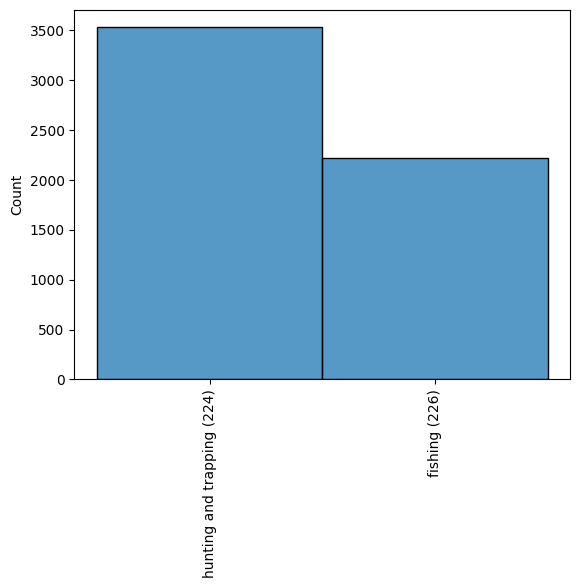

########## None LR 

########## Training LogisticRegression

########## 0.9365217391304348
              precision    recall  f1-score   support

         224      0.917     0.989     0.952       728
         226      0.978     0.846     0.907       422

    accuracy                          0.937      1150
   macro avg      0.948     0.917     0.929      1150
weighted avg      0.940     0.937     0.935      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


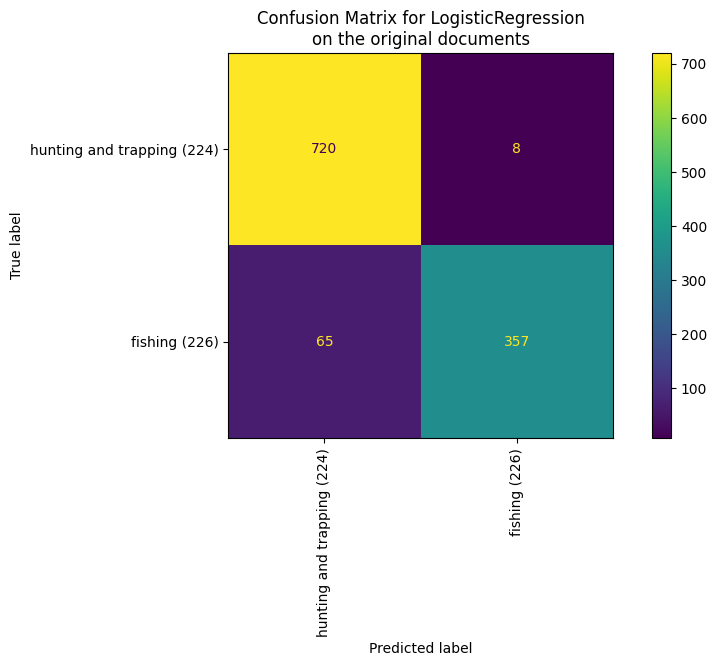

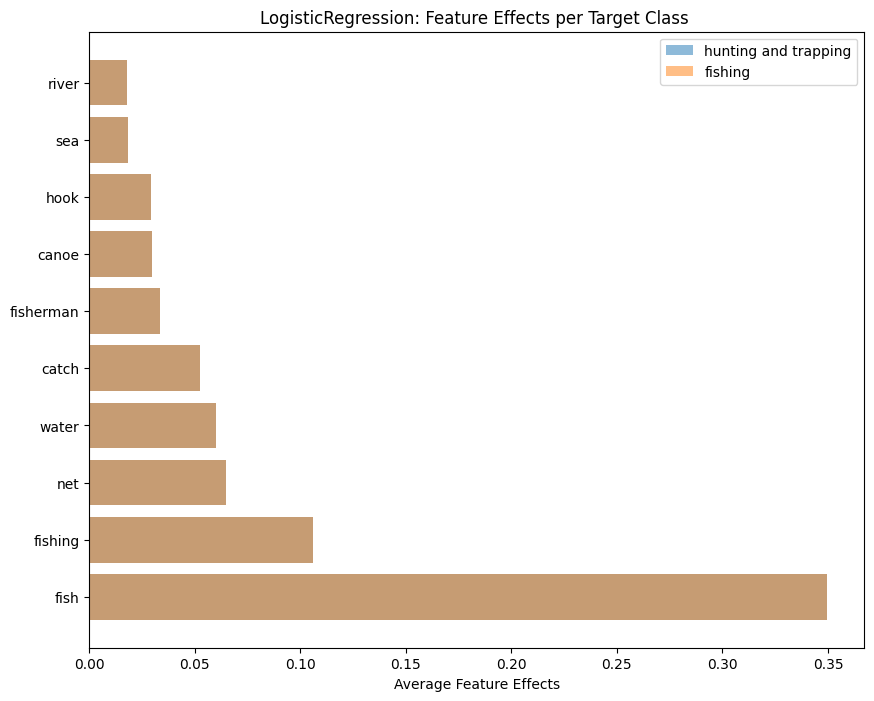

########## None SVM 

########## Training LinearSVC

########## 0.9408695652173913
              precision    recall  f1-score   support

         224      0.929     0.982     0.955       728
         226      0.966     0.870     0.915       422

    accuracy                          0.941      1150
   macro avg      0.947     0.926     0.935      1150
weighted avg      0.942     0.941     0.940      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



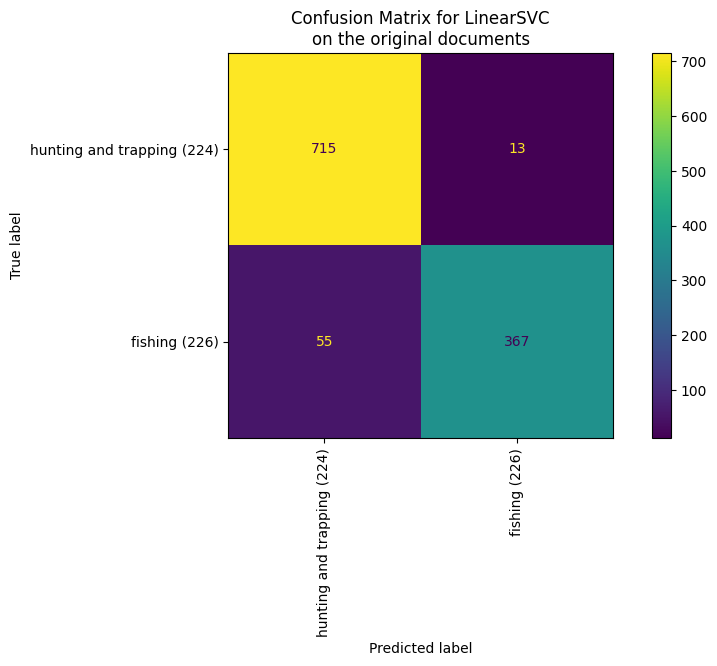

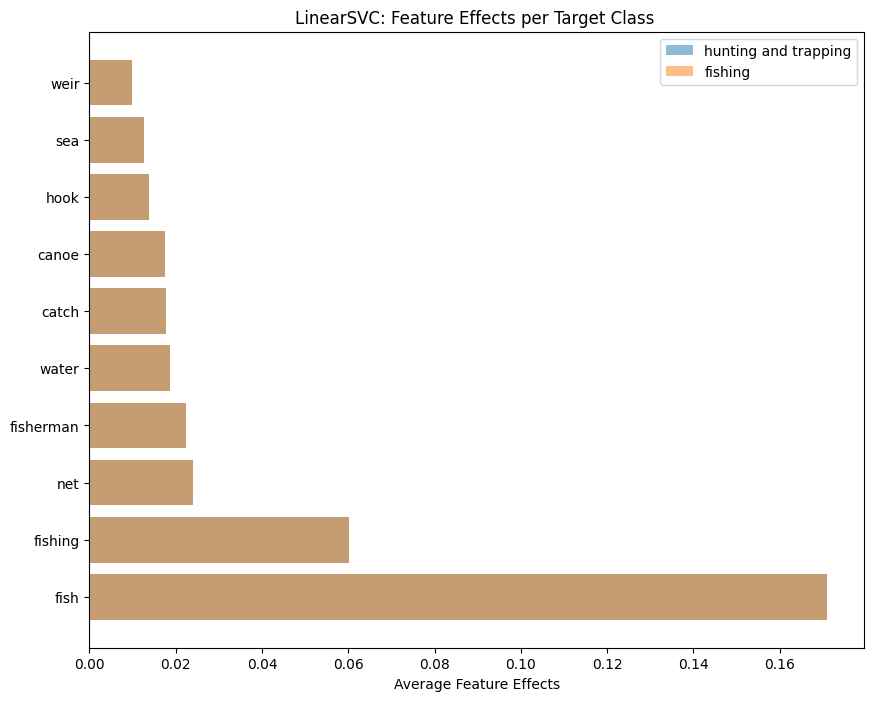

########## None RF 

########## Training RandomForestClassifier

########## 0.9365217391304348
              precision    recall  f1-score   support

         224      0.926     0.978     0.951       728
         226      0.958     0.865     0.909       422

    accuracy                          0.937      1150
   macro avg      0.942     0.921     0.930      1150
weighted avg      0.938     0.937     0.936      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


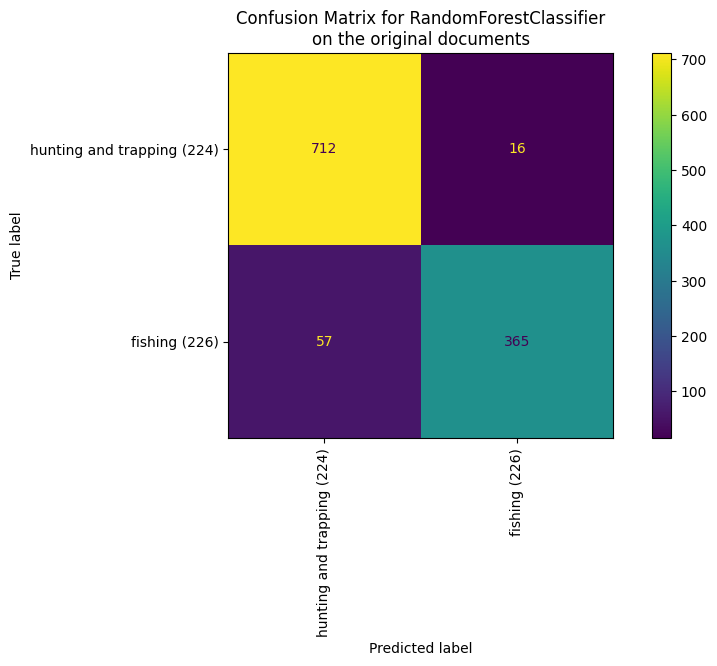

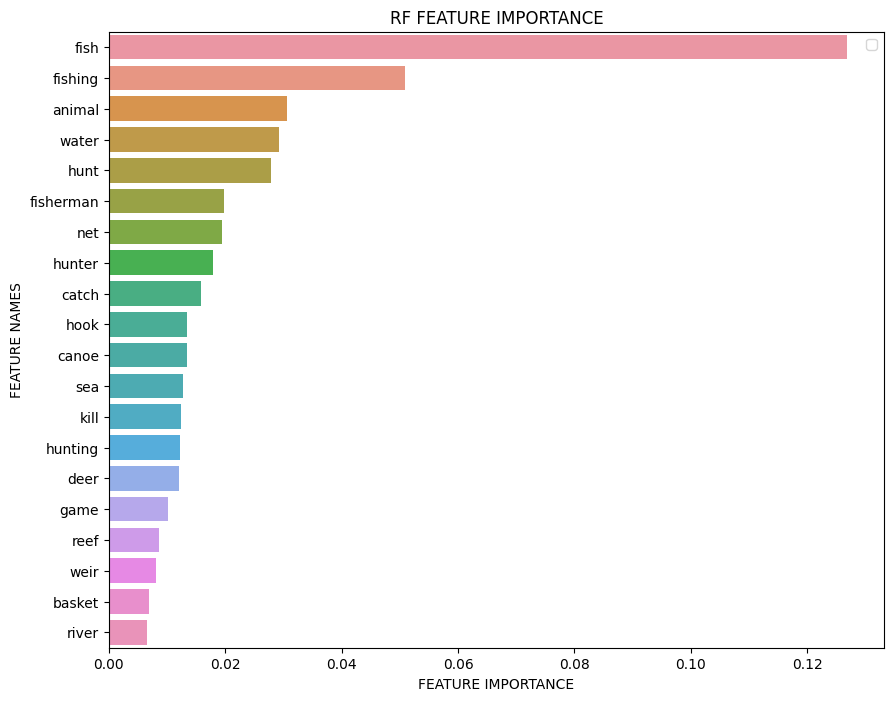

Iteration 2
Exclude: {'fishing', 'canoe', 'catch', 'hook', 'net', 'fish', 'water', 'sea', 'fisherman'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 36.376s at 0.071MB/s
n_samples: 4600, n_features: 3764
n_samples: 1150, n_features: 3764


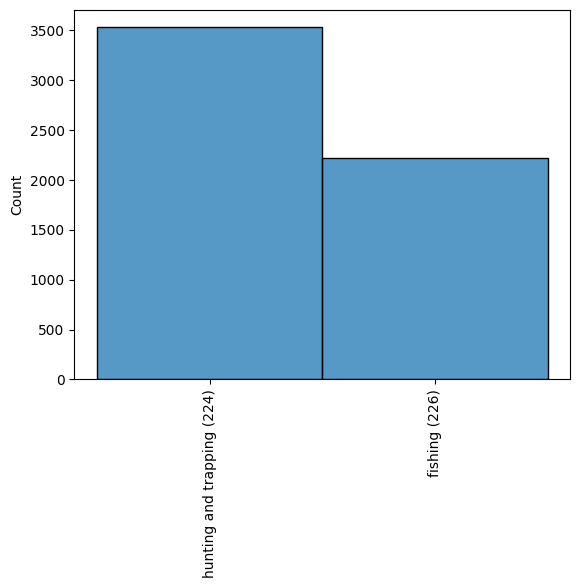

########## None LR 

########## Training LogisticRegression

########## 0.908695652173913
              precision    recall  f1-score   support

         224      0.879     0.981     0.927       682
         226      0.967     0.803     0.877       468

    accuracy                          0.909      1150
   macro avg      0.923     0.892     0.902      1150
weighted avg      0.915     0.909     0.907      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



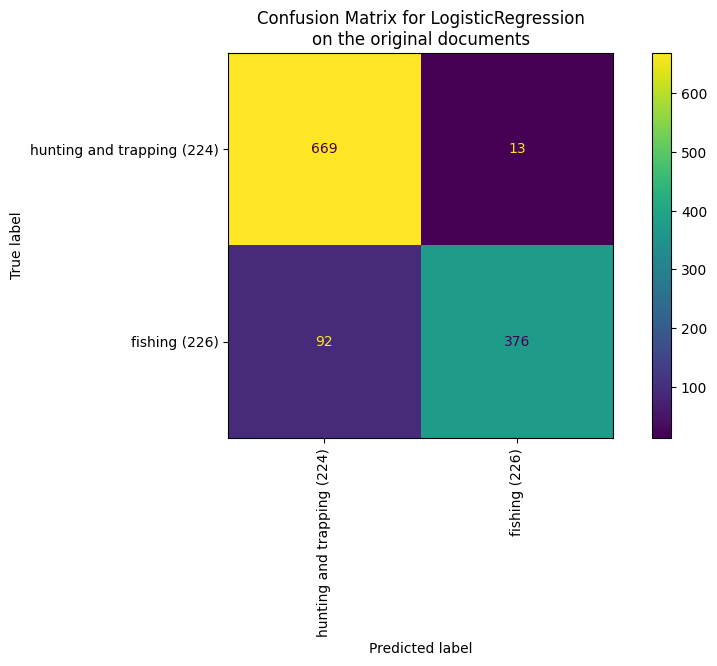

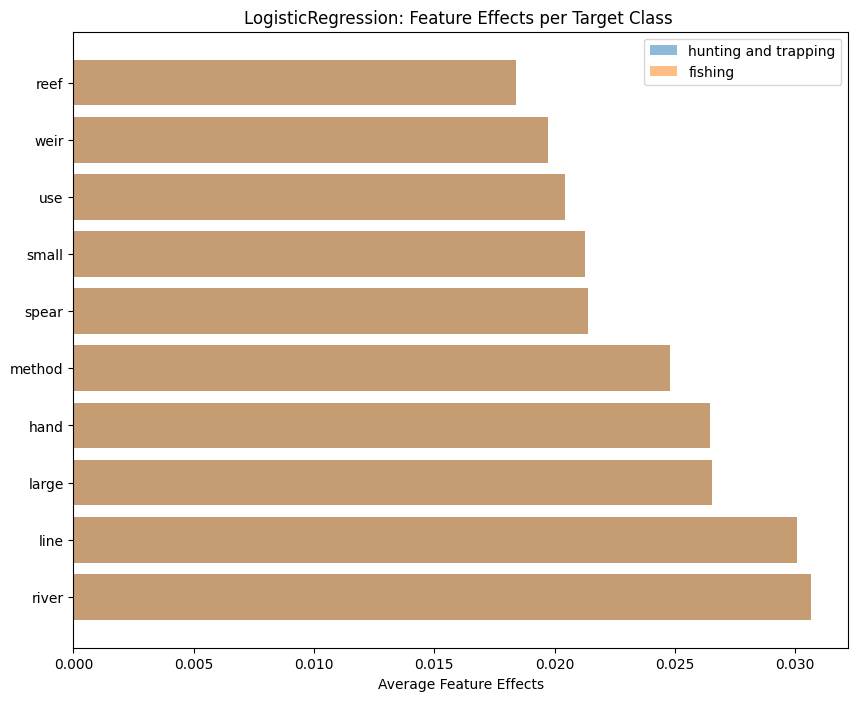

########## None SVM 

########## Training LinearSVC

########## 0.9139130434782609
              precision    recall  f1-score   support

         224      0.887     0.979     0.931       682
         226      0.965     0.818     0.886       468

    accuracy                          0.914      1150
   macro avg      0.926     0.899     0.908      1150
weighted avg      0.919     0.914     0.913      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



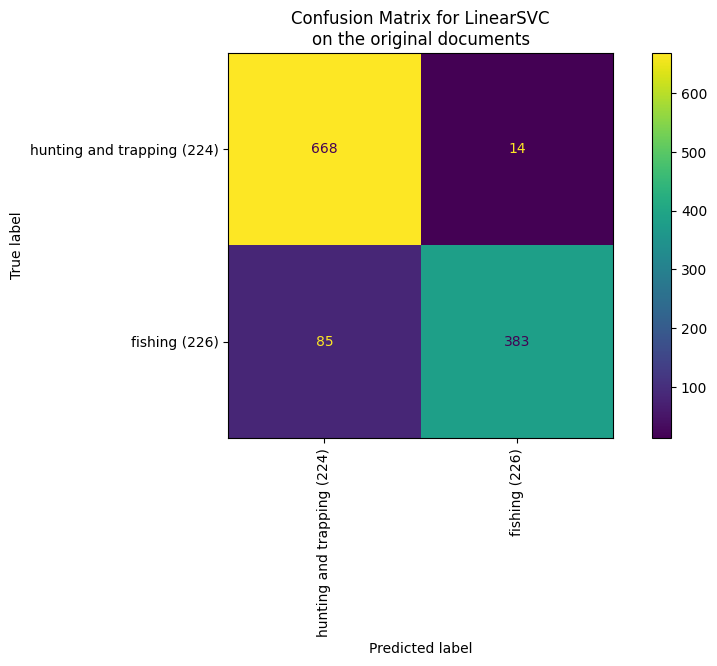

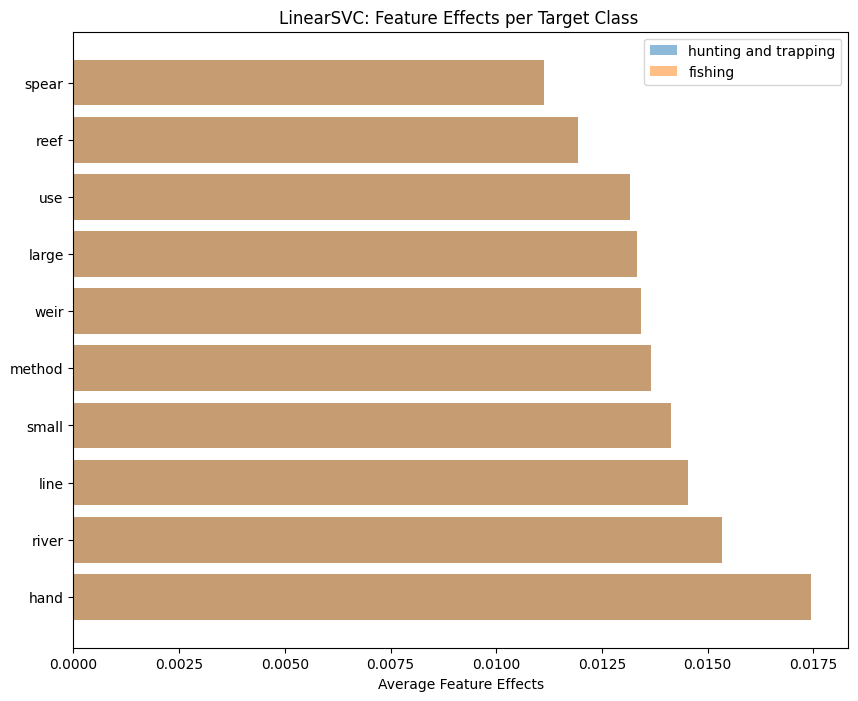

########## None RF 

########## Training RandomForestClassifier

########## 0.8965217391304348
              precision    recall  f1-score   support

         224      0.873     0.966     0.917       682
         226      0.942     0.795     0.862       468

    accuracy                          0.897      1150
   macro avg      0.907     0.881     0.890      1150
weighted avg      0.901     0.897     0.895      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


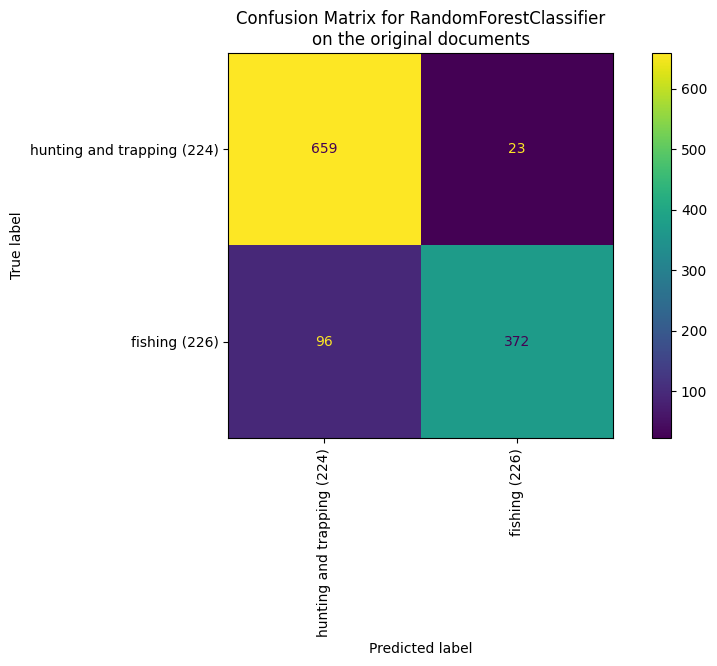

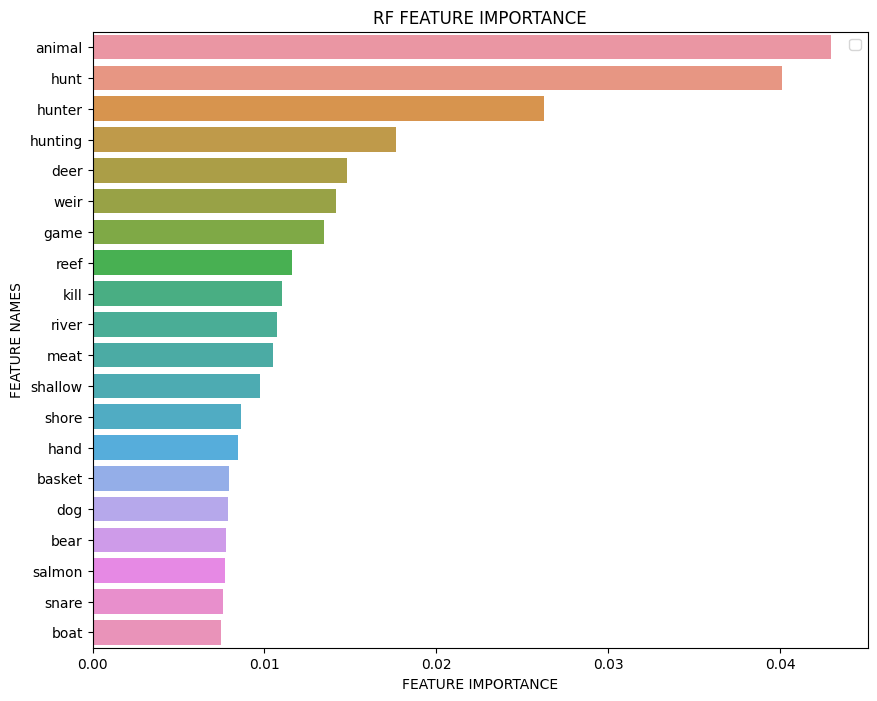

Iteration 3
Exclude: {'hand', 'river', 'fishing', 'reef', 'canoe', 'catch', 'hook', 'net', 'weir', 'fish', 'water', 'sea', 'fisherman'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 36.766s at 0.070MB/s
n_samples: 4600, n_features: 3759
n_samples: 1150, n_features: 3759


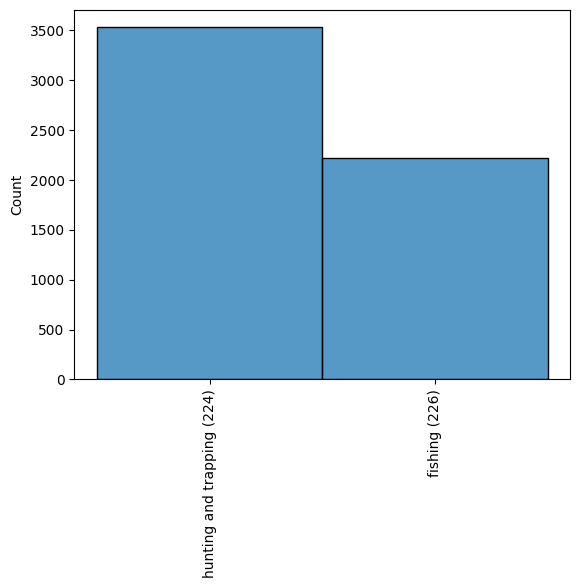

########## None LR 

########## Training LogisticRegression

########## 0.92
              precision    recall  f1-score   support

         224      0.910     0.966     0.937       711
         226      0.939     0.845     0.890       439

    accuracy                          0.920      1150
   macro avg      0.925     0.906     0.913      1150
weighted avg      0.921     0.920     0.919      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



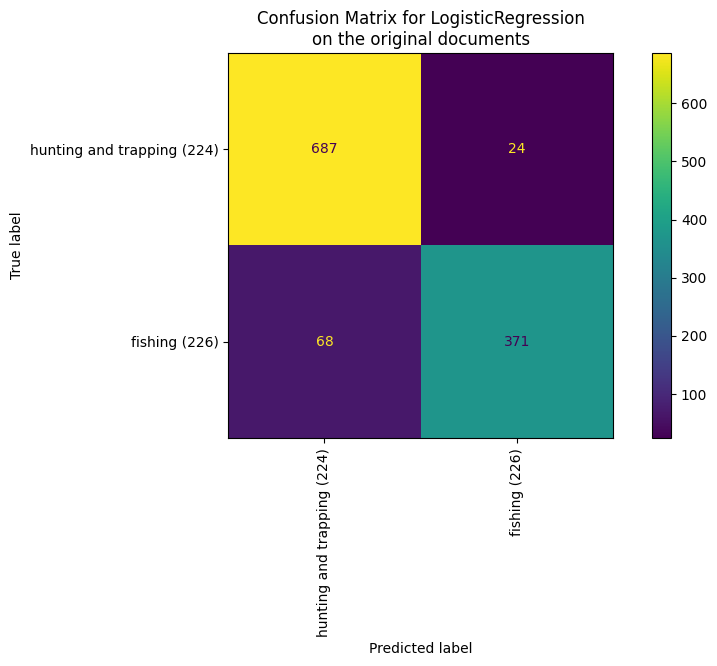

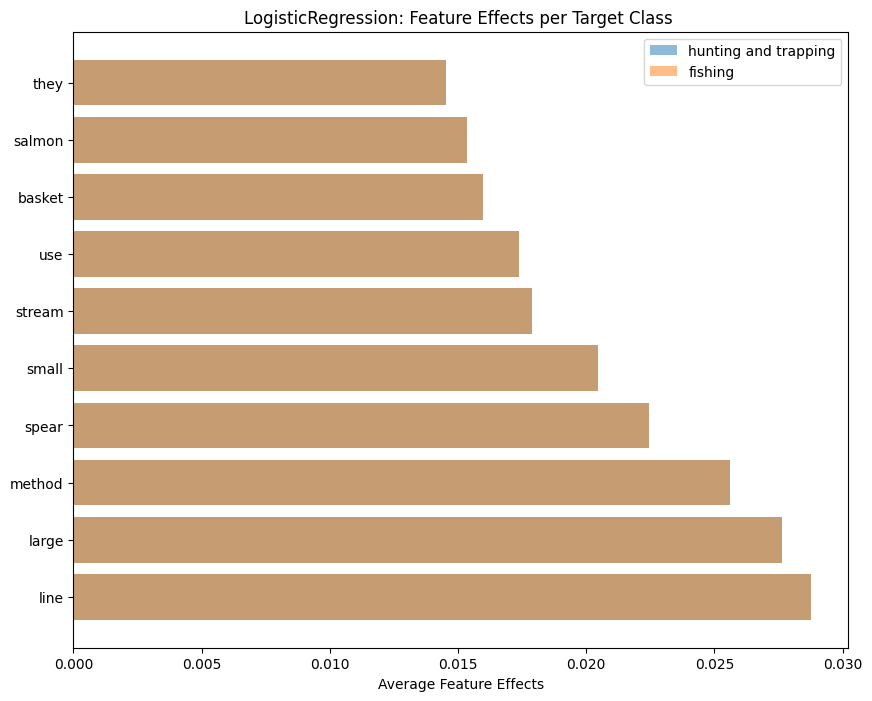

########## None SVM 

########## Training LinearSVC

########## 0.9182608695652174
              precision    recall  f1-score   support

         224      0.917     0.954     0.935       711
         226      0.920     0.861     0.889       439

    accuracy                          0.918      1150
   macro avg      0.919     0.907     0.912      1150
weighted avg      0.918     0.918     0.918      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



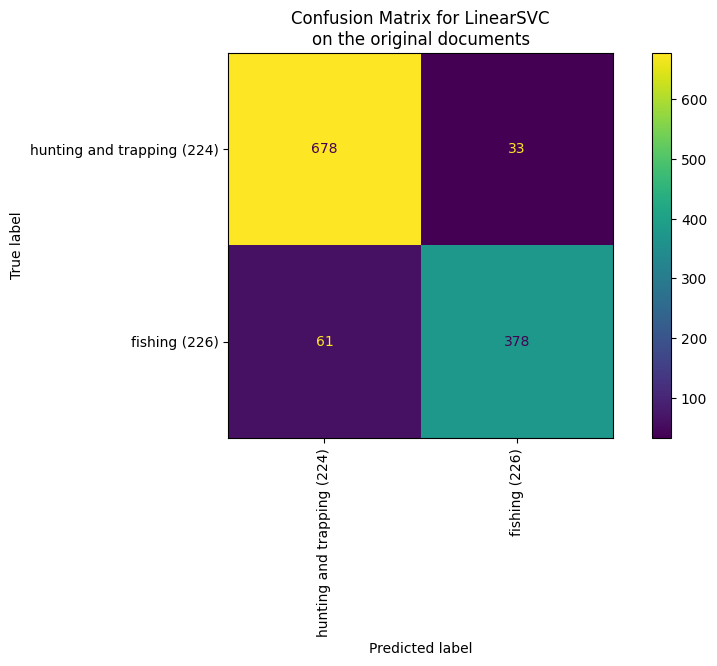

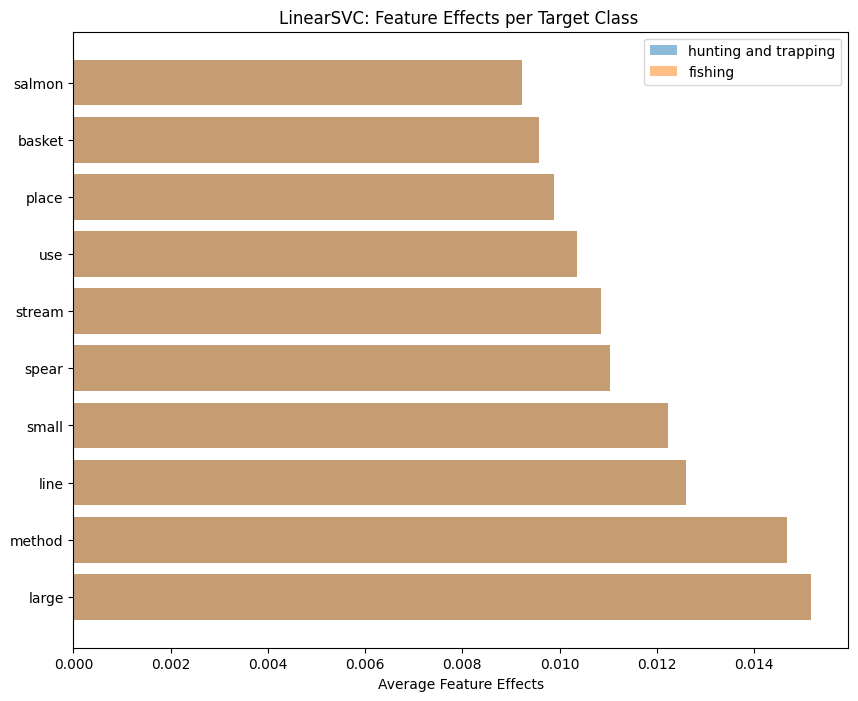

########## None RF 

########## Training RandomForestClassifier

########## 0.9156521739130434
              precision    recall  f1-score   support

         224      0.910     0.958     0.934       711
         226      0.925     0.847     0.885       439

    accuracy                          0.916      1150
   macro avg      0.918     0.903     0.909      1150
weighted avg      0.916     0.916     0.915      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


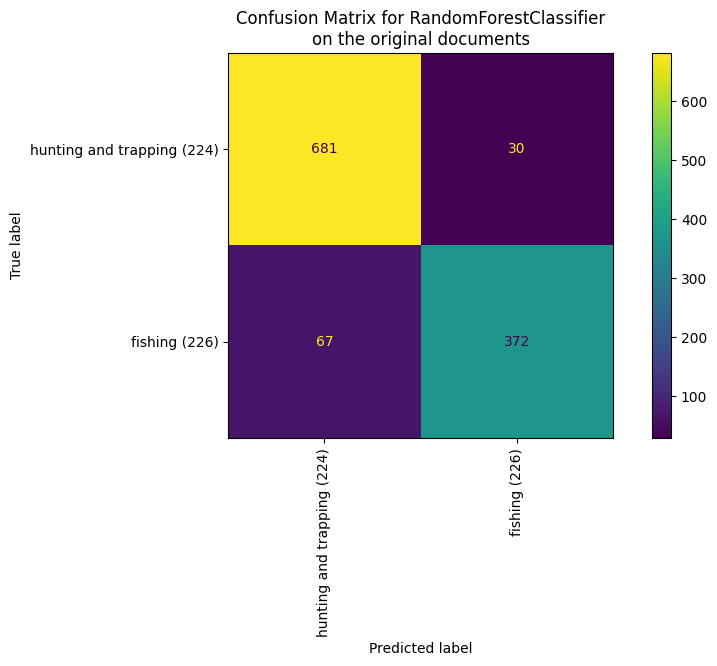

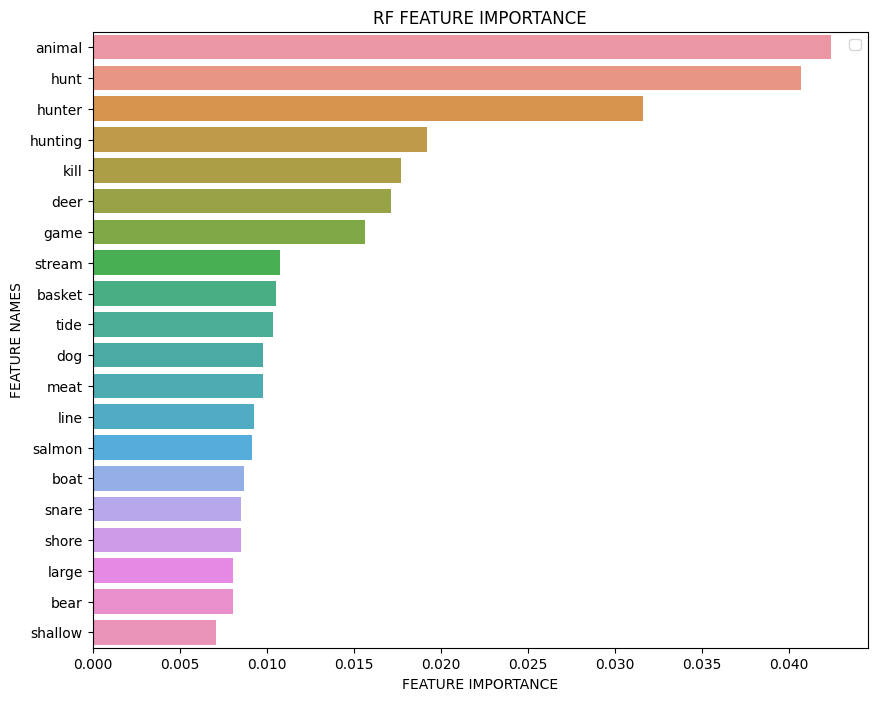

In [9]:
results = iterative_process(models=['LR', 'SVM', 'RF'], 
                  chosen_categories=[224, 226],
                  verbose=True)

In [10]:
results

defaultdict(dict,
            {0: {'df':         Unnamed: 0              sreid          section          sectpar   
              37152        39793    ep04-020-002397  ep04-020-002360  ep04-020-001207  \
              140795      153846    og11-004-033901  og11-004-033890  og11-004-033418   
              97691       107736    nh06-019-001788  nh06-019-001145  nh06-019-001133   
              78957        88226    na08-001-021823  na08-001-021702  na08-001-002260   
              28408        30442  aw32-007-006929-0  aw32-007-006902  aw32-007-006626   
              ...            ...                ...              ...              ...   
              81948        91295    nd07-003-000444  nd07-003-000390              NaN   
              83163        92592    nd07-021-012468  nd07-021-011843              NaN   
              135657      147836    oc06-005-001423  oc06-005-001352  oc06-005-000076   
              31532        33858    ef06-019-002286  ef06-019-002230  ef06-019-0015

### 241 and 243

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5043 documents - 2.13MB (training set)
2 categories
vectorize training done in 26.615s at 0.080MB/s
n_samples: 4034, n_features: 3284
n_samples: 1009, n_features: 3284


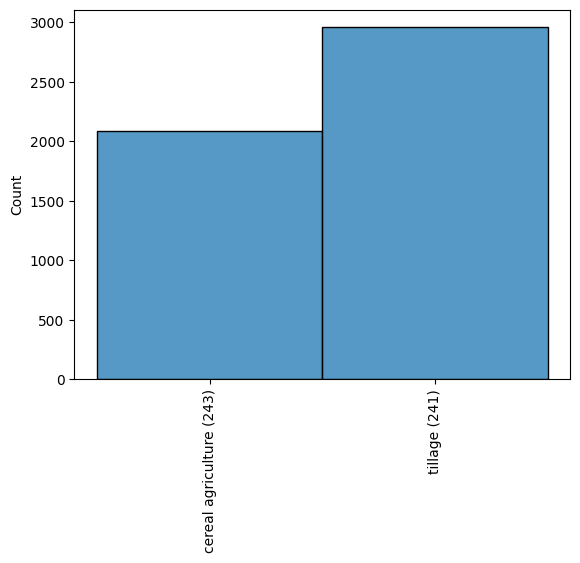

########## None LR 

########## Training LogisticRegression

########## 0.7948463825569871
              precision    recall  f1-score   support

         241      0.790     0.908     0.845       620
         243      0.807     0.614     0.698       389

    accuracy                          0.795      1009
   macro avg      0.799     0.761     0.771      1009
weighted avg      0.796     0.795     0.788      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



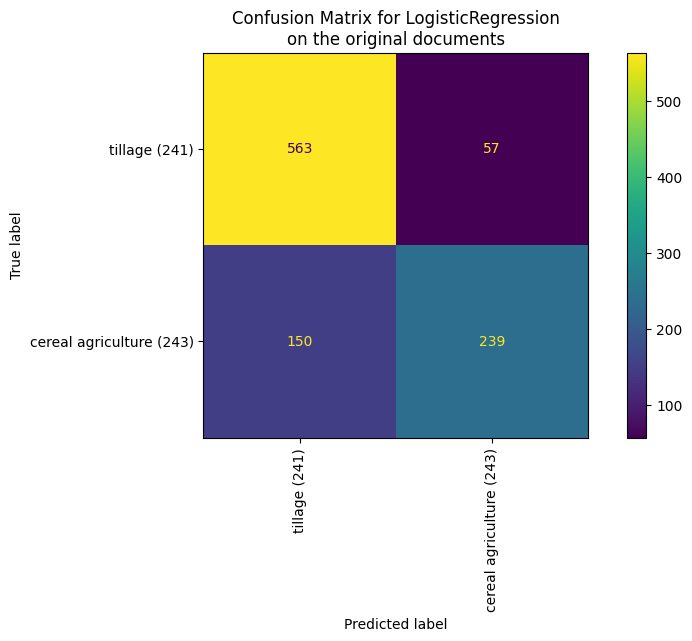

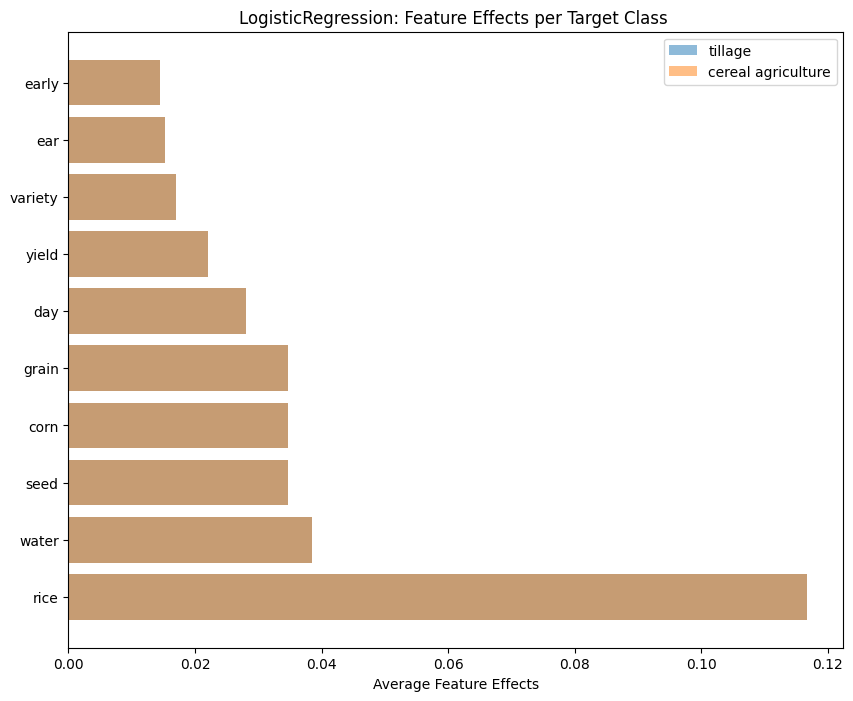

########## None SVM 

########## Training LinearSVC

########## 0.7809712586719524
              precision    recall  f1-score   support

         241      0.803     0.853     0.827       620
         243      0.740     0.666     0.701       389

    accuracy                          0.781      1009
   macro avg      0.771     0.760     0.764      1009
weighted avg      0.779     0.781     0.779      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



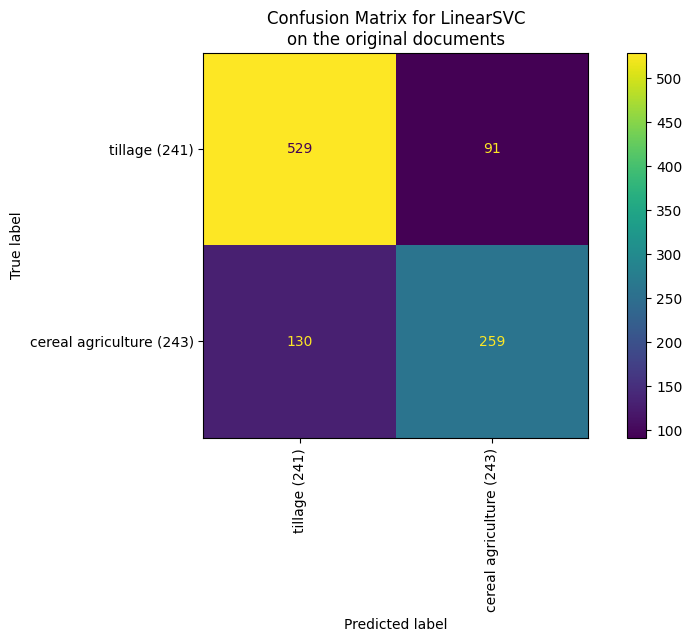

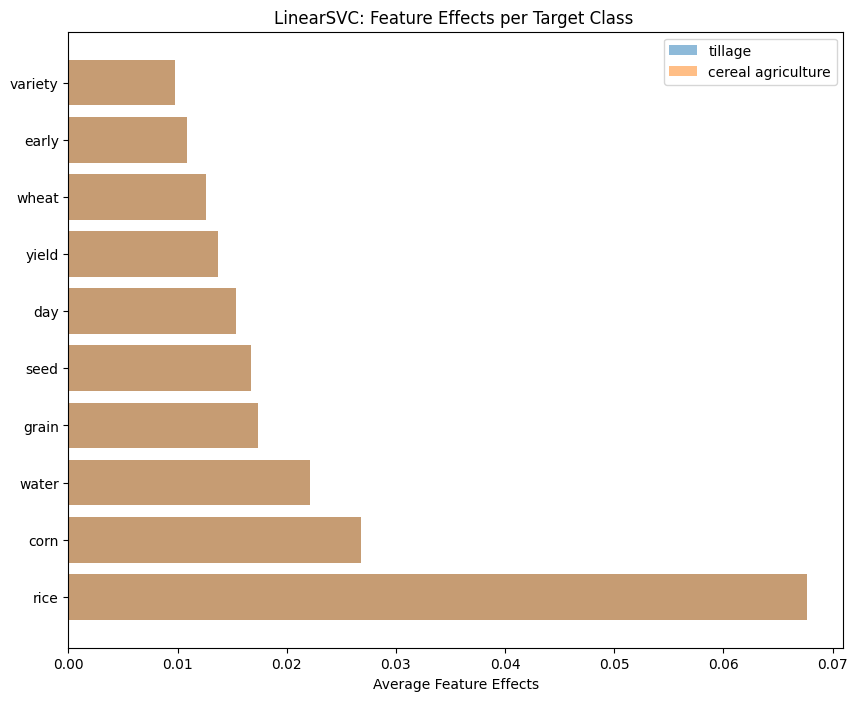

########## None RF 

########## Training RandomForestClassifier

########## 0.7651139742319127
              precision    recall  f1-score   support

         241      0.824     0.785     0.804       620
         243      0.682     0.733     0.706       389

    accuracy                          0.765      1009
   macro avg      0.753     0.759     0.755      1009
weighted avg      0.769     0.765     0.767      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


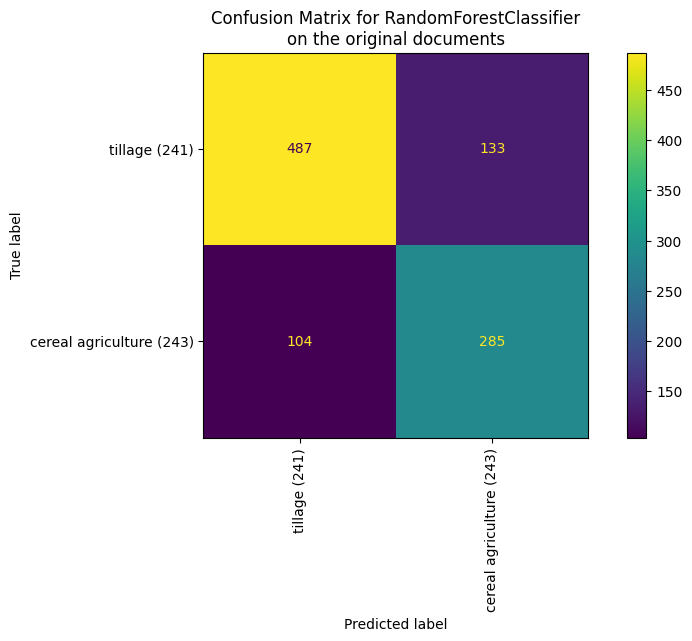

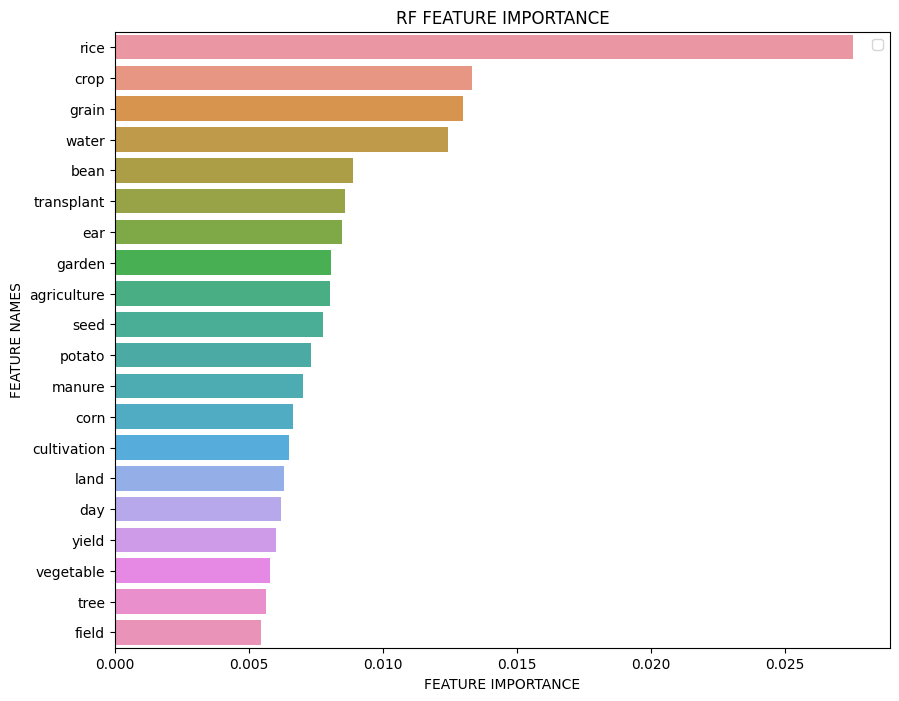

Iteration 2
Exclude: {'tree', 'early', 'agriculture', 'transplant', 'wheat', 'ear', 'yield', 'garden', 'crop', 'rice', 'manure', 'water', 'vegetable', 'cultivation', 'field', 'land', 'corn', 'grain', 'bean', 'potato', 'day', 'seed', 'variety'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5043 documents - 2.13MB (training set)
2 categories
vectorize training done in 31.105s at 0.069MB/s
n_samples: 4034, n_features: 3244
n_samples: 1009, n_features: 3244


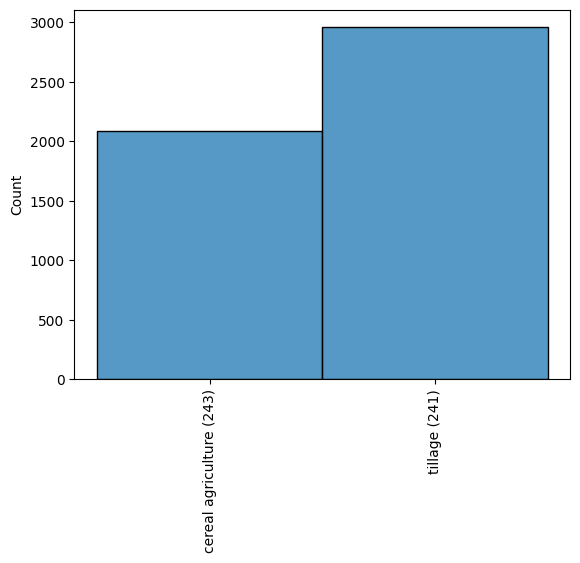

########## None LR 

########## Training LogisticRegression

########## 0.7393458870168483
              precision    recall  f1-score   support

         241      0.726     0.897     0.802       595
         243      0.777     0.512     0.617       414

    accuracy                          0.739      1009
   macro avg      0.751     0.705     0.710      1009
weighted avg      0.746     0.739     0.726      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



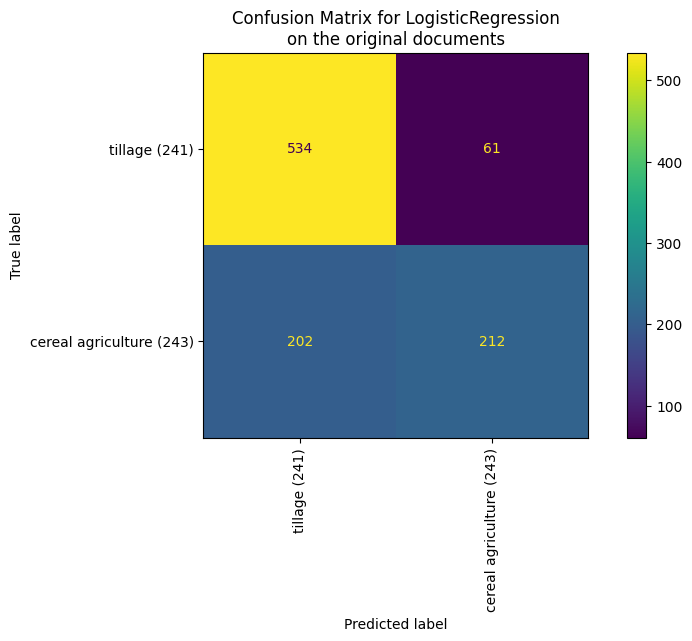

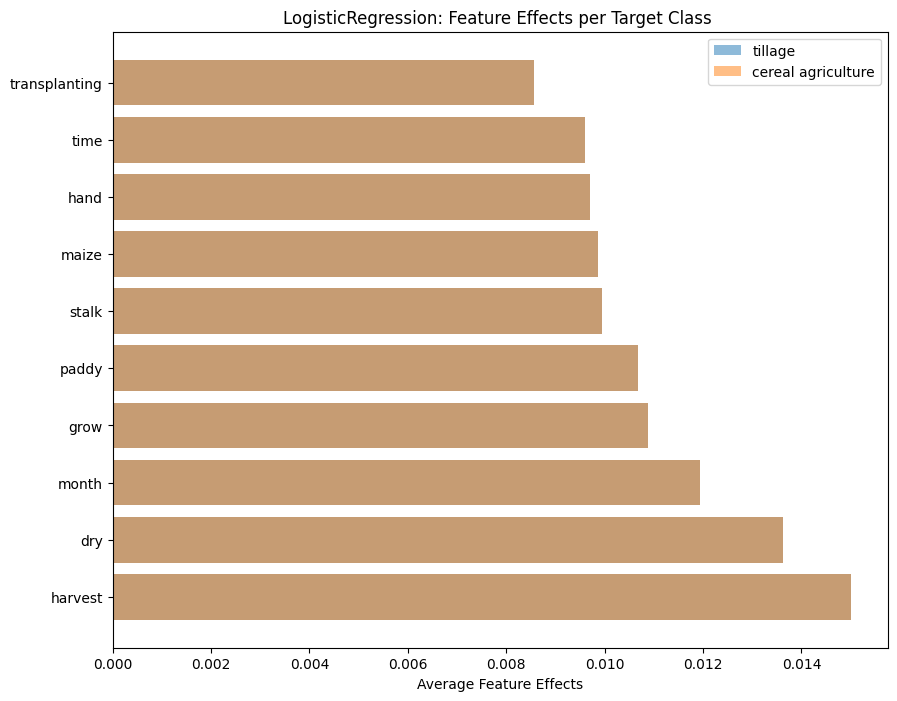

########## None SVM 

########## Training LinearSVC

########## 0.7383548067393458
              precision    recall  f1-score   support

         241      0.743     0.850     0.793       595
         243      0.729     0.577     0.644       414

    accuracy                          0.738      1009
   macro avg      0.736     0.714     0.719      1009
weighted avg      0.737     0.738     0.732      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



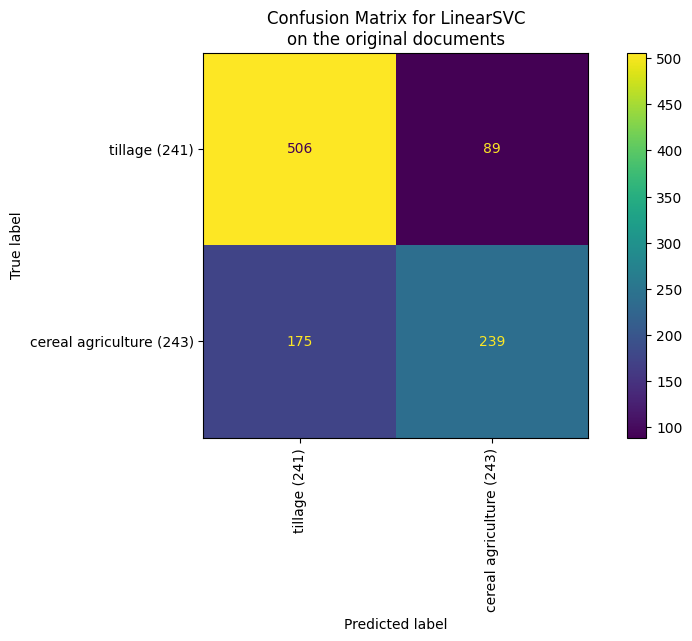

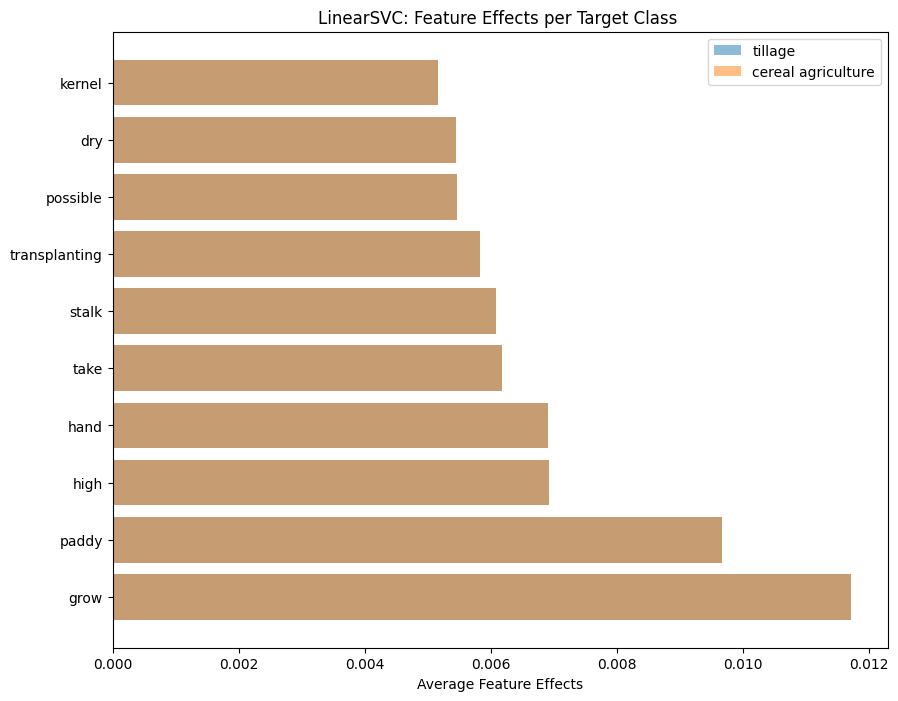

########## None RF 

########## Training RandomForestClassifier

########## 0.7234886025768087
              precision    recall  f1-score   support

         241      0.771     0.756     0.763       595
         243      0.659     0.676     0.667       414

    accuracy                          0.723      1009
   macro avg      0.715     0.716     0.715      1009
weighted avg      0.725     0.723     0.724      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


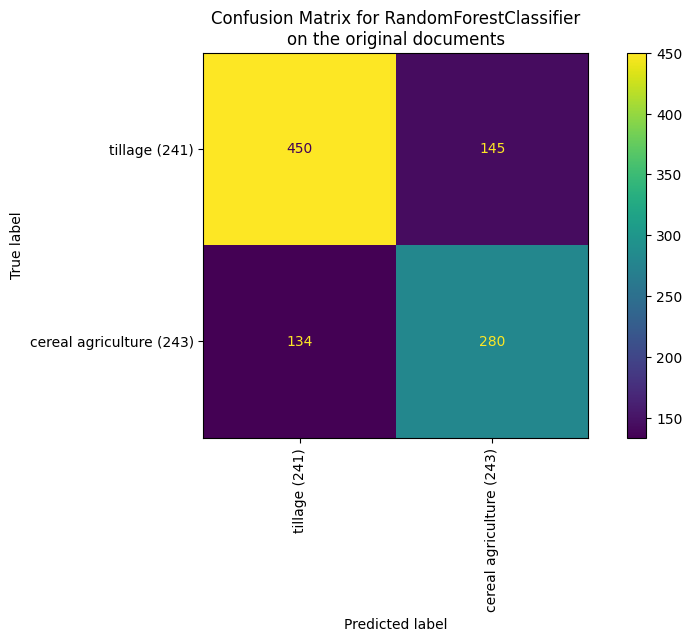

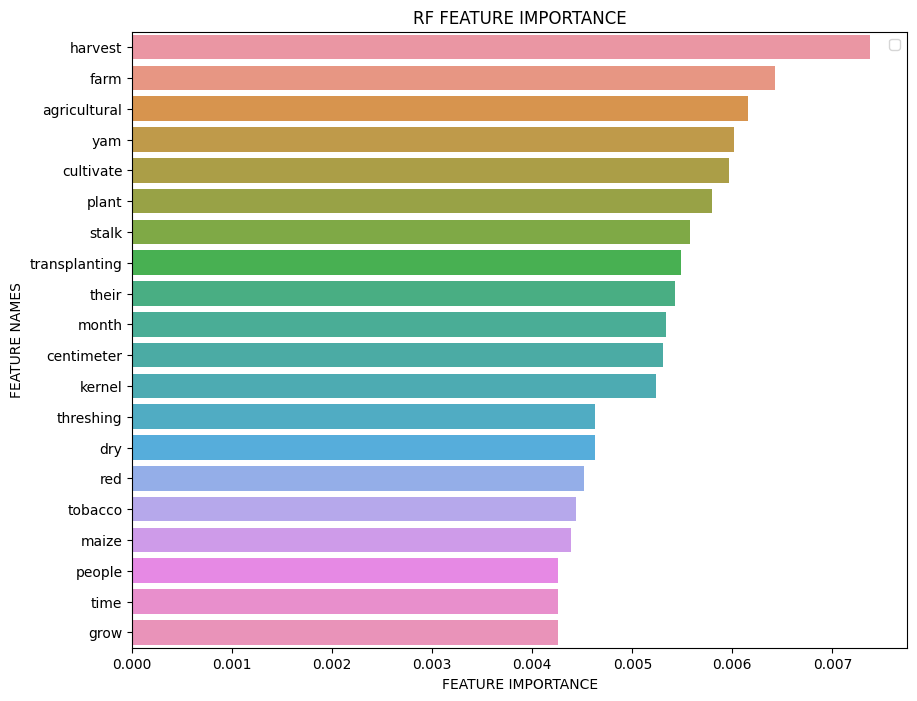

Iteration 3
Exclude: {'kernel', 'agriculture', 'possible', 'cultivate', 'wheat', 'ear', 'garden', 'crop', 'time', 'paddy', 'people', 'cultivation', 'hand', 'grow', 'month', 'field', 'land', 'transplanting', 'corn', 'centimeter', 'bean', 'potato', 'threshing', 'variety', 'their', 'tree', 'early', 'take', 'maize', 'transplant', 'yield', 'red', 'rice', 'manure', 'dry', 'harvest', 'farm', 'water', 'vegetable', 'agricultural', 'yam', 'stalk', 'tobacco', 'high', 'grain', 'day', 'seed', 'plant'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5043 documents - 2.13MB (training set)
2 categories
vectorize training done in 33.903s at 0.063MB/s
n_samples: 4034, n_features: 3210
n_samples: 1009, n_features: 3210


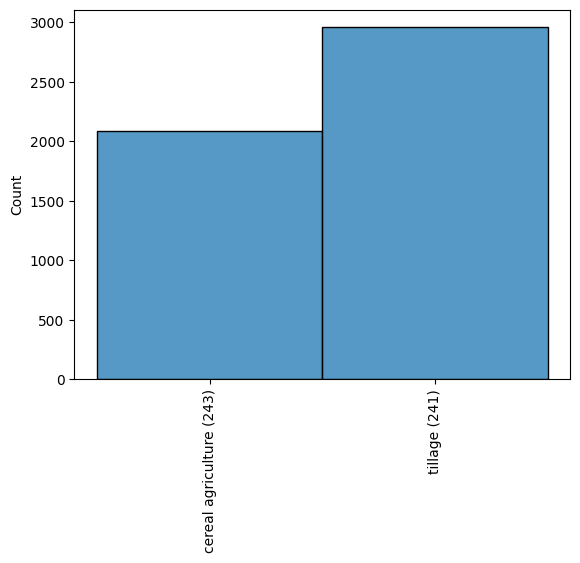

########## None LR 

########## Training LogisticRegression

########## 0.7443012884043607
              precision    recall  f1-score   support

         241      0.734     0.901     0.809       606
         243      0.774     0.509     0.614       403

    accuracy                          0.744      1009
   macro avg      0.754     0.705     0.711      1009
weighted avg      0.750     0.744     0.731      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



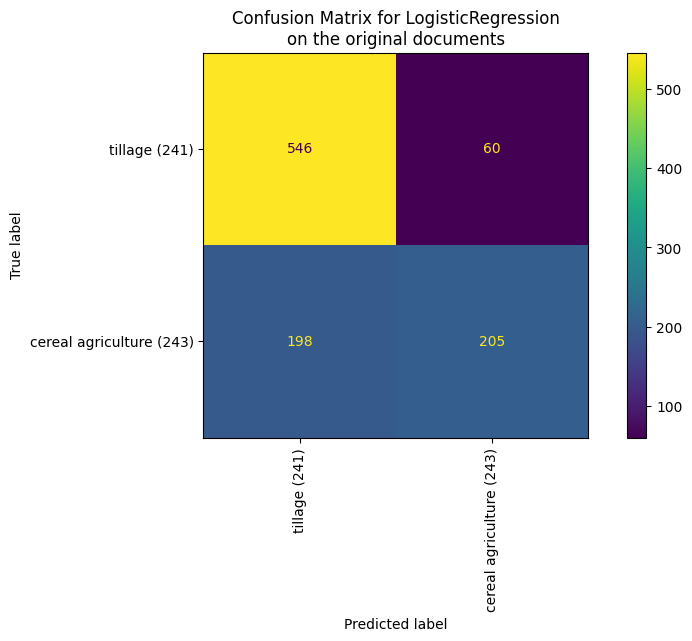

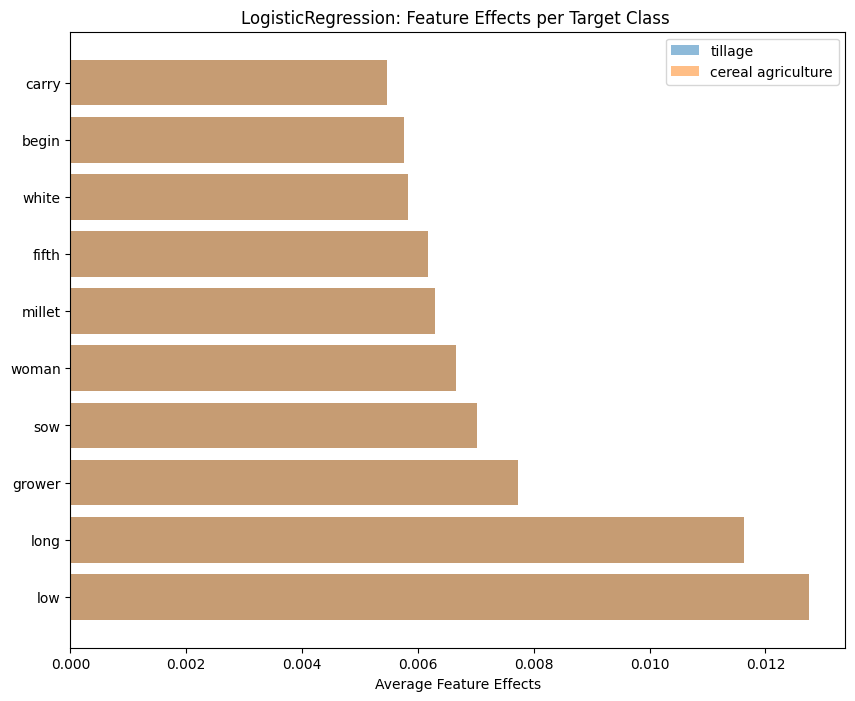

########## None SVM 

########## Training LinearSVC

########## 0.7165510406342914
              precision    recall  f1-score   support

         241      0.814     0.685     0.744       606
         243      0.617     0.764     0.683       403

    accuracy                          0.717      1009
   macro avg      0.715     0.725     0.713      1009
weighted avg      0.735     0.717     0.719      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



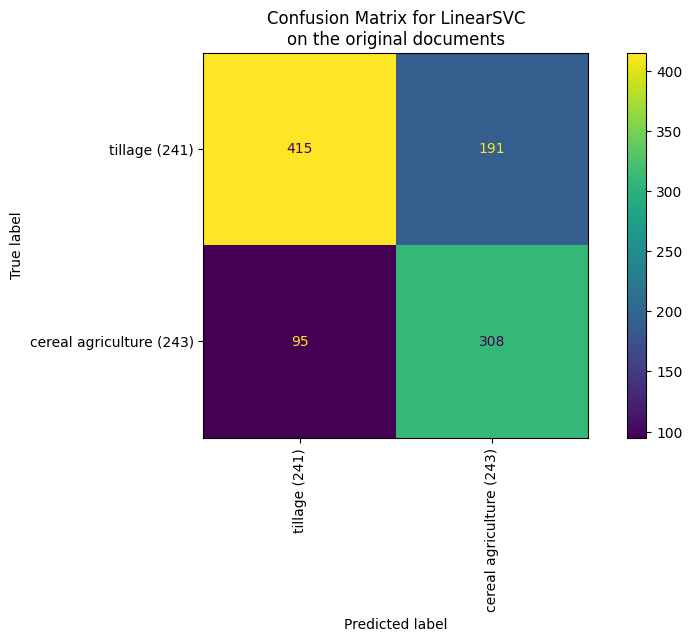

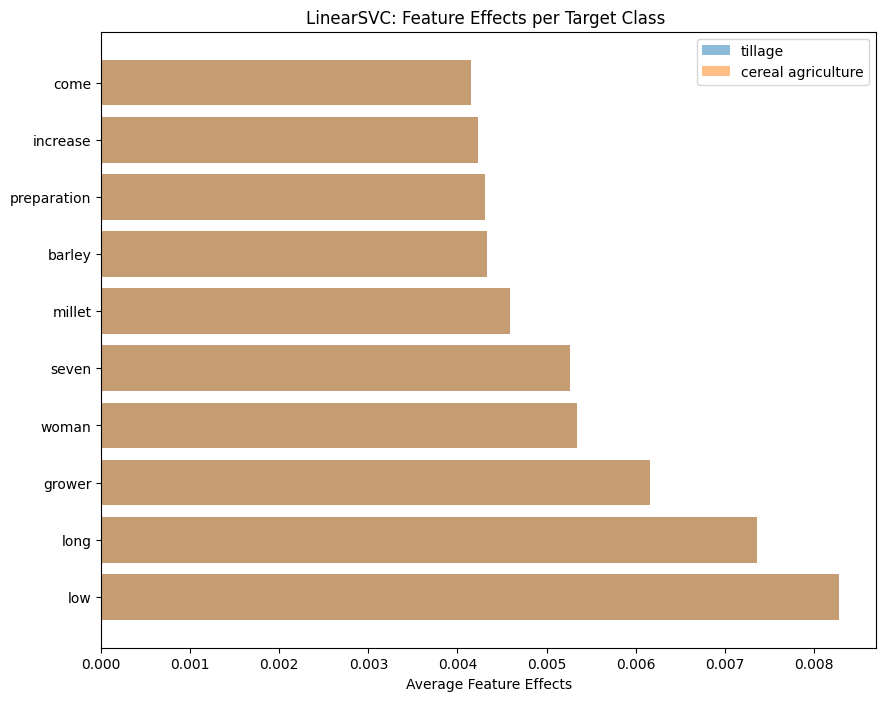

########## None RF 

########## Training RandomForestClassifier

########## 0.7036669970267592
              precision    recall  f1-score   support

         241      0.768     0.726     0.746       606
         243      0.619     0.670     0.644       403

    accuracy                          0.704      1009
   macro avg      0.694     0.698     0.695      1009
weighted avg      0.709     0.704     0.705      1009



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


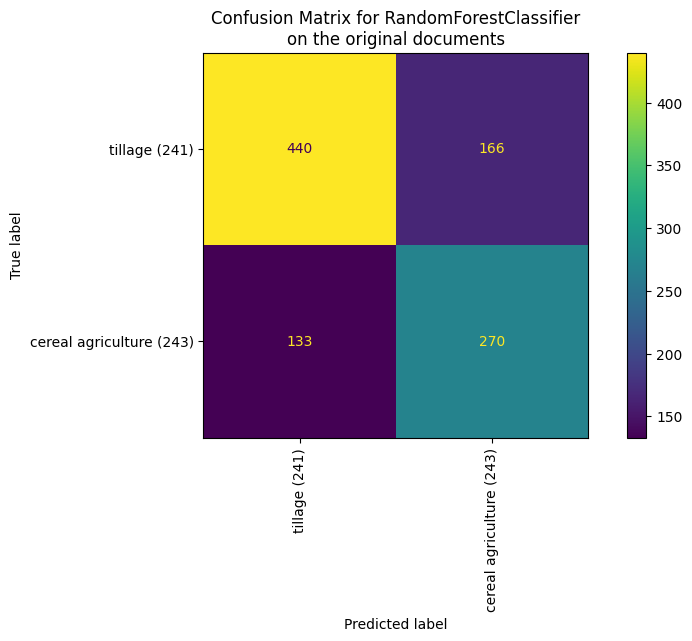

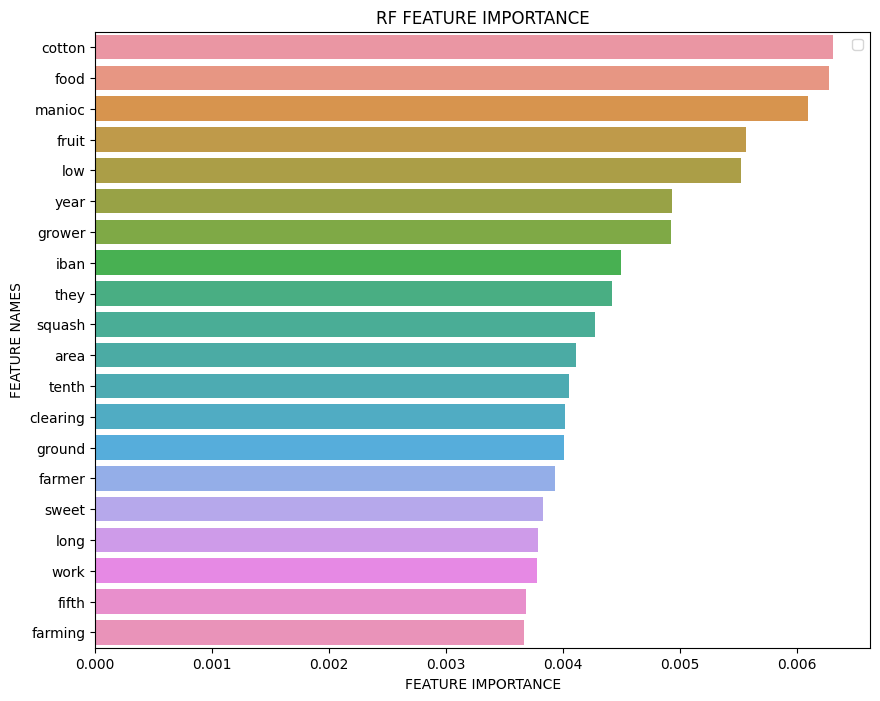

In [11]:
results = iterative_process(common_indicators=False,
                            models=['LR', 'SVM', 'RF'], 
                            chosen_categories=[241, 243], 
                            verbose=True)

In [12]:
results

defaultdict(dict,
            {0: {'df':         Unnamed: 0              sreid          section          sectpar   
              26978        28925    aw16-038-008982  aw16-038-008810  aw16-038-008801  \
              38056        40697  er06-008-001251-0  er06-008-001206              NaN   
              170459      186351    sf05-002-002005  sf05-002-001966  sf05-002-001509   
              171243      187189    sg04-004-000733  sg04-004-000056              NaN   
              18617        19336    ao07-025-002781  ao07-025-002738  ao07-025-001640   
              ...            ...                ...              ...              ...   
              272            390    aa01-007-002677  aa01-007-002640  aa01-007-001812   
              171311      187258    sg04-010-008022  sg04-010-007930  sg04-010-007802   
              142350      155739    oj23-008-003236  oj23-008-003212  oj23-008-003194   
              177611      193957    sq13-005-000303  sq13-005-000300  sq13-005-0000

# Cat vs subcategories (binary classification)

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 47.634s at 0.081MB/s
n_samples: 6973, n_features: 4938
n_samples: 1744, n_features: 4938


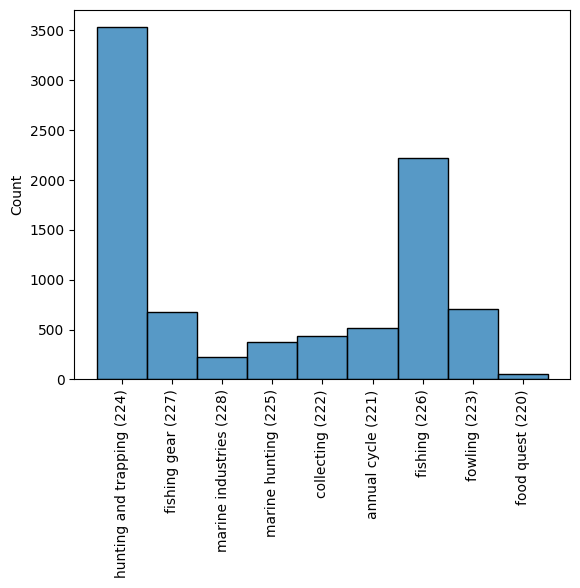

########## None LR 

########## Training LogisticRegression

########## 0.8887614678899083
              precision    recall  f1-score   support

         220      0.865     0.954     0.907       997
         224      0.929     0.802     0.861       747

    accuracy                          0.889      1744
   macro avg      0.897     0.878     0.884      1744
weighted avg      0.892     0.889     0.887      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



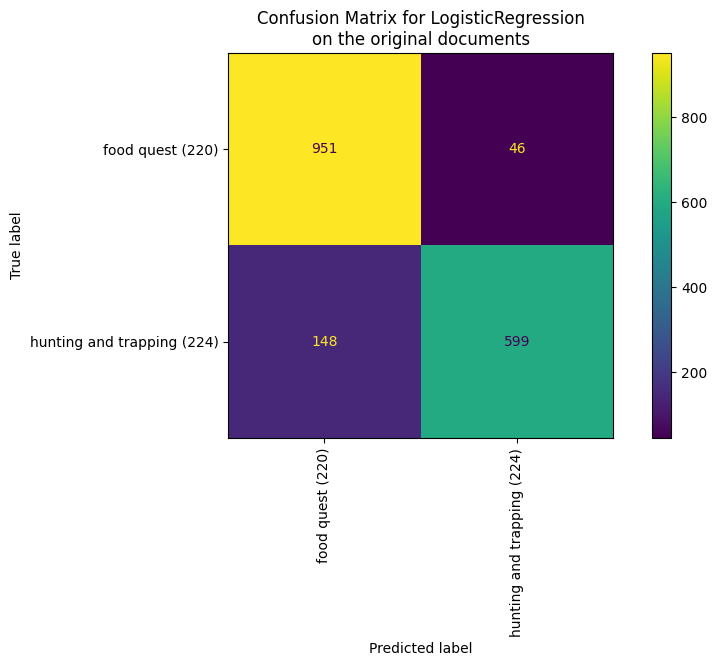

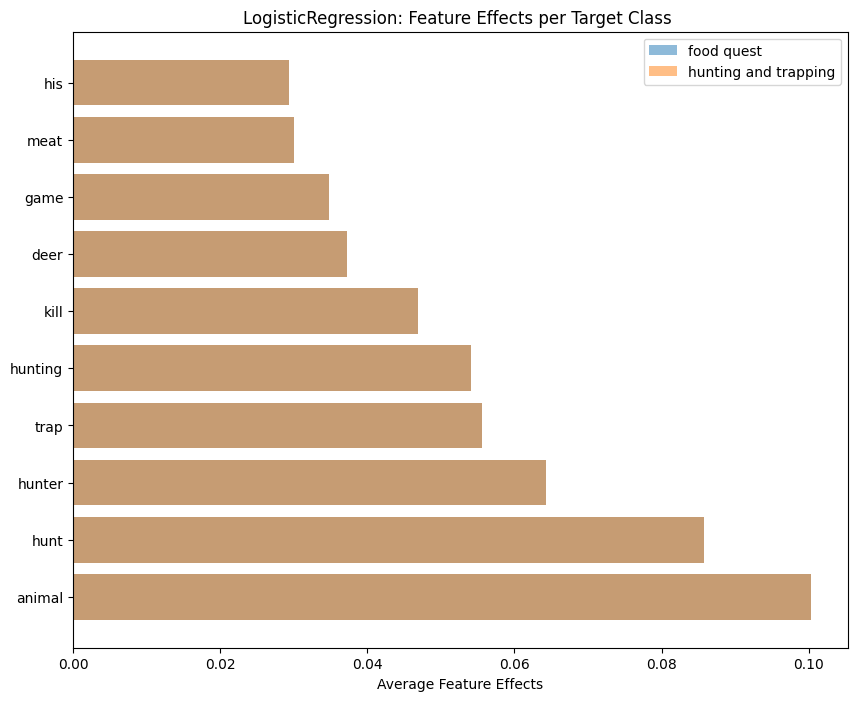

########## None SVM 

########## Training LinearSVC

########## 0.8910550458715596
              precision    recall  f1-score   support

         220      0.871     0.950     0.909       997
         224      0.924     0.813     0.865       747

    accuracy                          0.891      1744
   macro avg      0.898     0.881     0.887      1744
weighted avg      0.894     0.891     0.890      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



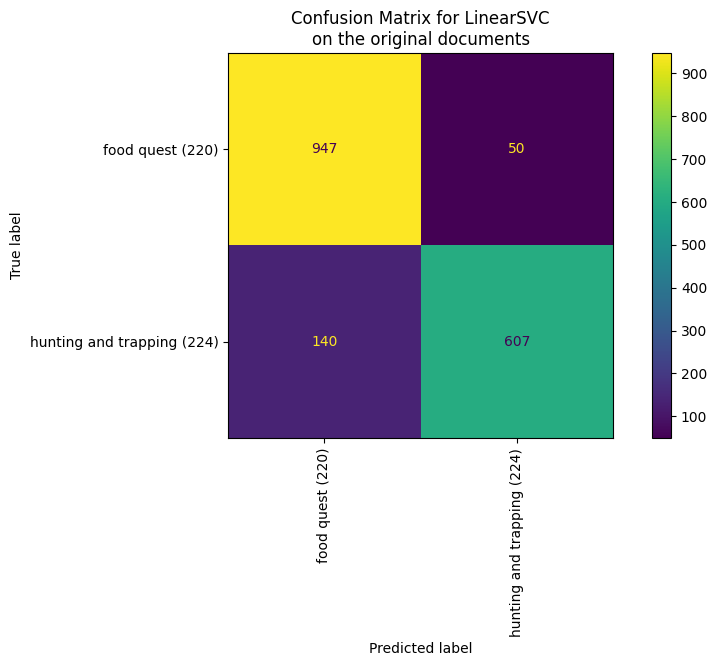

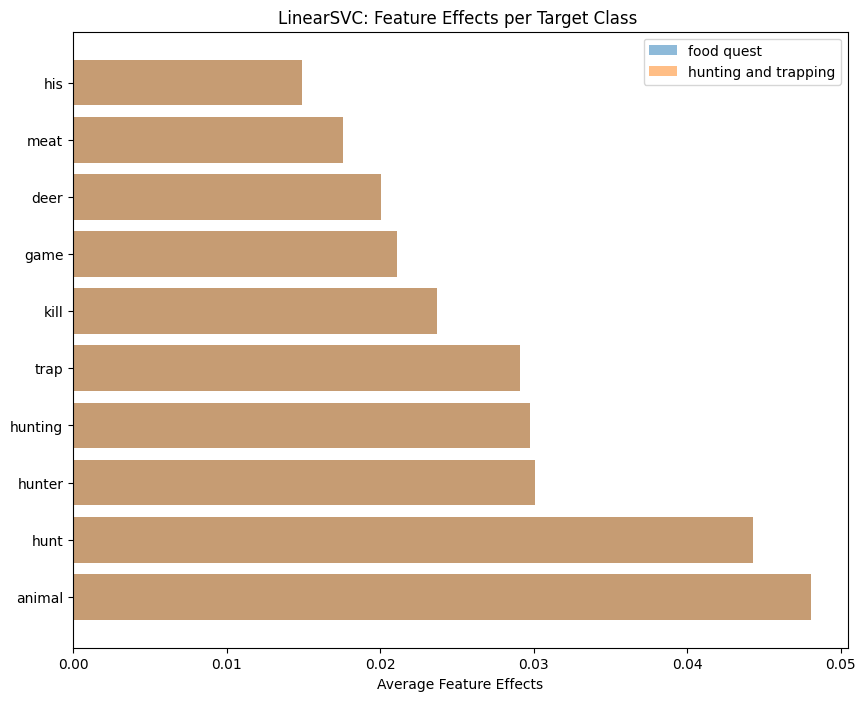

########## None RF 

########## Training RandomForestClassifier

########## 0.8704128440366973
              precision    recall  f1-score   support

         220      0.861     0.922     0.891       997
         224      0.885     0.802     0.841       747

    accuracy                          0.870      1744
   macro avg      0.873     0.862     0.866      1744
weighted avg      0.871     0.870     0.869      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


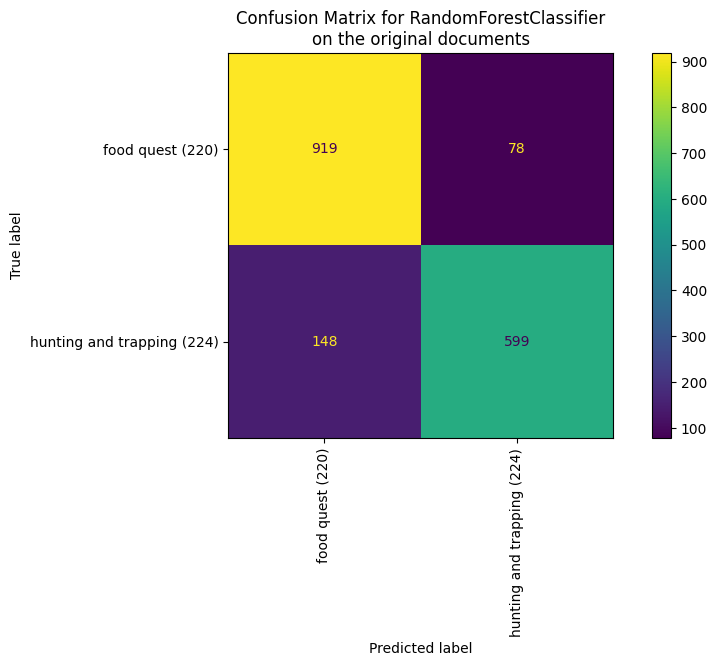

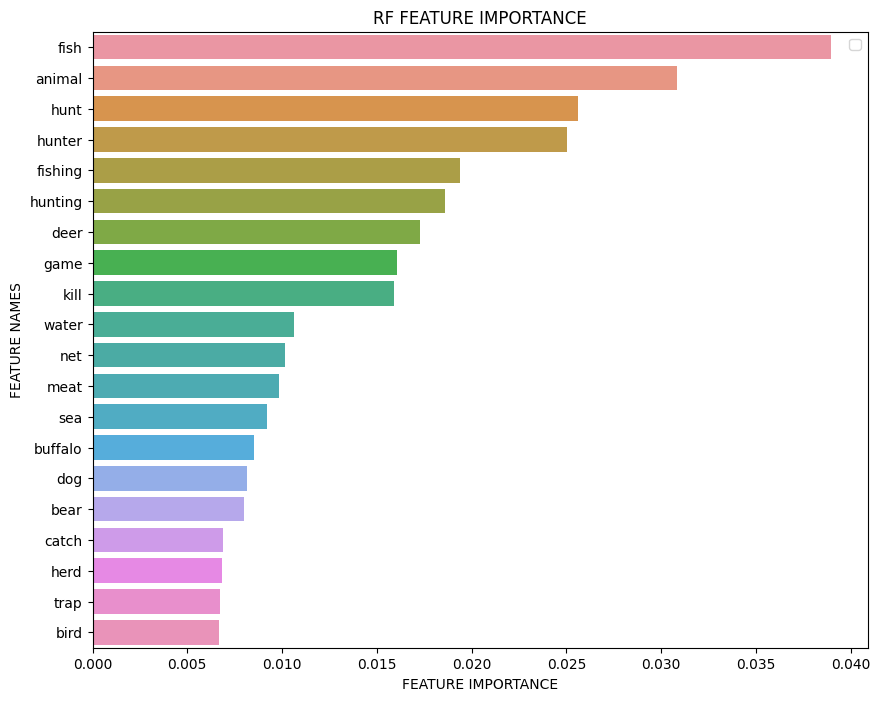

Iteration 2
Exclude: {'buffalo', 'his', 'meat', 'catch', 'hunter', 'fish', 'water', 'sea', 'game', 'deer', 'bird', 'kill', 'hunting', 'bear', 'fishing', 'dog', 'net', 'herd', 'trap', 'animal', 'hunt'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 58.177s at 0.066MB/s
n_samples: 6973, n_features: 4900
n_samples: 1744, n_features: 4900


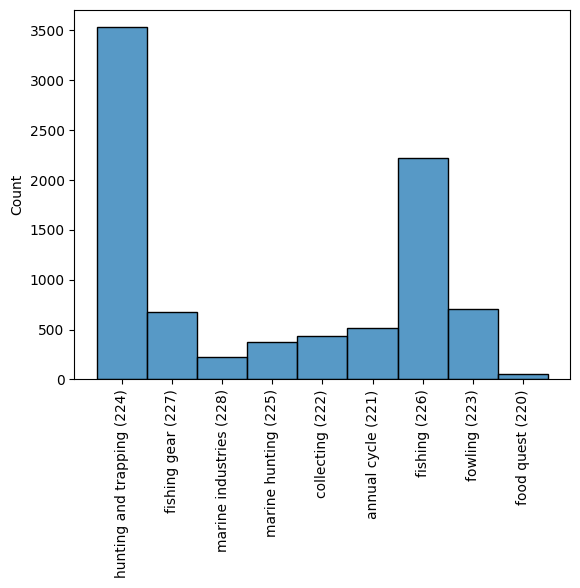

########## None LR 

########## Training LogisticRegression

########## 0.8360091743119266
              precision    recall  f1-score   support

         220      0.817     0.922     0.866      1006
         224      0.872     0.718     0.788       738

    accuracy                          0.836      1744
   macro avg      0.844     0.820     0.827      1744
weighted avg      0.840     0.836     0.833      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



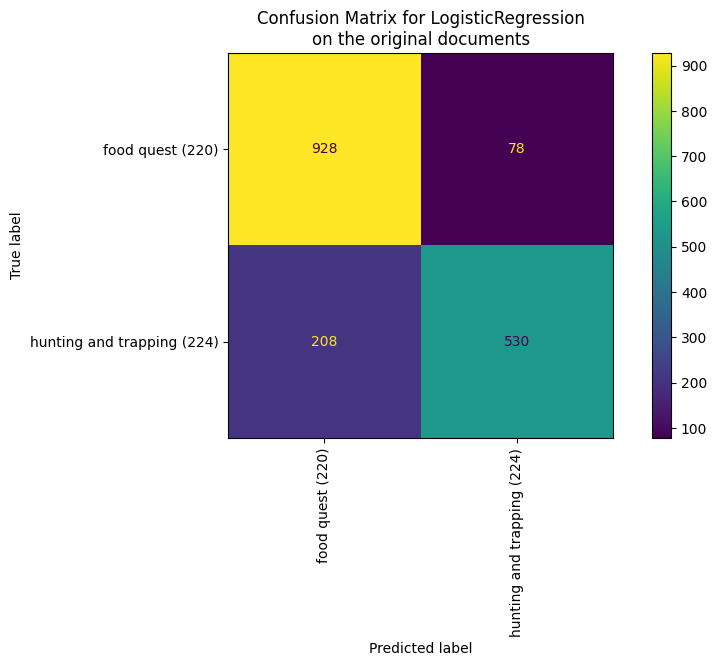

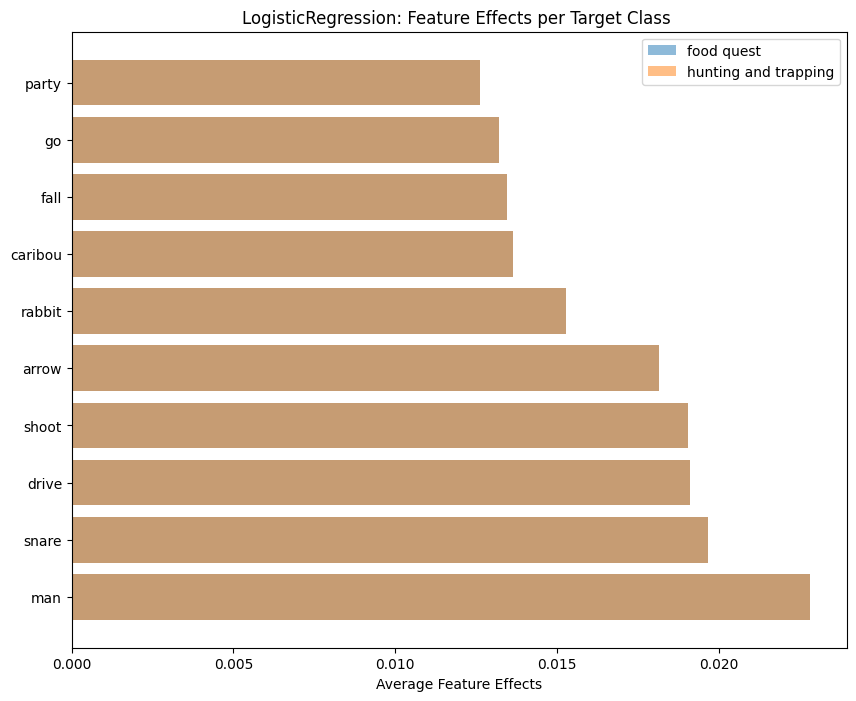

########## None SVM 

########## Training LinearSVC

########## 0.8360091743119266
              precision    recall  f1-score   support

         220      0.834     0.894     0.863      1006
         224      0.839     0.757     0.796       738

    accuracy                          0.836      1744
   macro avg      0.837     0.826     0.830      1744
weighted avg      0.836     0.836     0.835      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



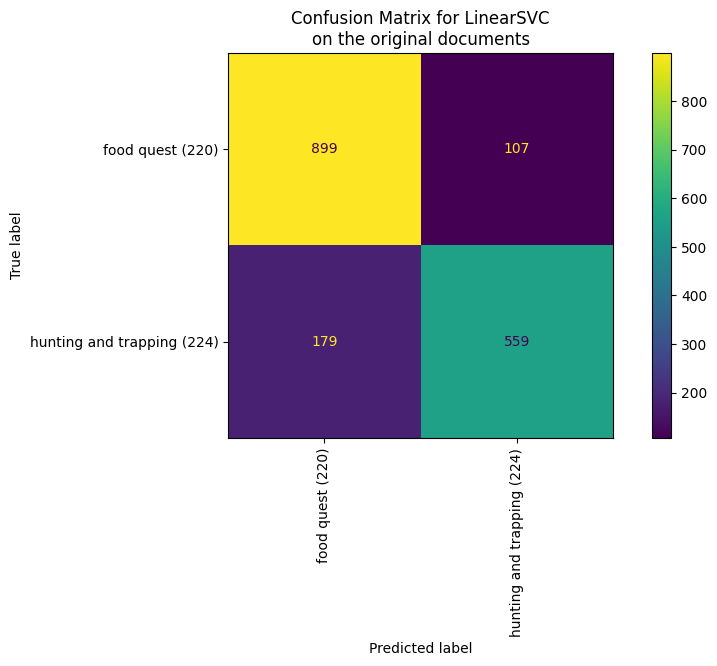

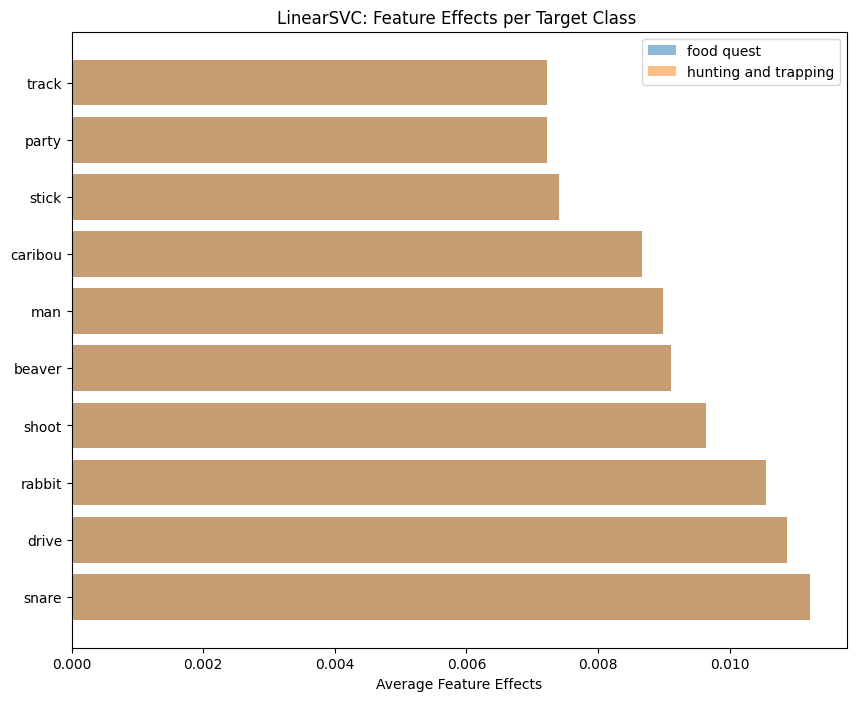

########## None RF 

########## Training RandomForestClassifier

########## 0.8153669724770642
              precision    recall  f1-score   support

         220      0.813     0.884     0.847      1006
         224      0.820     0.722     0.768       738

    accuracy                          0.815      1744
   macro avg      0.816     0.803     0.807      1744
weighted avg      0.816     0.815     0.813      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


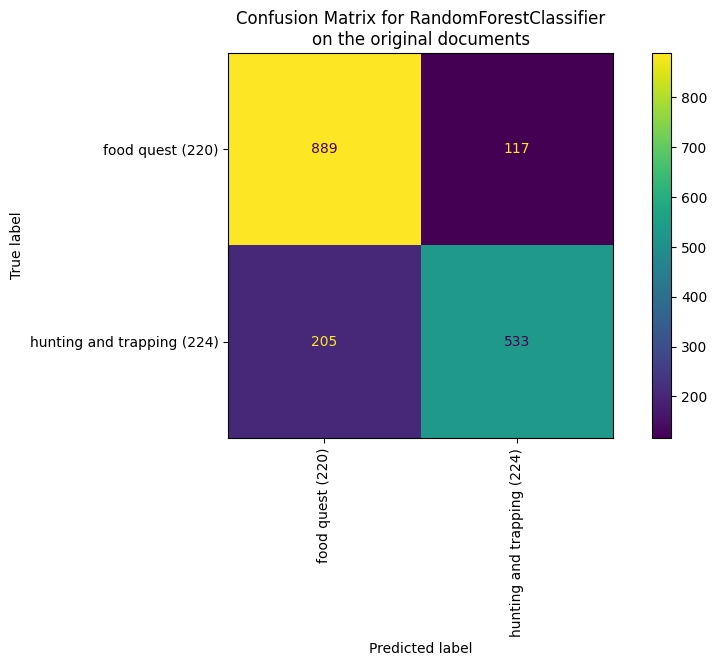

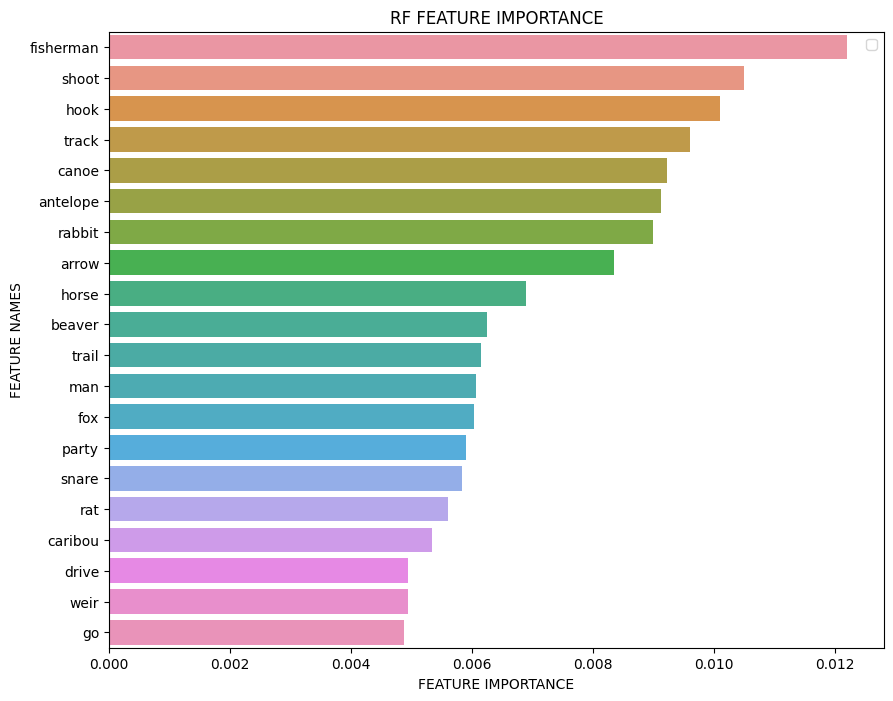

Iteration 3
Exclude: {'rat', 'his', 'caribou', 'rabbit', 'weir', 'fall', 'hook', 'fox', 'sea', 'trail', 'go', 'deer', 'arrow', 'bird', 'beaver', 'hunting', 'bear', 'canoe', 'dog', 'trap', 'animal', 'man', 'hunt', 'snare', 'fisherman', 'shoot', 'buffalo', 'antelope', 'meat', 'catch', 'hunter', 'fish', 'water', 'game', 'kill', 'drive', 'track', 'fishing', 'horse', 'net', 'herd', 'stick', 'party'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 62.892s at 0.061MB/s
n_samples: 6973, n_features: 4864
n_samples: 1744, n_features: 4864


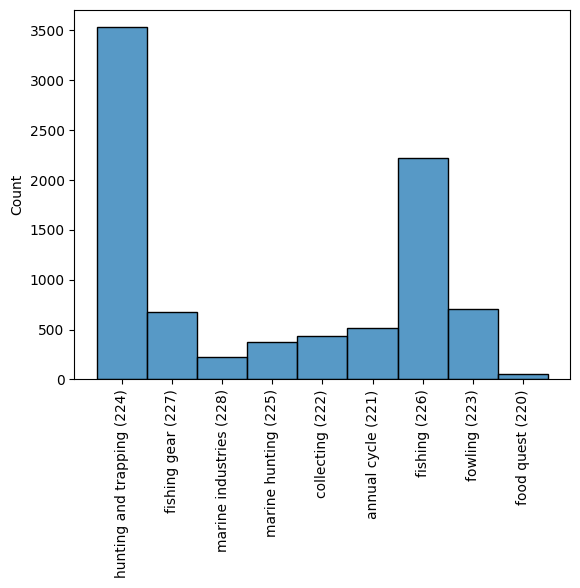

########## None LR 

########## Training LogisticRegression

########## 0.8285550458715596
              precision    recall  f1-score   support

         220      0.812     0.928     0.866      1043
         224      0.864     0.680     0.761       701

    accuracy                          0.829      1744
   macro avg      0.838     0.804     0.814      1744
weighted avg      0.833     0.829     0.824      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



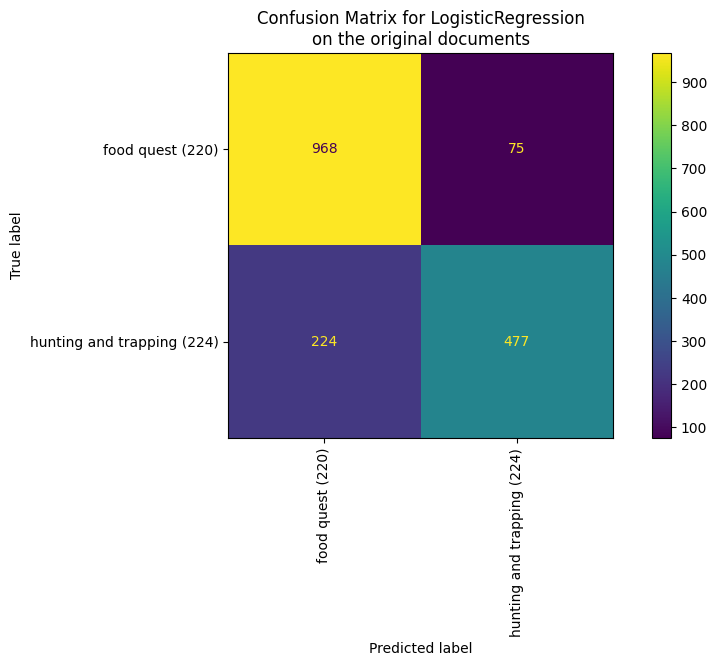

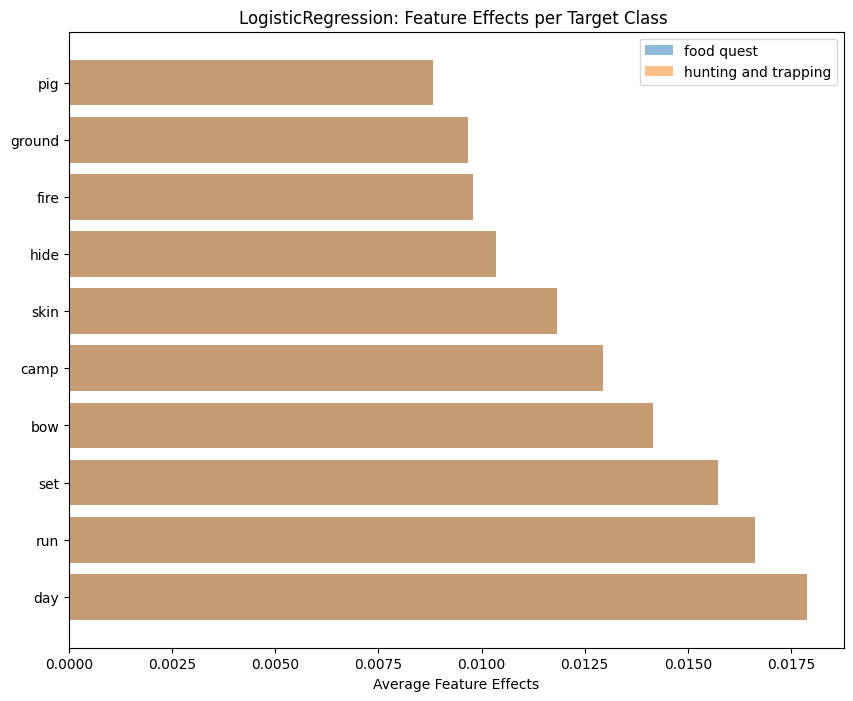

########## None SVM 

########## Training LinearSVC

########## 0.8331422018348624
              precision    recall  f1-score   support

         220      0.828     0.910     0.867      1043
         224      0.843     0.719     0.776       701

    accuracy                          0.833      1744
   macro avg      0.835     0.814     0.822      1744
weighted avg      0.834     0.833     0.830      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



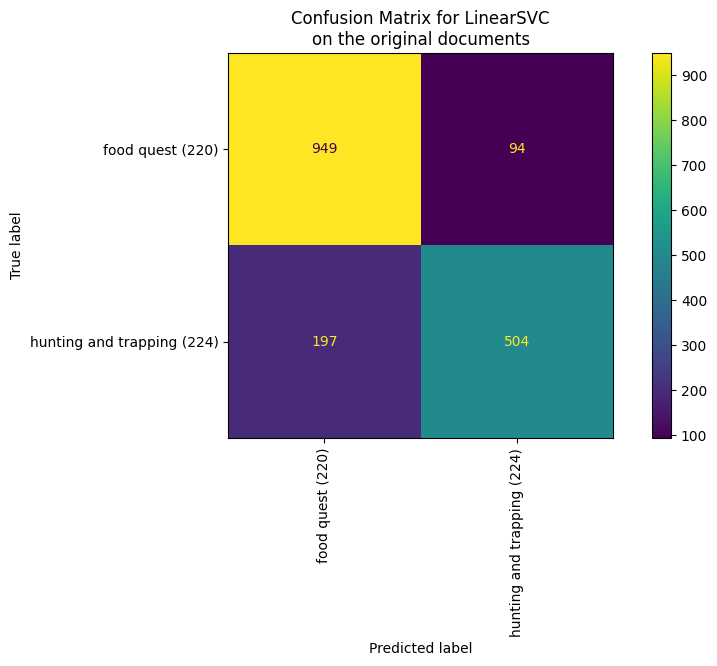

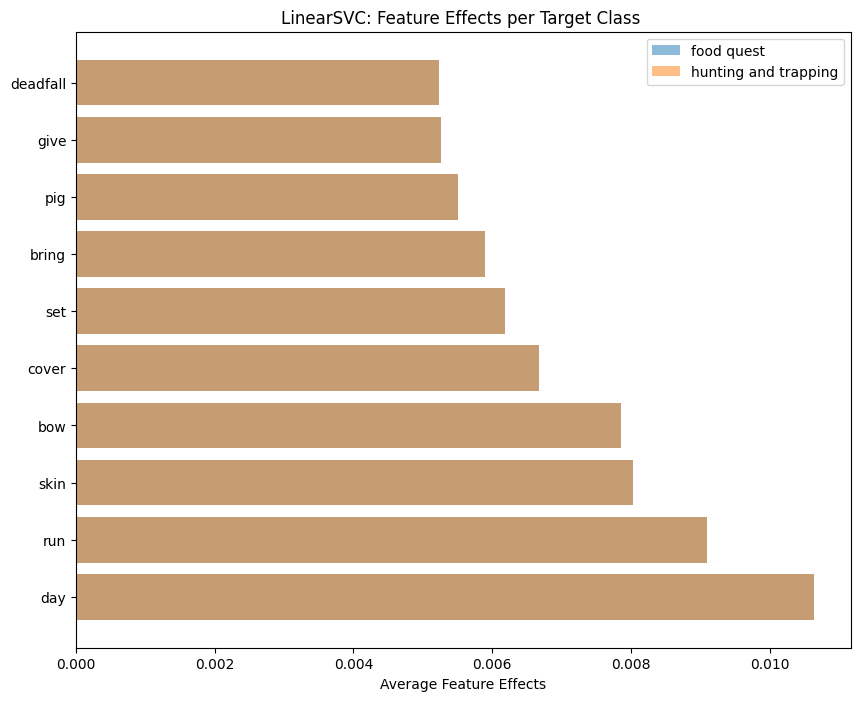

########## None RF 

########## Training RandomForestClassifier

########## 0.7998853211009175
              precision    recall  f1-score   support

         220      0.800     0.888     0.841      1043
         224      0.800     0.669     0.729       701

    accuracy                          0.800      1744
   macro avg      0.800     0.778     0.785      1744
weighted avg      0.800     0.800     0.796      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


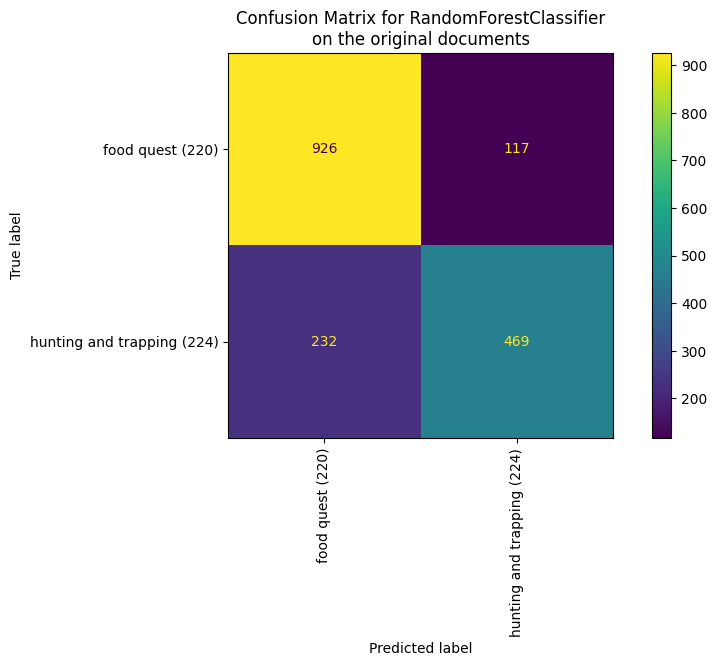

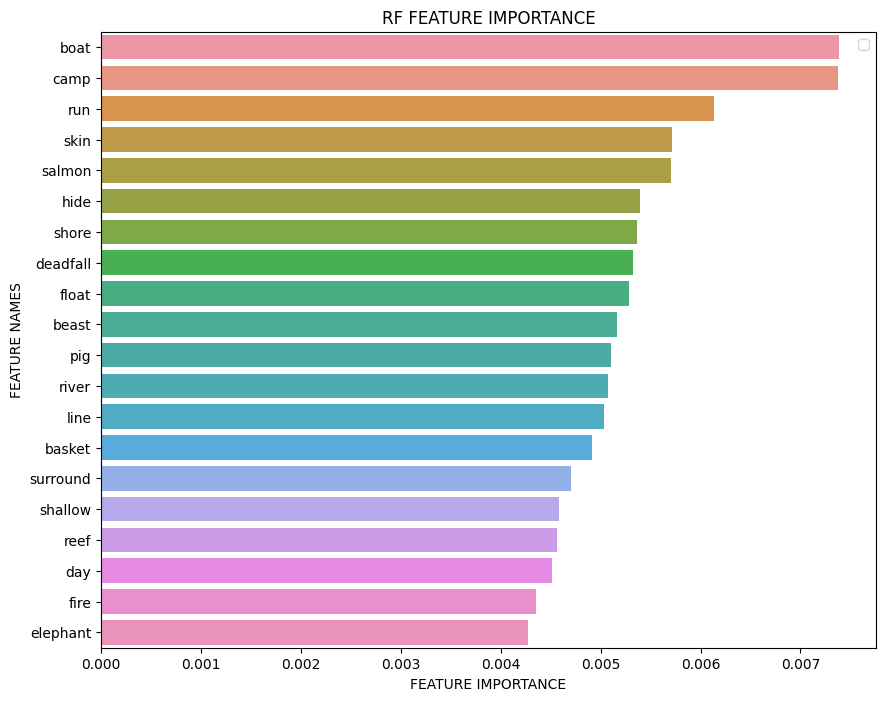

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 47.091s at 0.082MB/s
n_samples: 6973, n_features: 4938
n_samples: 1744, n_features: 4938


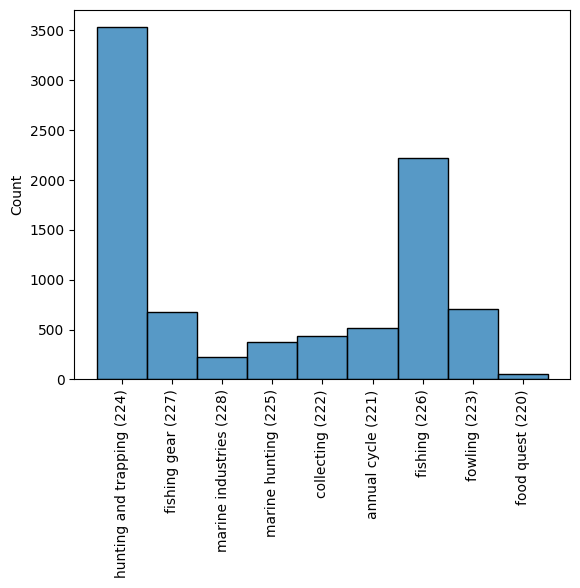

########## None LR 

########## Training LogisticRegression

########## 0.8790137614678899
              precision    recall  f1-score   support

         220      0.891     0.956     0.923      1314
         226      0.827     0.644     0.724       430

    accuracy                          0.879      1744
   macro avg      0.859     0.800     0.823      1744
weighted avg      0.875     0.879     0.874      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



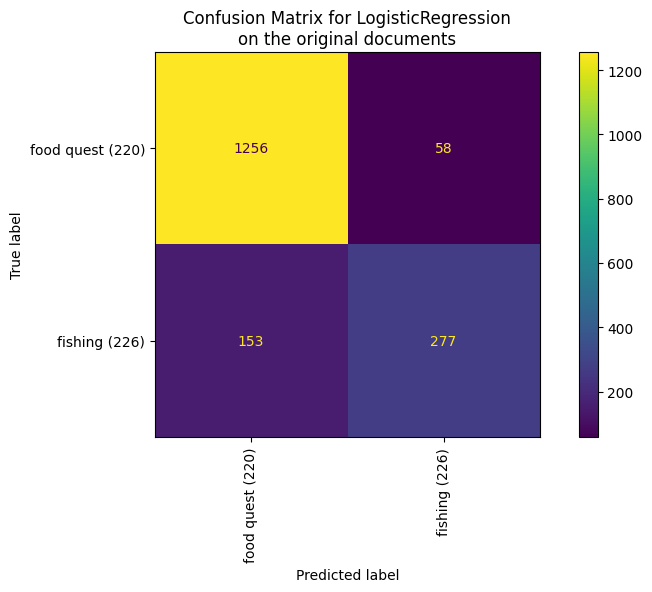

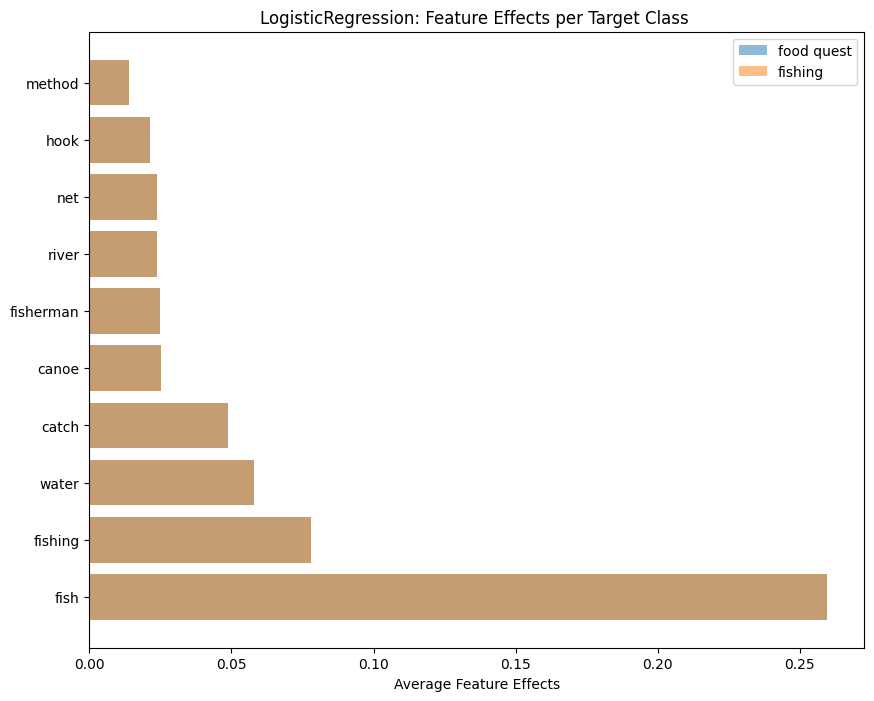

########## None SVM 

########## Training LinearSVC

########## 0.8899082568807339
              precision    recall  f1-score   support

         220      0.911     0.947     0.928      1314
         226      0.815     0.716     0.762       430

    accuracy                          0.890      1744
   macro avg      0.863     0.832     0.845      1744
weighted avg      0.887     0.890     0.887      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



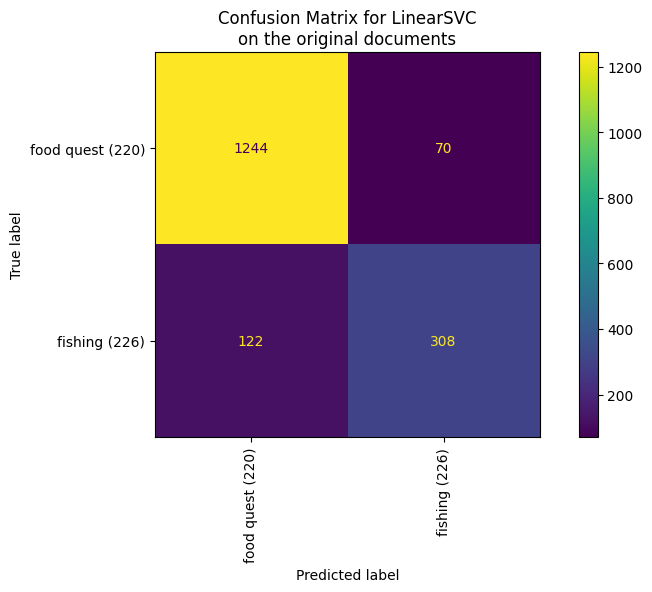

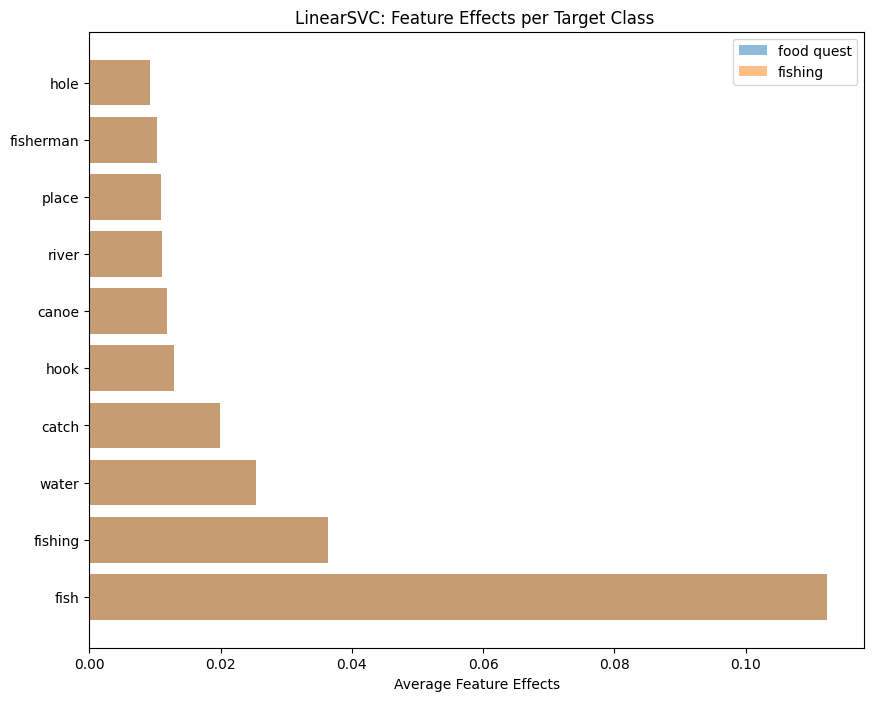

########## None RF 

########## Training RandomForestClassifier

########## 0.885894495412844
              precision    recall  f1-score   support

         220      0.912     0.939     0.925      1314
         226      0.795     0.723     0.758       430

    accuracy                          0.886      1744
   macro avg      0.854     0.831     0.841      1744
weighted avg      0.883     0.886     0.884      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


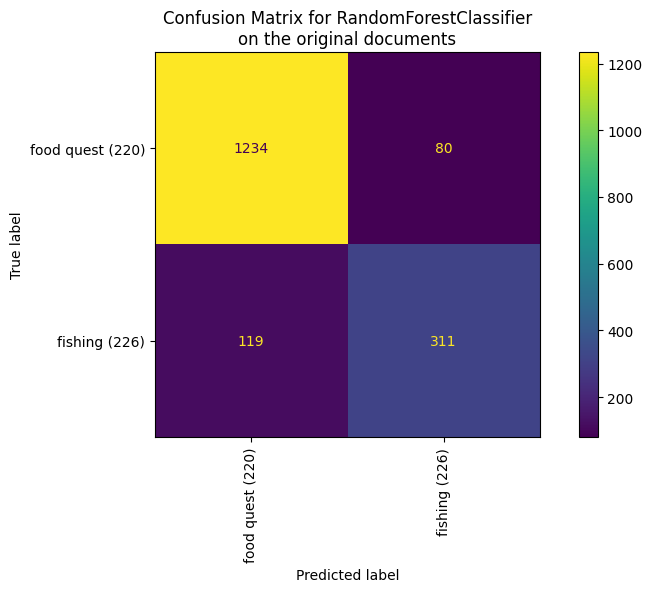

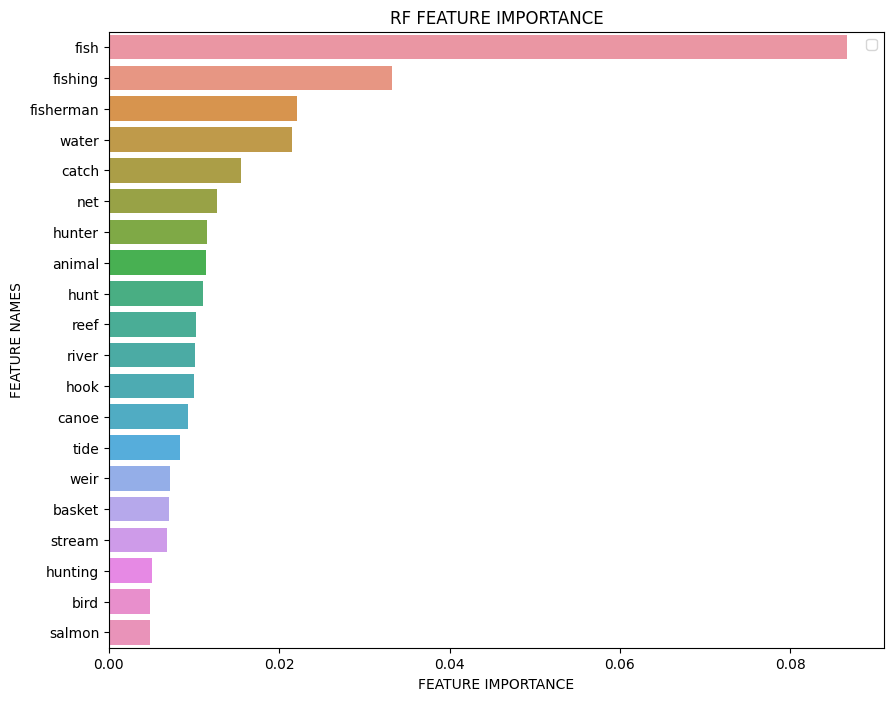

Iteration 2
Exclude: {'tide', 'basket', 'reef', 'catch', 'hunter', 'weir', 'hook', 'fish', 'water', 'hole', 'bird', 'hunting', 'stream', 'method', 'fishing', 'canoe', 'net', 'salmon', 'animal', 'hunt', 'place', 'river', 'fisherman'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 58.859s at 0.066MB/s
n_samples: 6973, n_features: 4894
n_samples: 1744, n_features: 4894


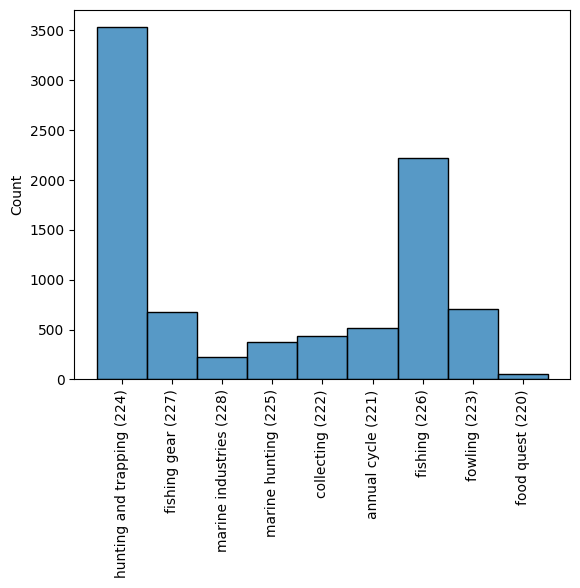

########## None LR 

########## Training LogisticRegression

########## 0.8256880733944955
              precision    recall  f1-score   support

         220      0.823     0.974     0.892      1293
         226      0.842     0.401     0.544       451

    accuracy                          0.826      1744
   macro avg      0.833     0.688     0.718      1744
weighted avg      0.828     0.826     0.802      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



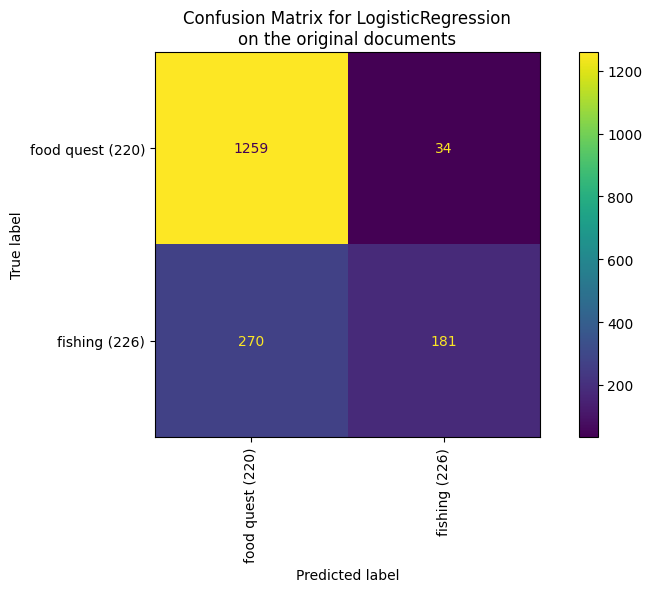

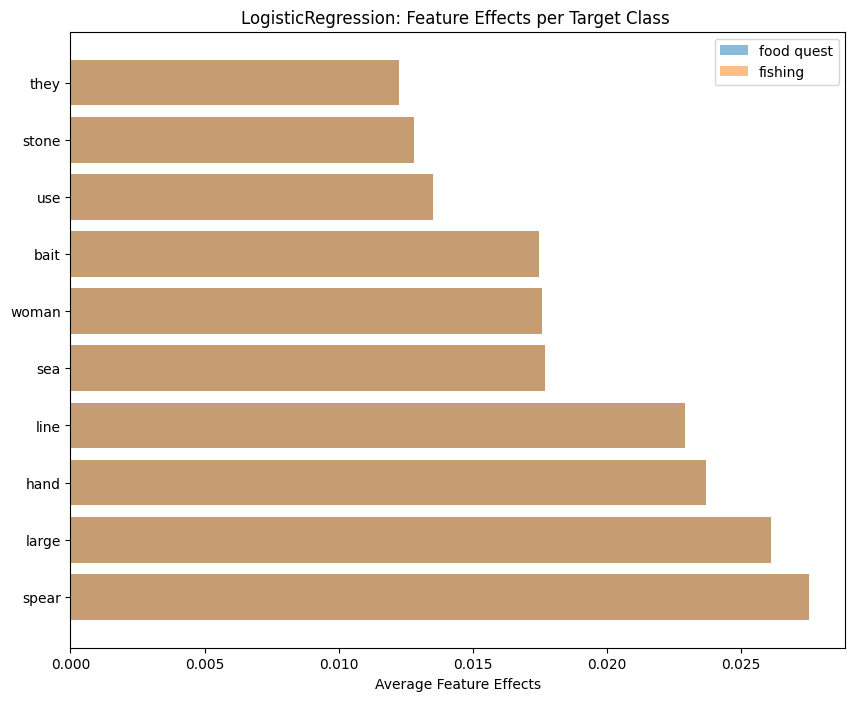

########## None SVM 

########## Training LinearSVC

########## 0.8360091743119266
              precision    recall  f1-score   support

         220      0.858     0.933     0.894      1293
         226      0.743     0.559     0.638       451

    accuracy                          0.836      1744
   macro avg      0.801     0.746     0.766      1744
weighted avg      0.829     0.836     0.828      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



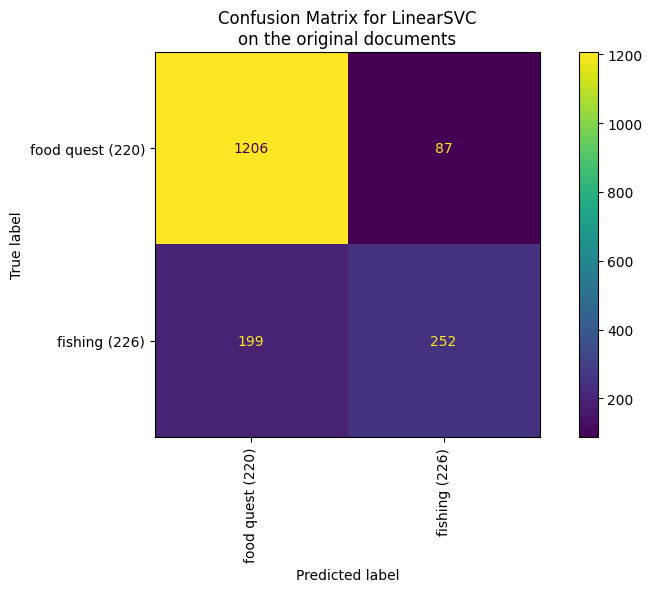

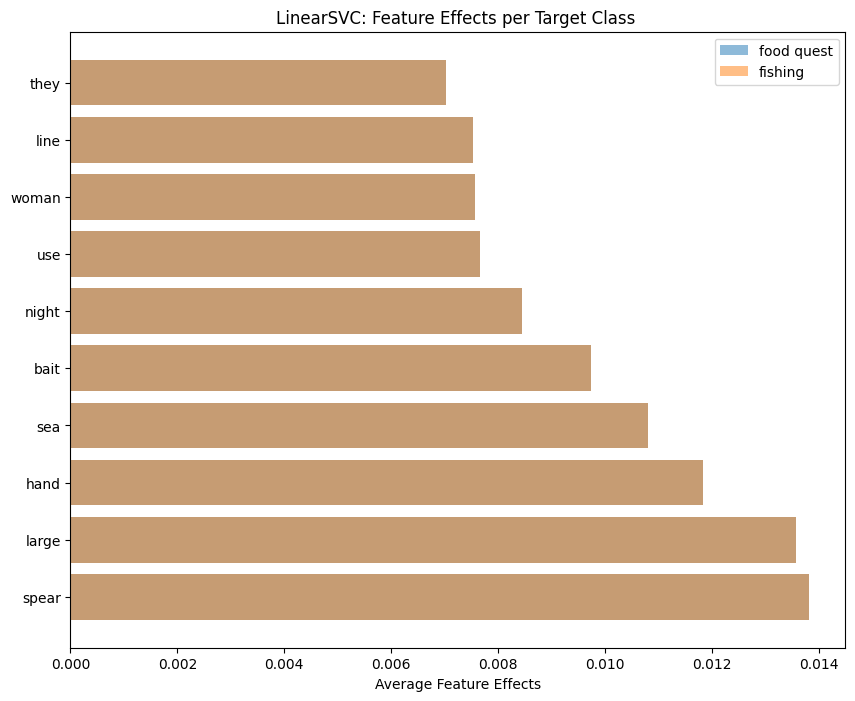

########## None RF 

########## Training RandomForestClassifier

########## 0.8107798165137615
              precision    recall  f1-score   support

         220      0.812     0.969     0.884      1293
         226      0.801     0.357     0.494       451

    accuracy                          0.811      1744
   macro avg      0.807     0.663     0.689      1744
weighted avg      0.809     0.811     0.783      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


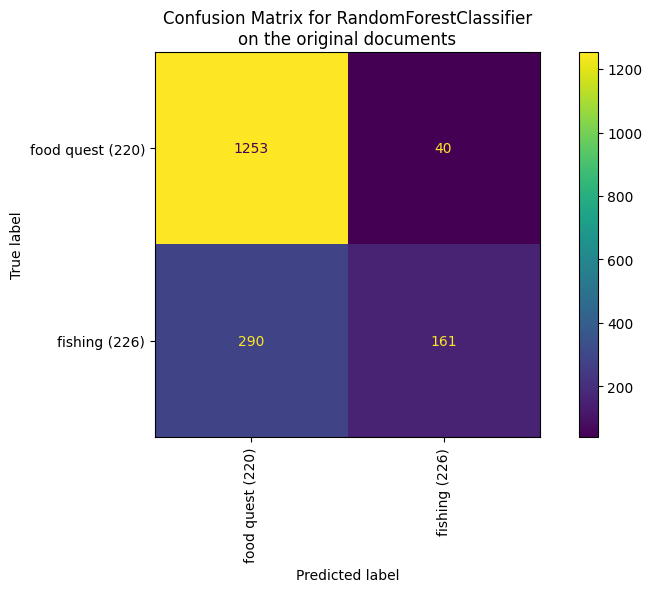

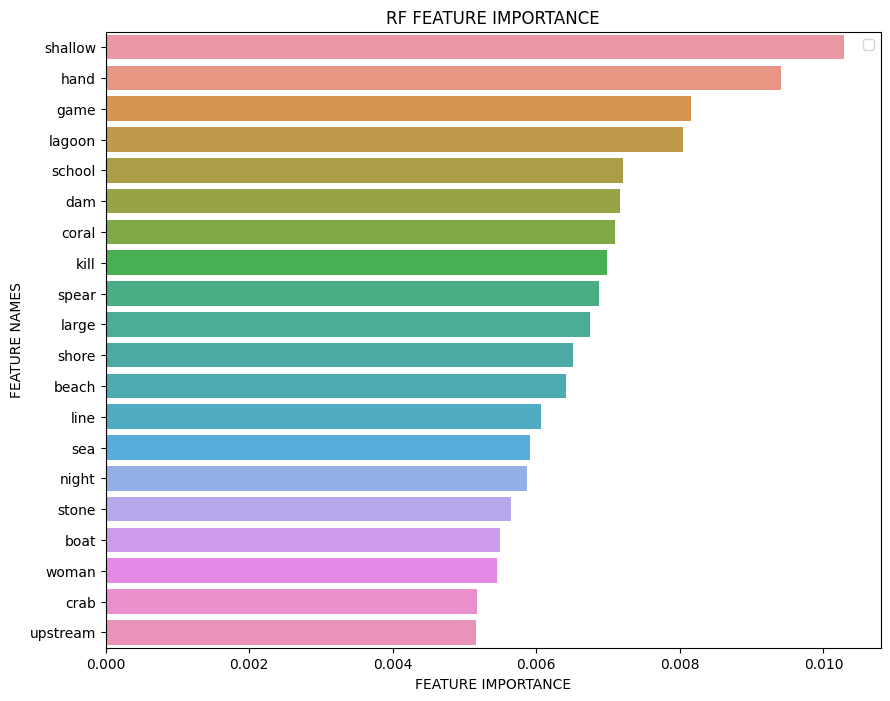

Iteration 3
Exclude: {'large', 'weir', 'hook', 'sea', 'shore', 'upstream', 'bird', 'hand', 'hunting', 'stream', 'school', 'beach', 'canoe', 'shallow', 'dam', 'salmon', 'night', 'animal', 'hunt', 'river', 'fisherman', 'tide', 'boat', 'woman', 'crab', 'basket', 'line', 'bait', 'spear', 'reef', 'stone', 'catch', 'hunter', 'fish', 'water', 'hole', 'coral', 'game', 'kill', 'method', 'they', 'fishing', 'use', 'lagoon', 'net', 'place'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 64.135s at 0.060MB/s
n_samples: 6973, n_features: 4858
n_samples: 1744, n_features: 4858


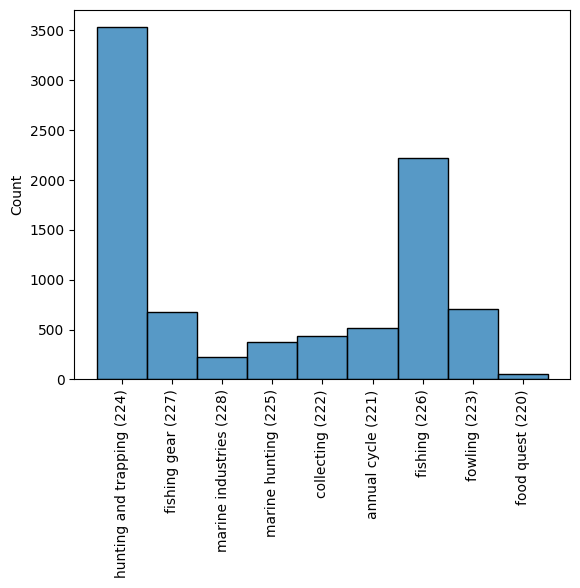

########## None LR 

########## Training LogisticRegression

########## 0.8165137614678899
              precision    recall  f1-score   support

         220      0.818     0.972     0.888      1309
         226      0.804     0.349     0.487       435

    accuracy                          0.817      1744
   macro avg      0.811     0.661     0.688      1744
weighted avg      0.815     0.817     0.788      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



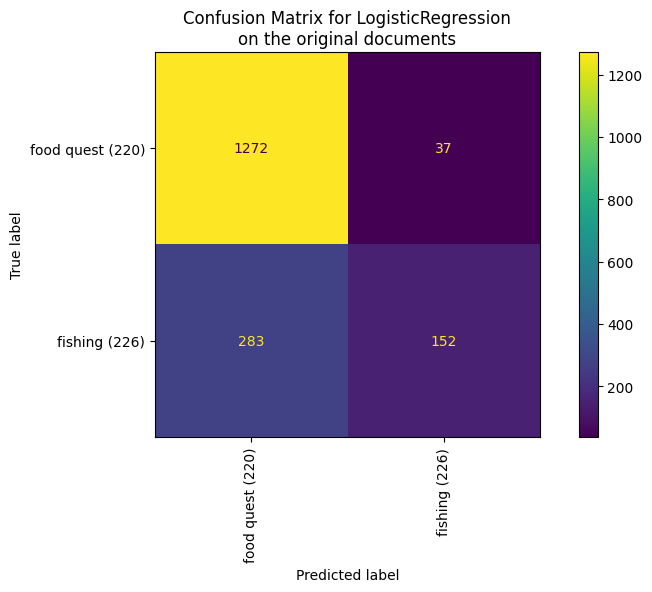

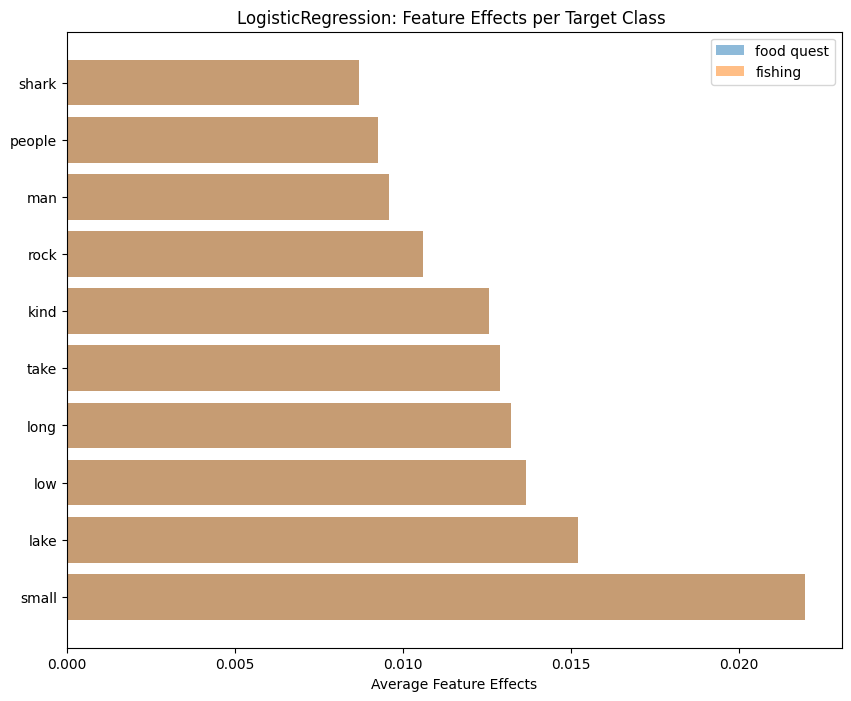

########## None SVM 

########## Training LinearSVC

########## 0.8434633027522935
              precision    recall  f1-score   support

         220      0.867     0.935     0.900      1309
         226      0.744     0.568     0.644       435

    accuracy                          0.843      1744
   macro avg      0.805     0.751     0.772      1744
weighted avg      0.836     0.843     0.836      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



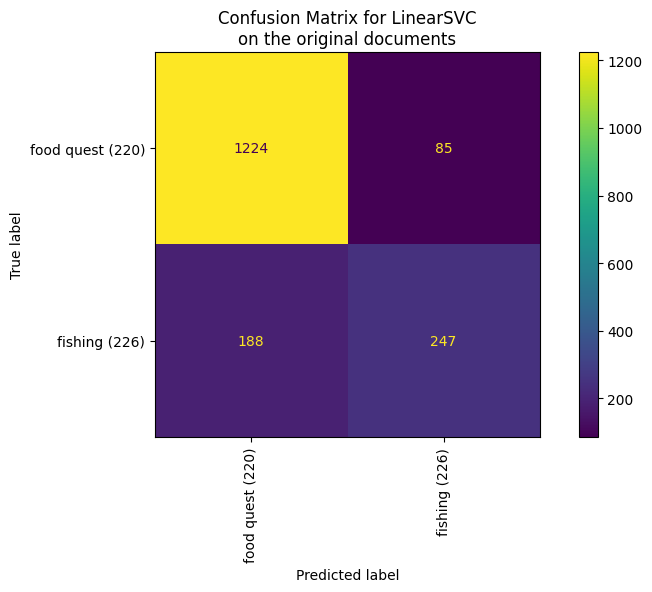

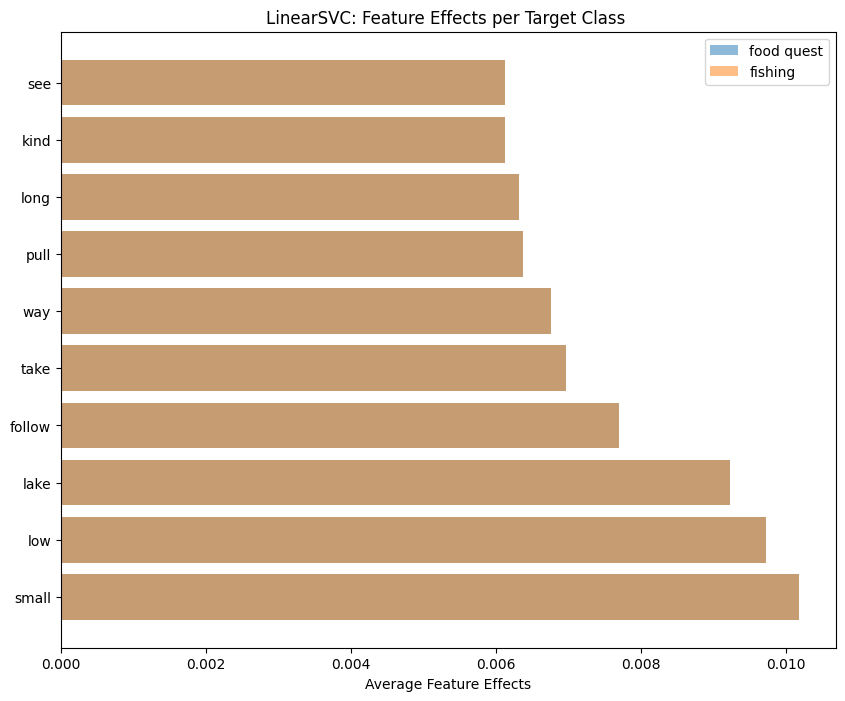

########## None RF 

########## Training RandomForestClassifier

########## 0.8119266055045872
              precision    recall  f1-score   support

         220      0.820     0.960     0.885      1309
         226      0.751     0.368     0.494       435

    accuracy                          0.812      1744
   macro avg      0.786     0.664     0.689      1744
weighted avg      0.803     0.812     0.787      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


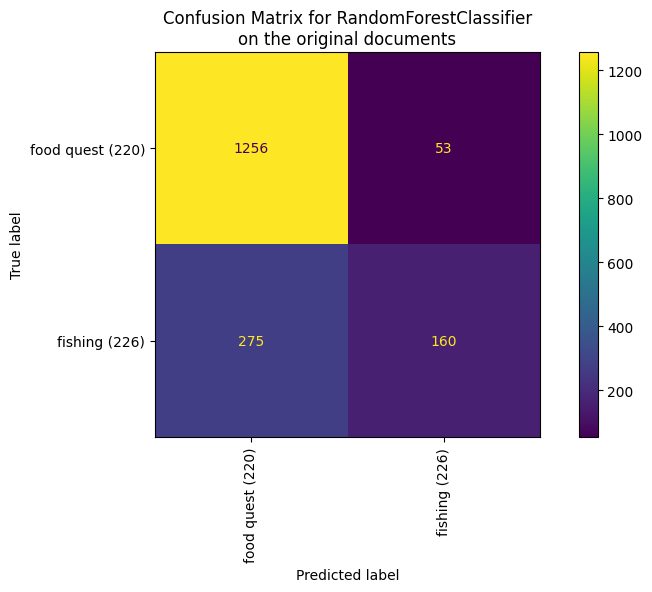

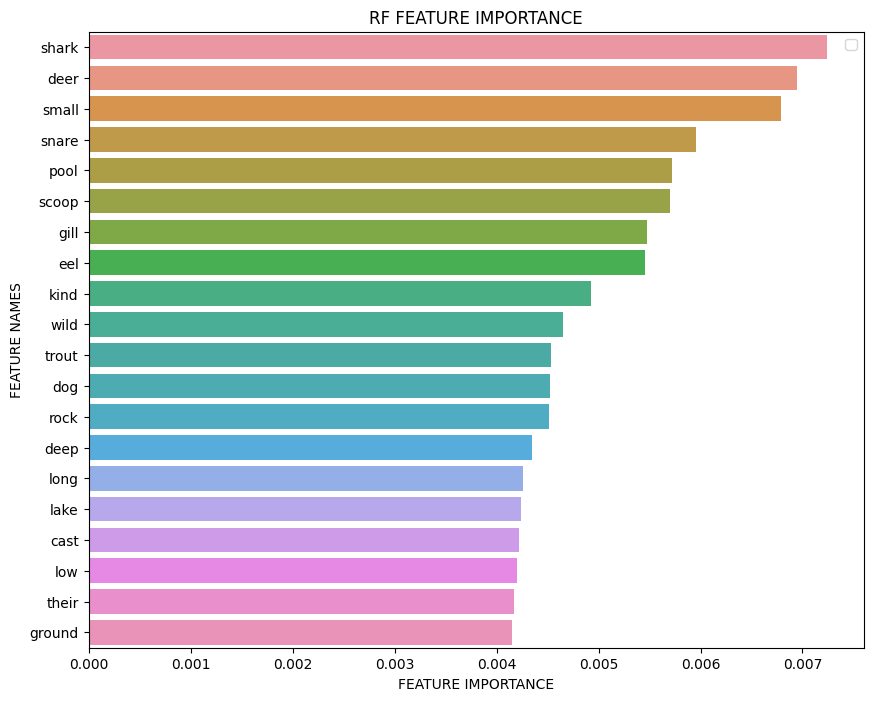

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 43.727s at 0.082MB/s
n_samples: 6546, n_features: 4658
n_samples: 1637, n_features: 4658


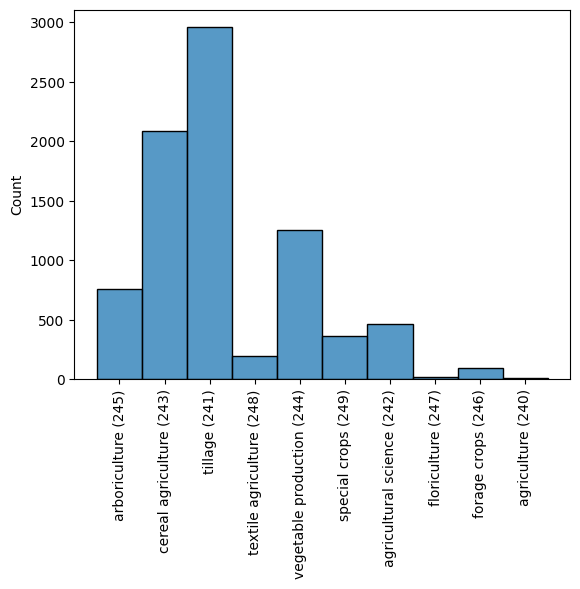

########## None LR 

########## Training LogisticRegression

########## 0.7544288332315211
              precision    recall  f1-score   support

         240      0.752     0.917     0.826      1044
         241      0.762     0.469     0.580       593

    accuracy                          0.754      1637
   macro avg      0.757     0.693     0.703      1637
weighted avg      0.756     0.754     0.737      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



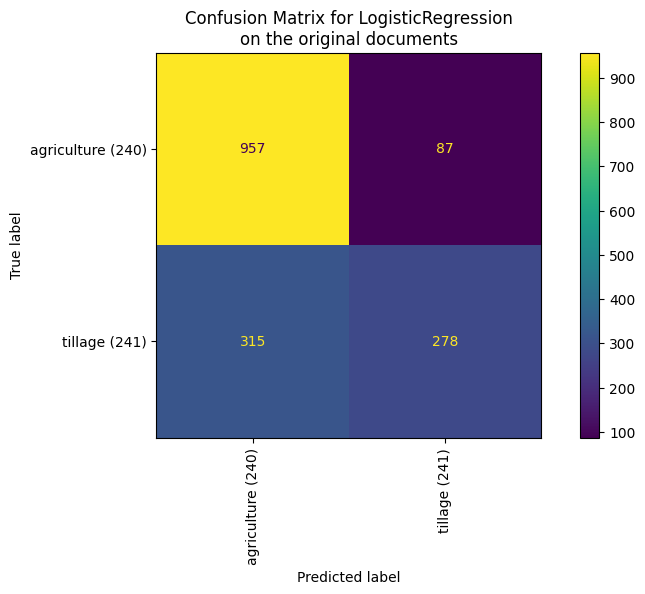

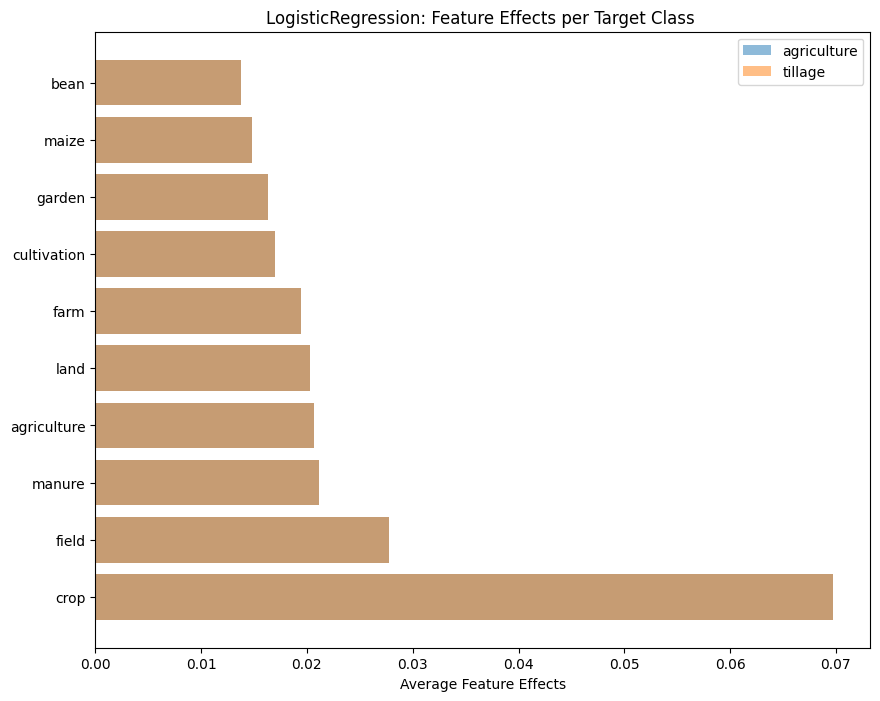

########## None SVM 

########## Training LinearSVC

########## 0.7470983506414173
              precision    recall  f1-score   support

         240      0.772     0.857     0.812      1044
         241      0.688     0.553     0.613       593

    accuracy                          0.747      1637
   macro avg      0.730     0.705     0.713      1637
weighted avg      0.741     0.747     0.740      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



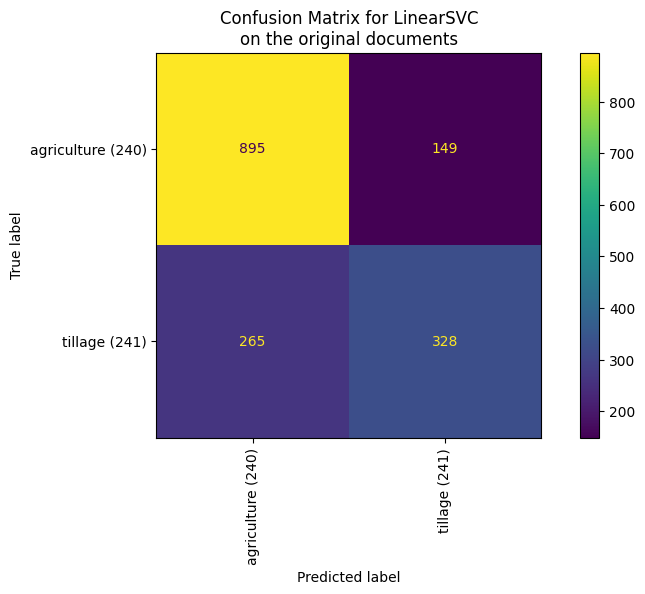

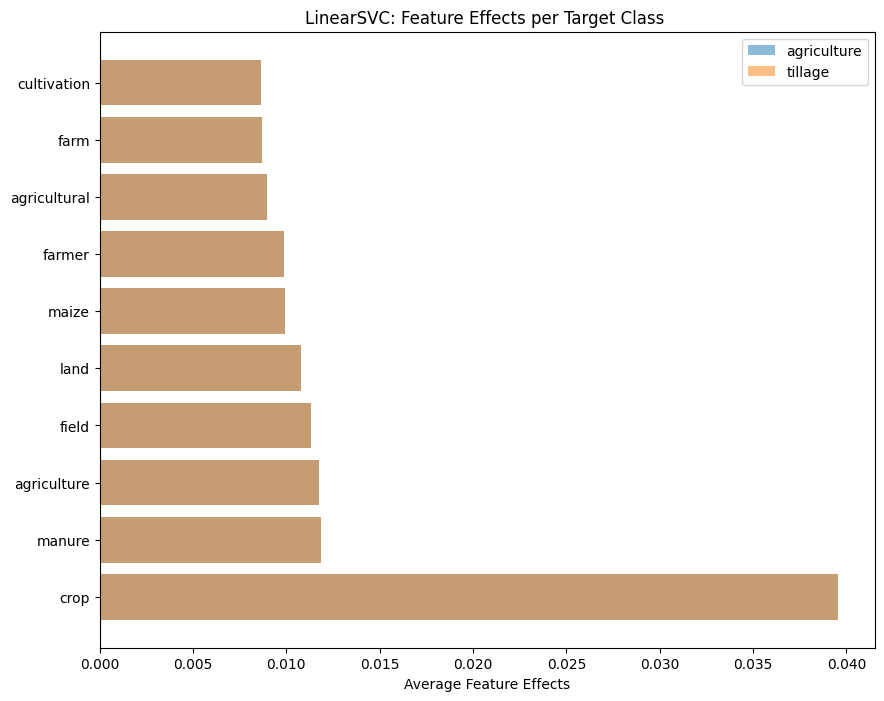

########## None RF 

########## Training RandomForestClassifier

########## 0.7361026267562615
              precision    recall  f1-score   support

         240      0.738     0.909     0.815      1044
         241      0.729     0.432     0.542       593

    accuracy                          0.736      1637
   macro avg      0.734     0.670     0.678      1637
weighted avg      0.735     0.736     0.716      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


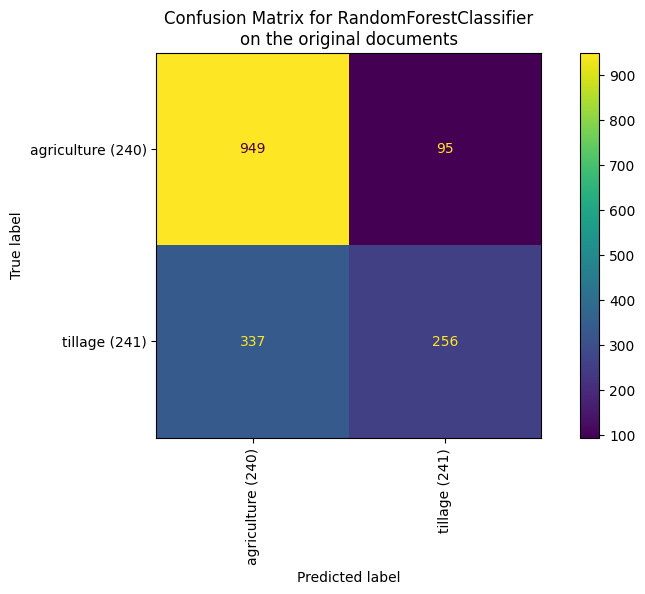

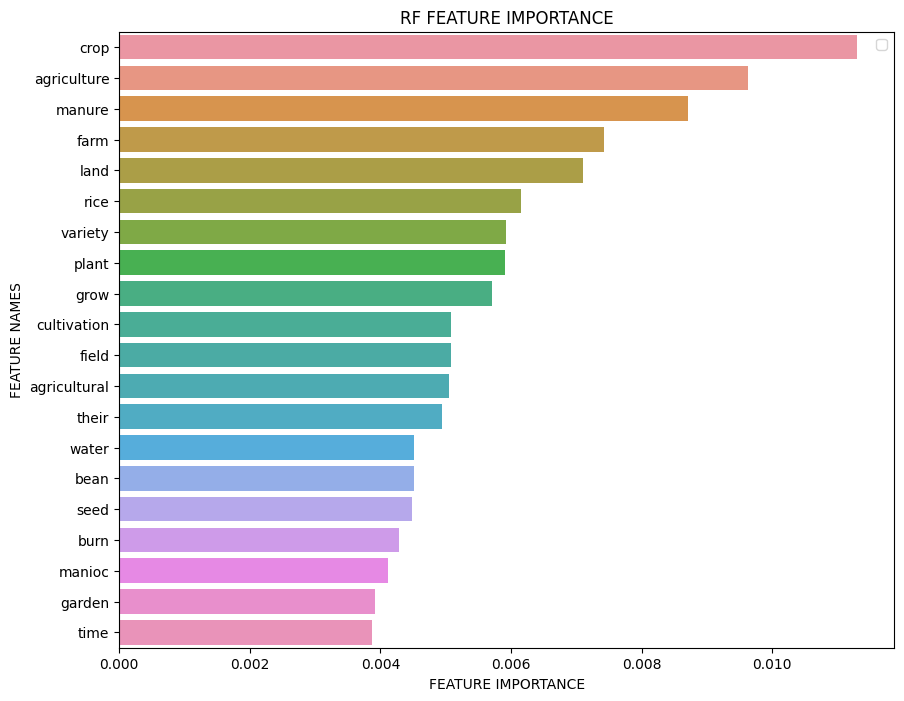

Iteration 2
Exclude: {'maize', 'agriculture', 'burn', 'garden', 'crop', 'rice', 'time', 'manure', 'farm', 'water', 'cultivation', 'farmer', 'agricultural', 'grow', 'field', 'land', 'bean', 'manioc', 'seed', 'plant', 'variety', 'their'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 52.594s at 0.068MB/s
n_samples: 6546, n_features: 4615
n_samples: 1637, n_features: 4615


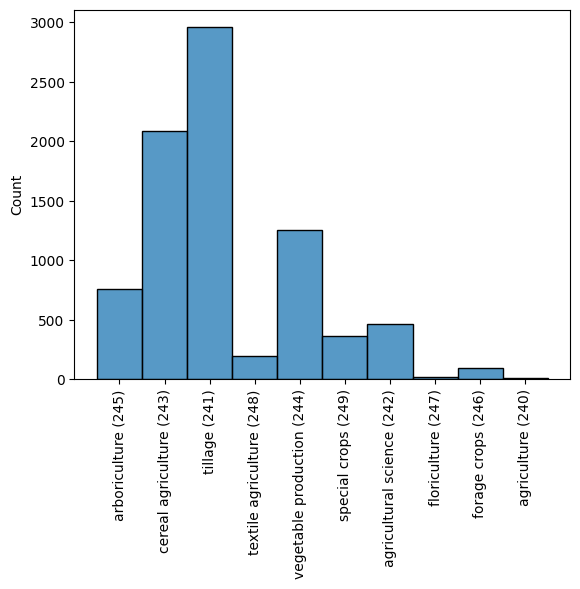

########## None LR 

########## Training LogisticRegression

########## 0.7116676847892486
              precision    recall  f1-score   support

         240      0.712     0.916     0.802      1040
         241      0.709     0.355     0.473       597

    accuracy                          0.712      1637
   macro avg      0.711     0.636     0.637      1637
weighted avg      0.711     0.712     0.682      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



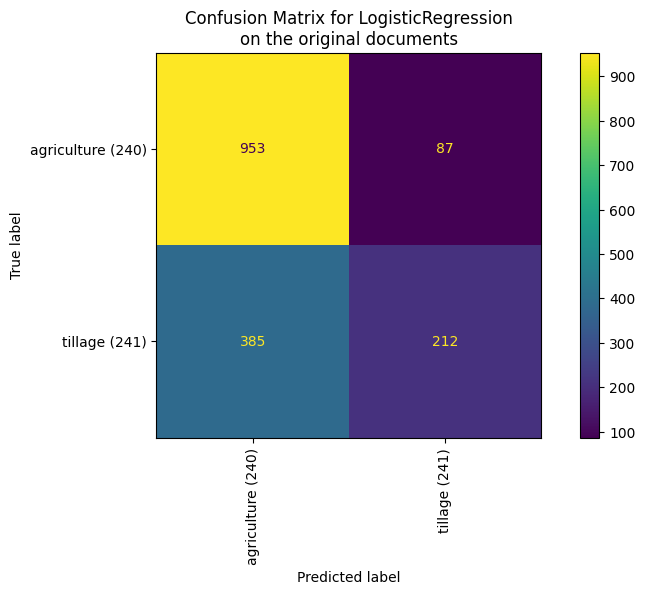

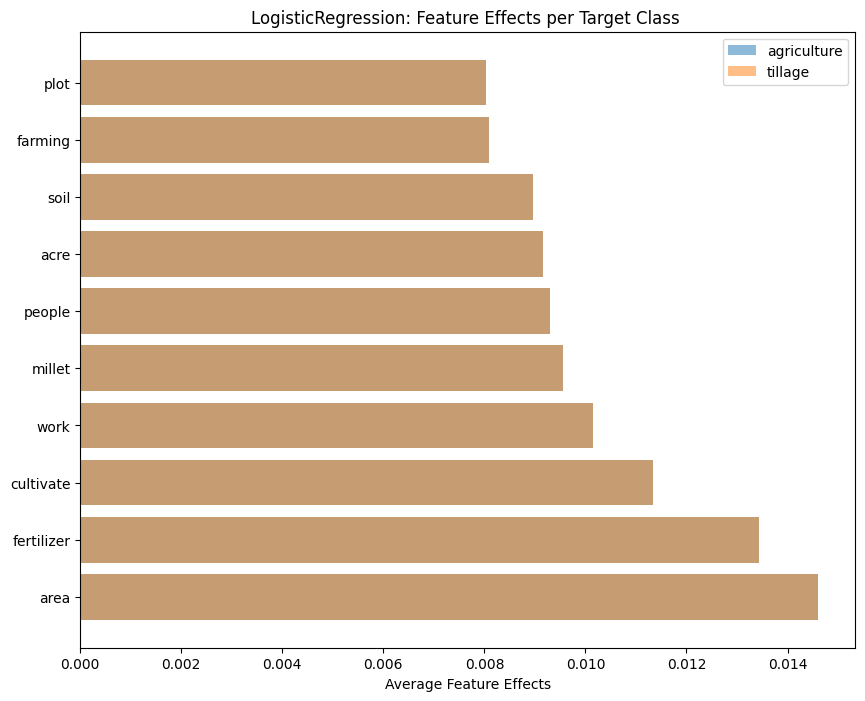

########## None SVM 

########## Training LinearSVC

########## 0.7018937080024434
              precision    recall  f1-score   support

         240      0.733     0.836     0.781      1040
         241      0.621     0.469     0.534       597

    accuracy                          0.702      1637
   macro avg      0.677     0.652     0.658      1637
weighted avg      0.692     0.702     0.691      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



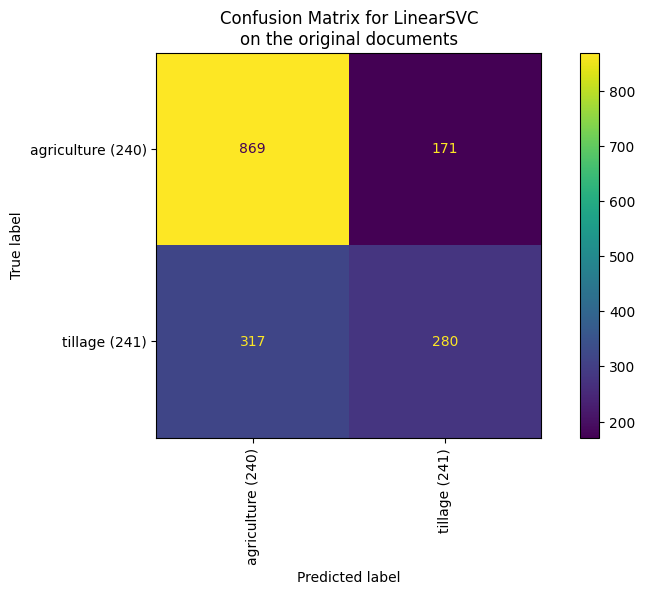

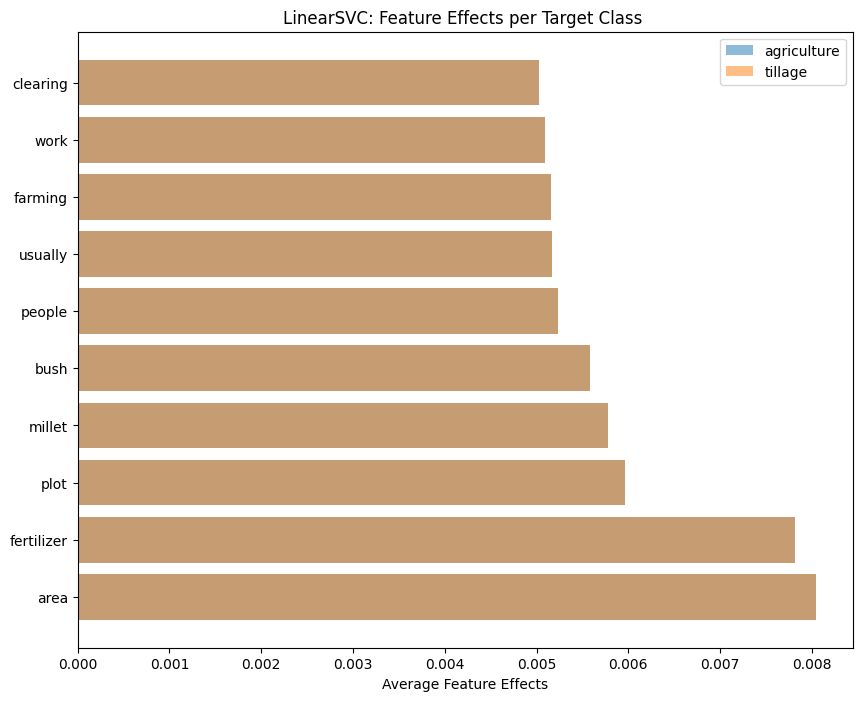

########## None RF 

########## Training RandomForestClassifier

########## 0.7098350641417227
              precision    recall  f1-score   support

         240      0.712     0.912     0.800      1040
         241      0.699     0.358     0.474       597

    accuracy                          0.710      1637
   macro avg      0.706     0.635     0.637      1637
weighted avg      0.708     0.710     0.681      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


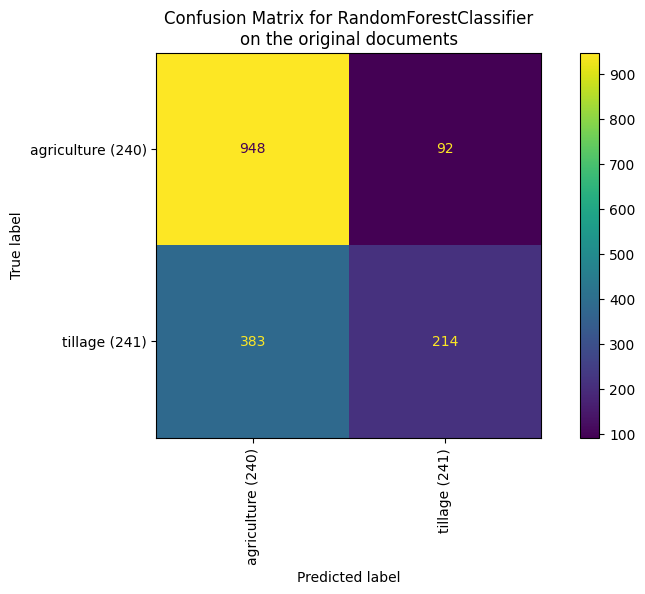

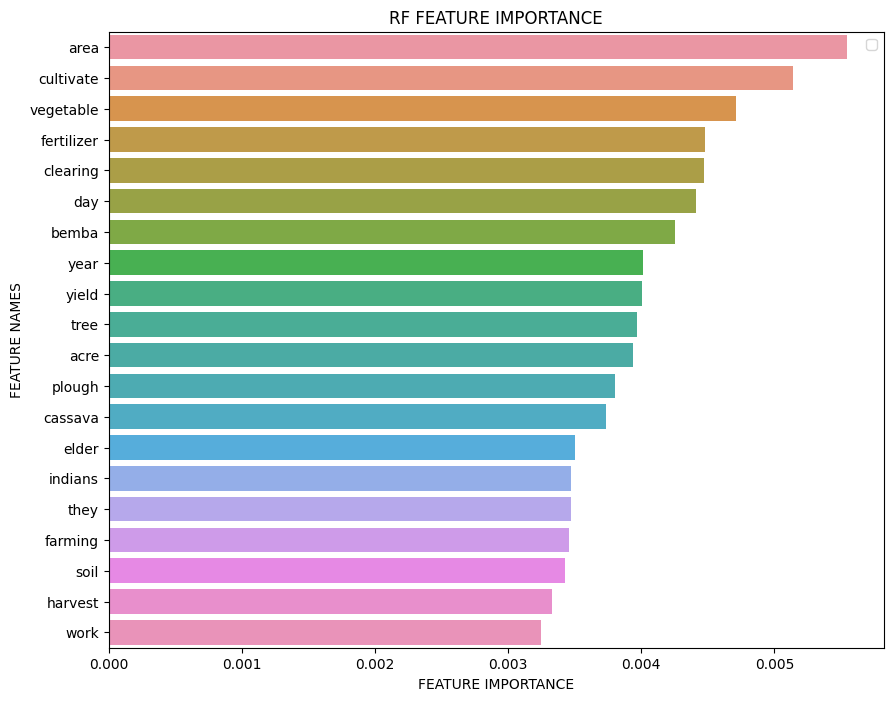

Iteration 3
Exclude: {'agriculture', 'cultivate', 'burn', 'garden', 'crop', 'time', 'people', 'cultivation', 'indians', 'grow', 'field', 'plot', 'bemba', 'land', 'bean', 'manioc', 'clearing', 'variety', 'acre', 'their', 'bush', 'tree', 'maize', 'usually', 'yield', 'plough', 'rice', 'manure', 'harvest', 'farm', 'water', 'vegetable', 'elder', 'farmer', 'agricultural', 'year', 'area', 'soil', 'fertilizer', 'work', 'they', 'day', 'seed', 'millet', 'plant', 'farming', 'cassava'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 57.176s at 0.063MB/s
n_samples: 6546, n_features: 4574
n_samples: 1637, n_features: 4574


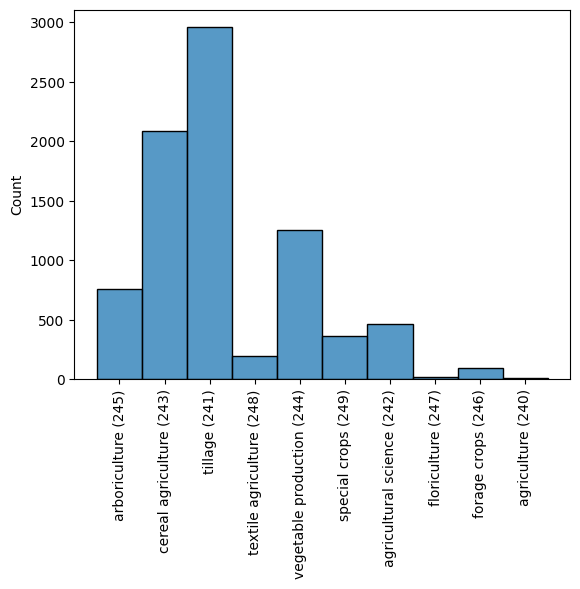

########## None LR 

########## Training LogisticRegression

########## 0.7073915699450214
              precision    recall  f1-score   support

         240      0.710     0.910     0.798      1039
         241      0.695     0.355     0.470       598

    accuracy                          0.707      1637
   macro avg      0.703     0.633     0.634      1637
weighted avg      0.705     0.707     0.678      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



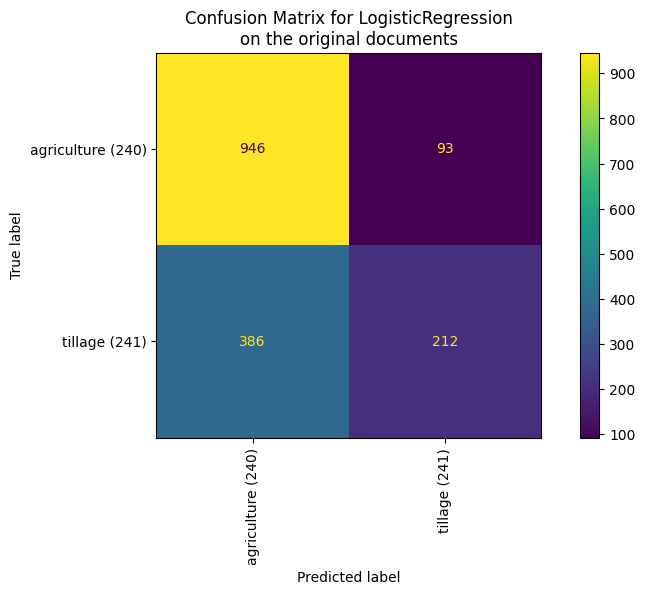

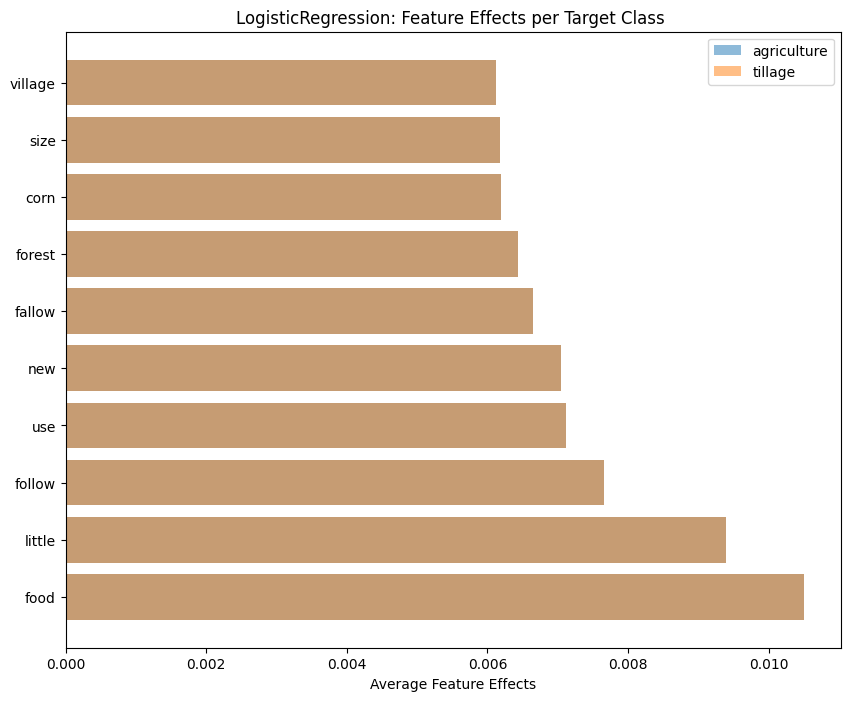

########## None SVM 

########## Training LinearSVC

########## 0.6902871105681124
              precision    recall  f1-score   support

         240      0.731     0.810     0.769      1039
         241      0.594     0.482     0.532       598

    accuracy                          0.690      1637
   macro avg      0.662     0.646     0.650      1637
weighted avg      0.681     0.690     0.682      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



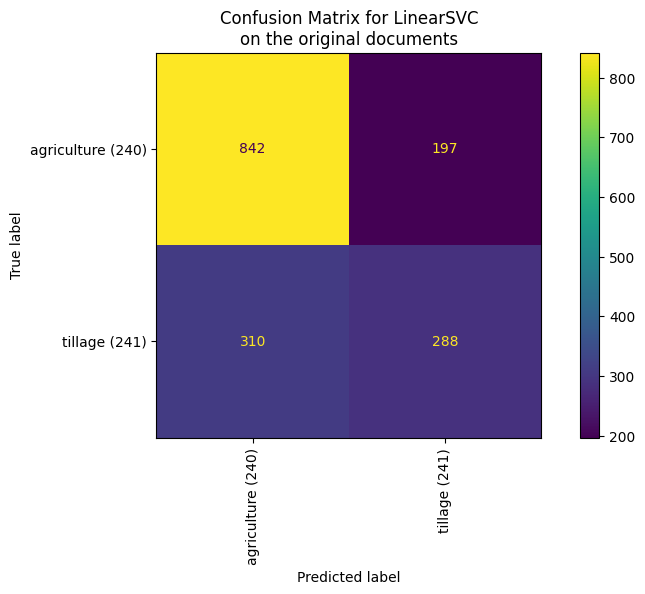

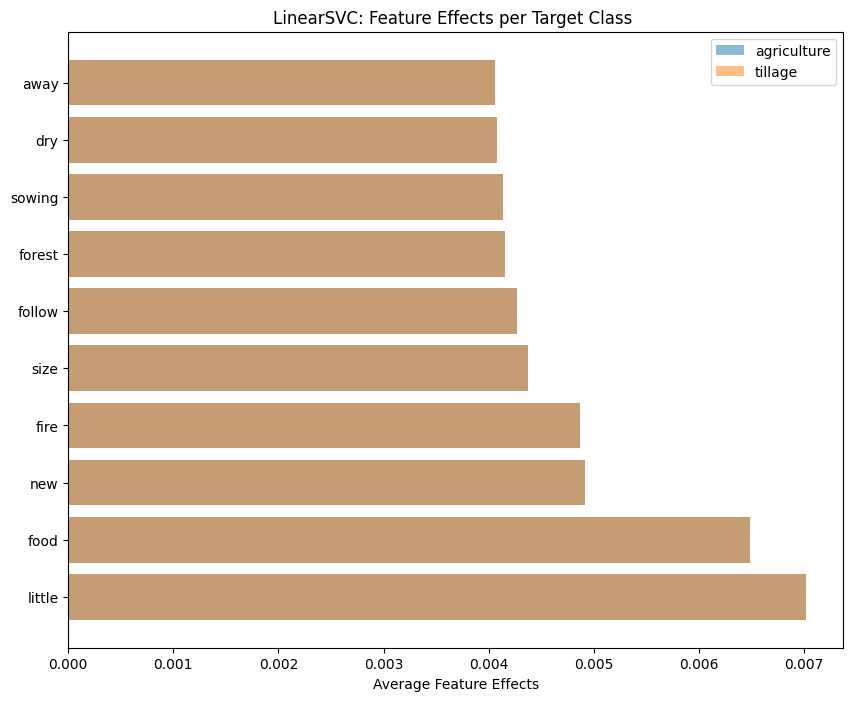

########## None RF 

########## Training RandomForestClassifier

########## 0.7098350641417227
              precision    recall  f1-score   support

         240      0.710     0.916     0.800      1039
         241      0.707     0.351     0.469       598

    accuracy                          0.710      1637
   macro avg      0.709     0.634     0.635      1637
weighted avg      0.709     0.710     0.679      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


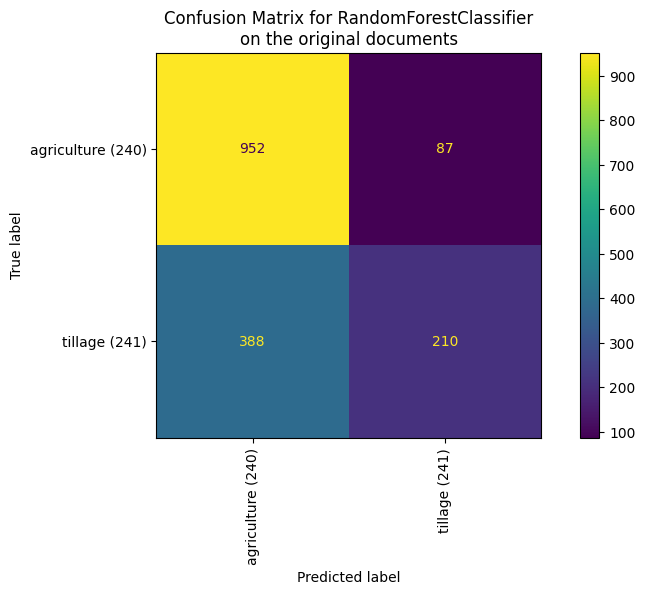

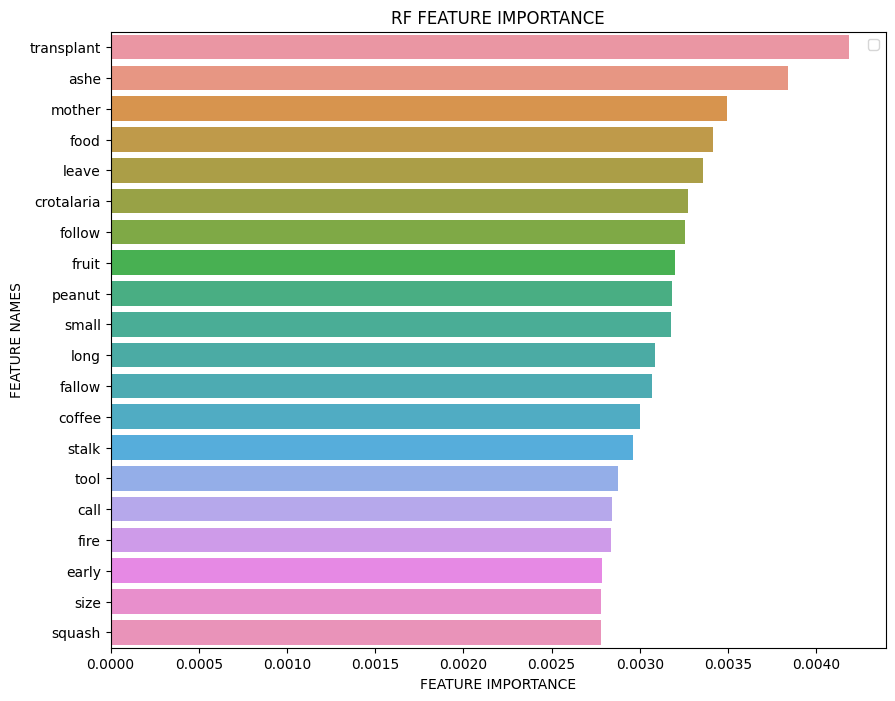

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 42.439s at 0.084MB/s
n_samples: 6546, n_features: 4658
n_samples: 1637, n_features: 4658


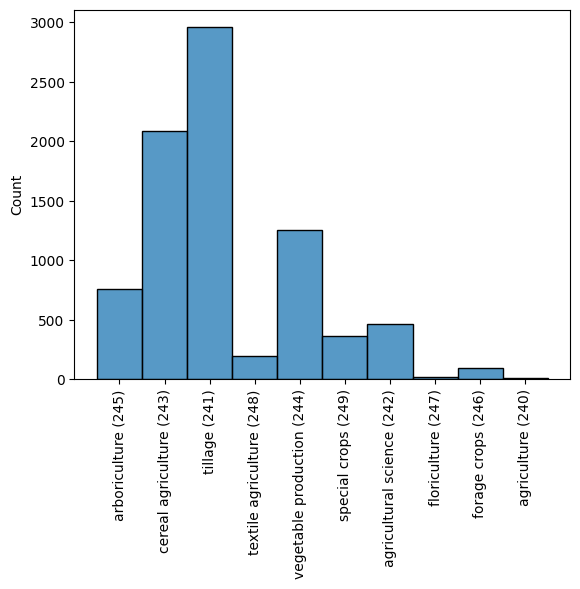

########## None LR 

########## Training LogisticRegression

########## 0.8338423946243128
              precision    recall  f1-score   support

         240      0.834     0.971     0.897      1222
         243      0.833     0.431     0.568       415

    accuracy                          0.834      1637
   macro avg      0.833     0.701     0.733      1637
weighted avg      0.834     0.834     0.814      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



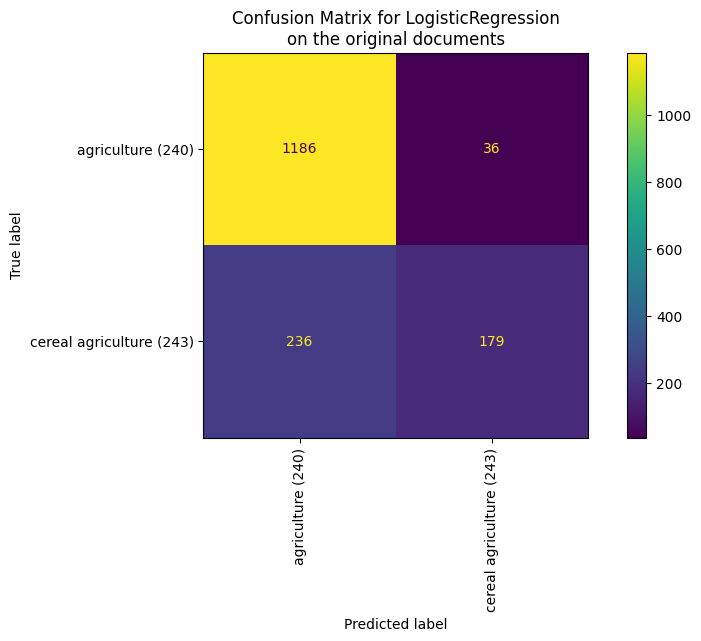

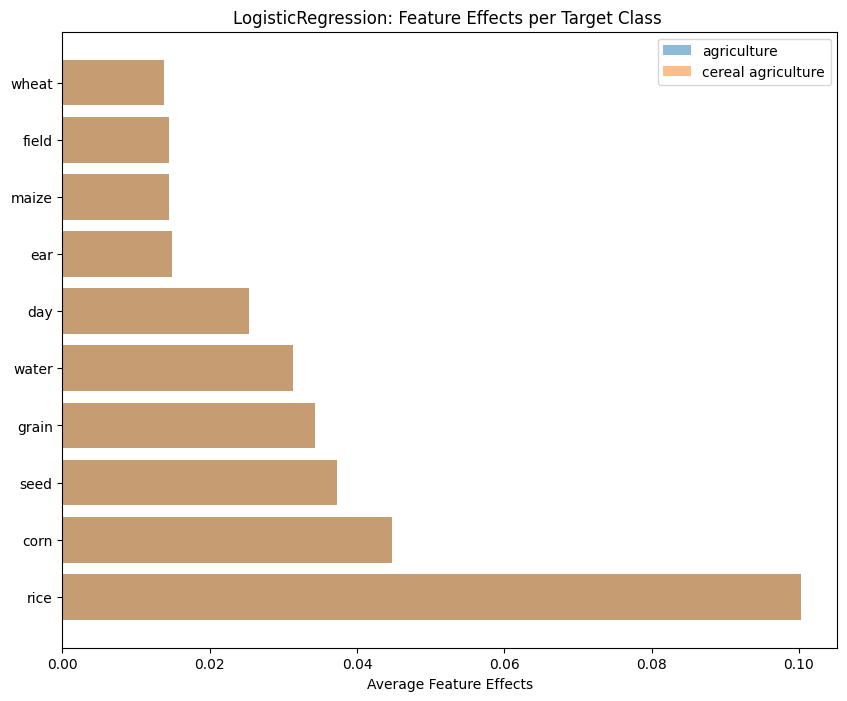

########## None SVM 

########## Training LinearSVC

########## 0.8442272449602932
              precision    recall  f1-score   support

         240      0.861     0.944     0.901      1222
         243      0.770     0.549     0.641       415

    accuracy                          0.844      1637
   macro avg      0.815     0.747     0.771      1637
weighted avg      0.838     0.844     0.835      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



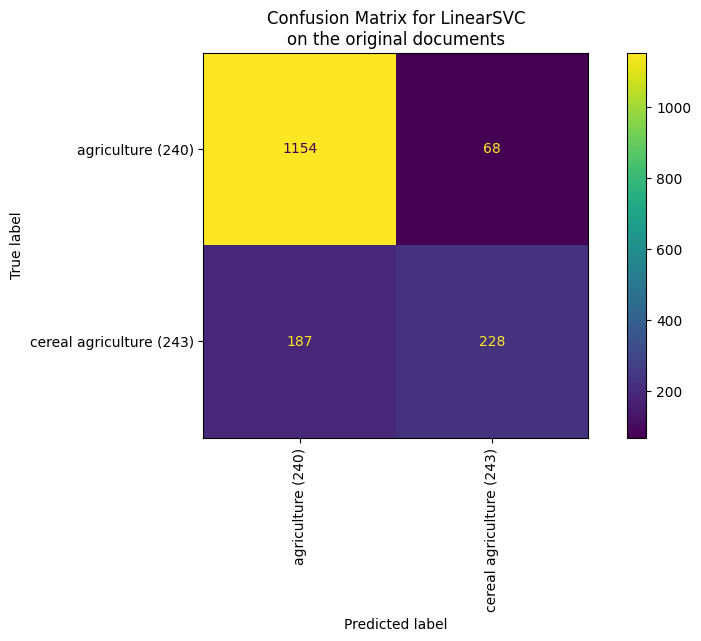

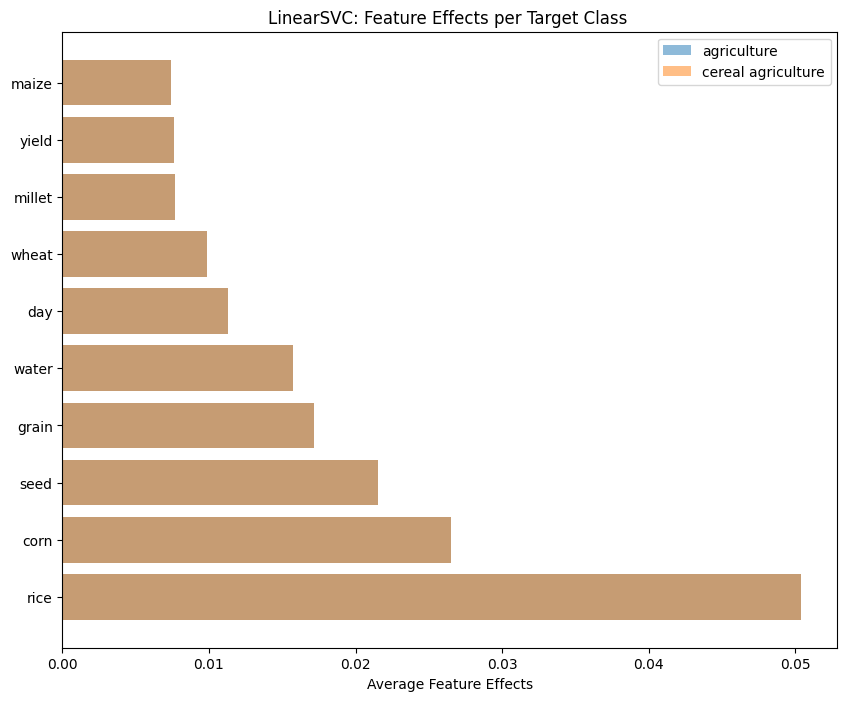

########## None RF 

########## Training RandomForestClassifier

########## 0.8271227855833843
              precision    recall  f1-score   support

         240      0.827     0.971     0.893      1222
         243      0.827     0.402     0.541       415

    accuracy                          0.827      1637
   macro avg      0.827     0.687     0.717      1637
weighted avg      0.827     0.827     0.804      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


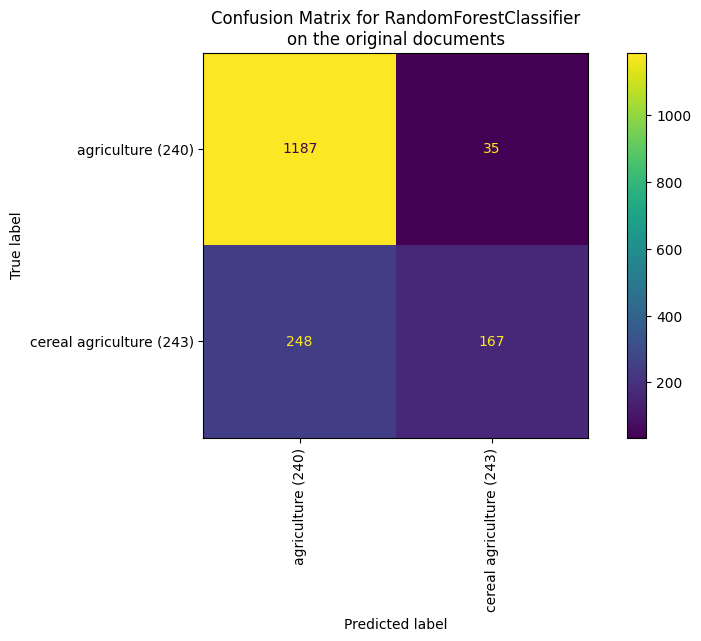

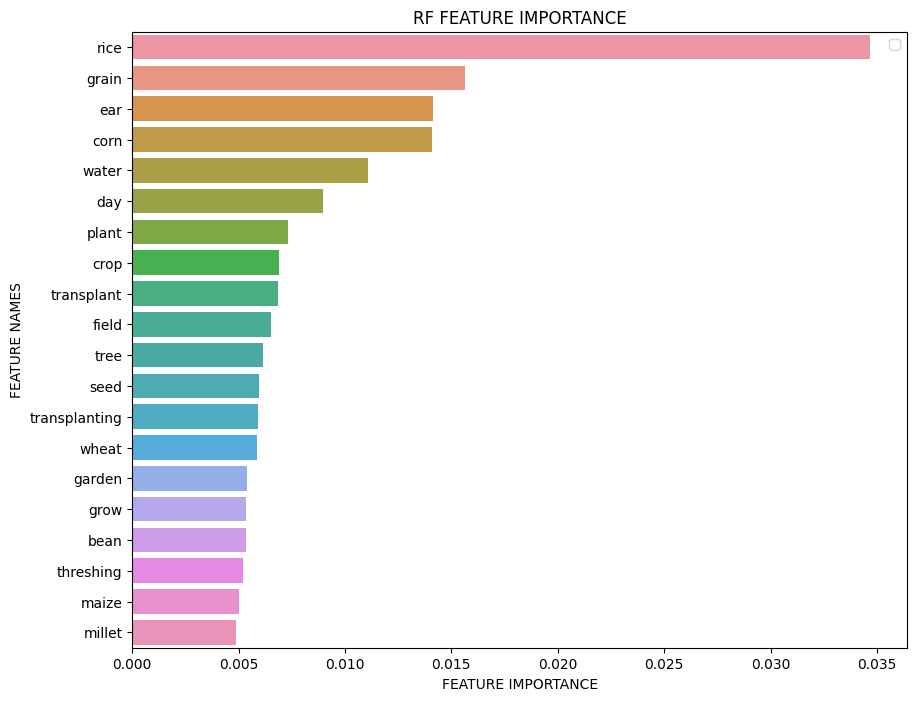

Iteration 2
Exclude: {'tree', 'maize', 'transplant', 'wheat', 'ear', 'yield', 'garden', 'crop', 'rice', 'water', 'grow', 'field', 'transplanting', 'corn', 'threshing', 'bean', 'grain', 'day', 'seed', 'millet', 'plant'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 52.530s at 0.068MB/s
n_samples: 6546, n_features: 4614
n_samples: 1637, n_features: 4614


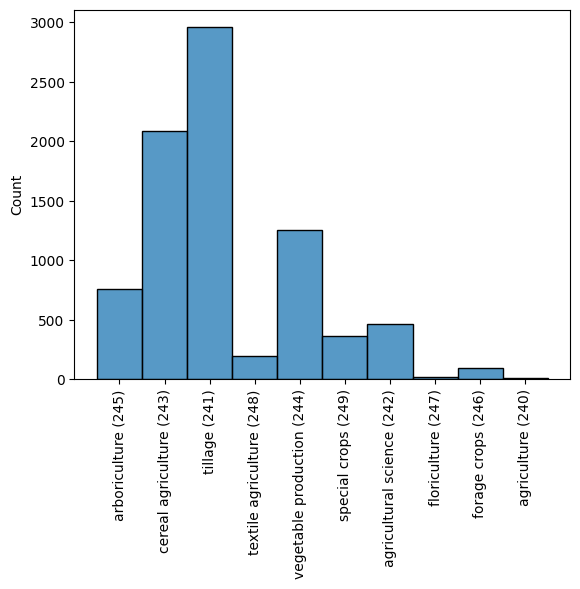

########## None LR 

########## Training LogisticRegression

########## 0.7959682345754429
              precision    recall  f1-score   support

         240      0.794     0.980     0.877      1218
         243      0.820     0.260     0.395       419

    accuracy                          0.796      1637
   macro avg      0.807     0.620     0.636      1637
weighted avg      0.800     0.796     0.754      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



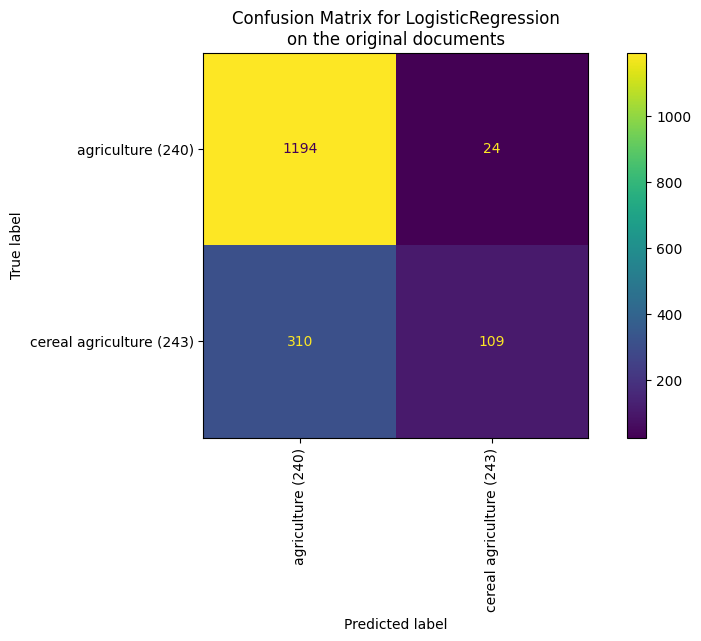

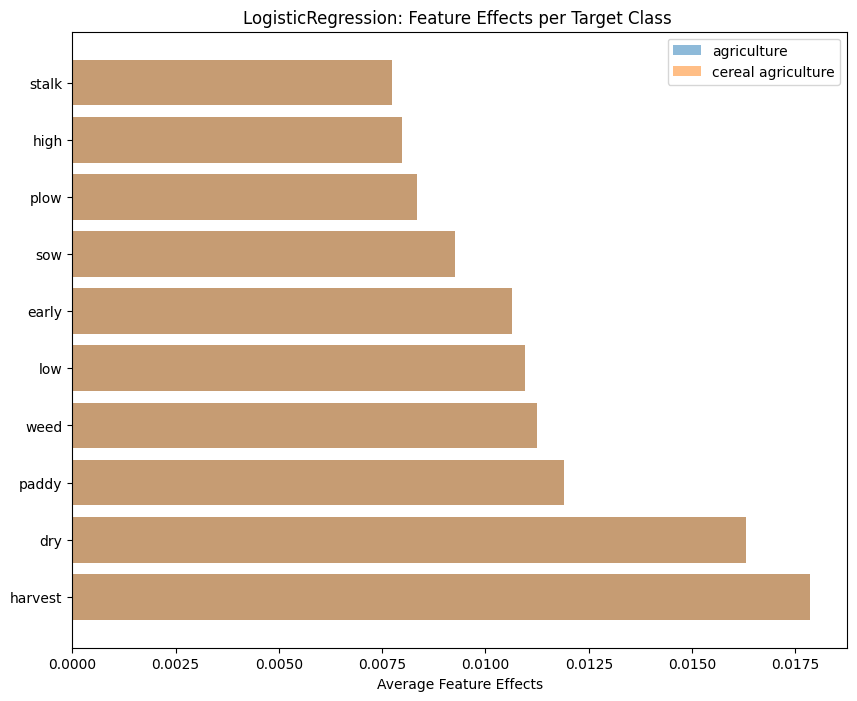

########## None SVM 

########## Training LinearSVC

########## 0.8130726939523518
              precision    recall  f1-score   support

         240      0.834     0.935     0.882      1218
         243      0.708     0.458     0.557       419

    accuracy                          0.813      1637
   macro avg      0.771     0.697     0.719      1637
weighted avg      0.802     0.813     0.798      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



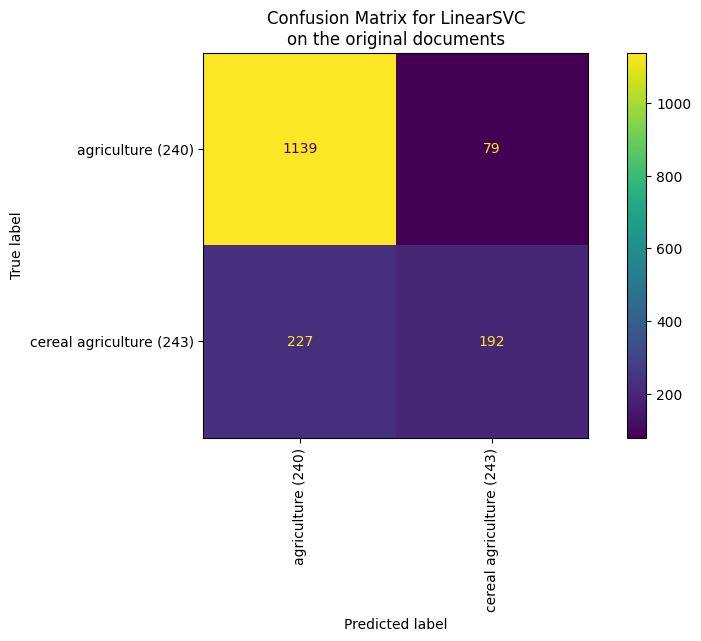

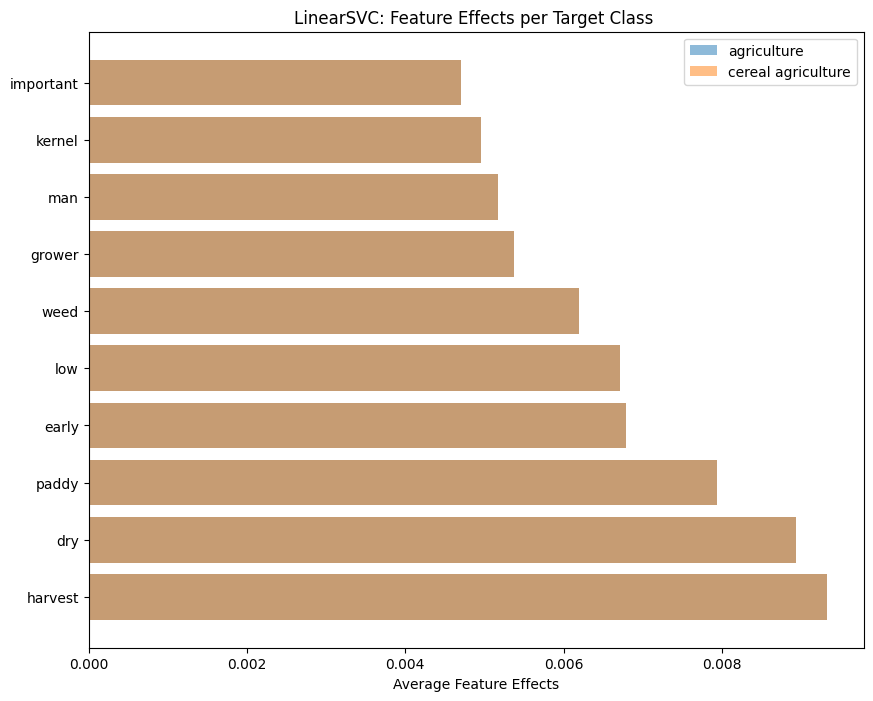

########## None RF 

########## Training RandomForestClassifier

########## 0.7892486255345144
              precision    recall  f1-score   support

         240      0.792     0.971     0.873      1218
         243      0.757     0.260     0.387       419

    accuracy                          0.789      1637
   macro avg      0.775     0.616     0.630      1637
weighted avg      0.783     0.789     0.748      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


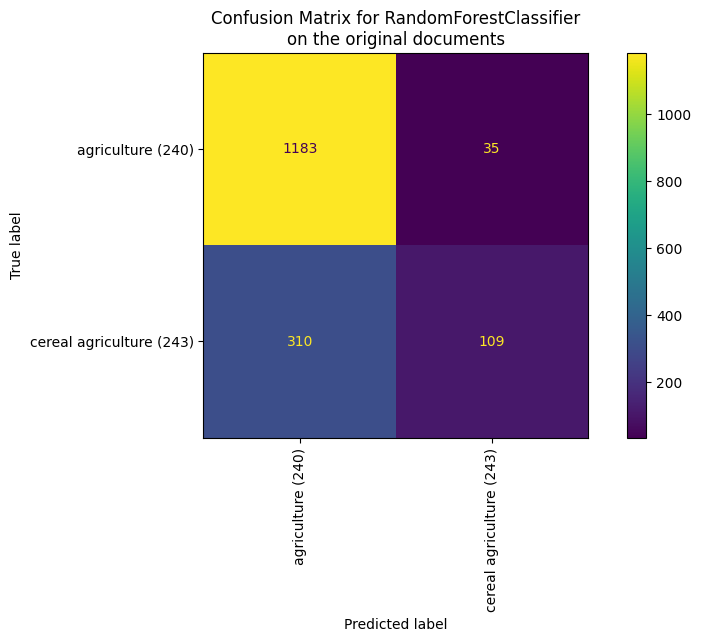

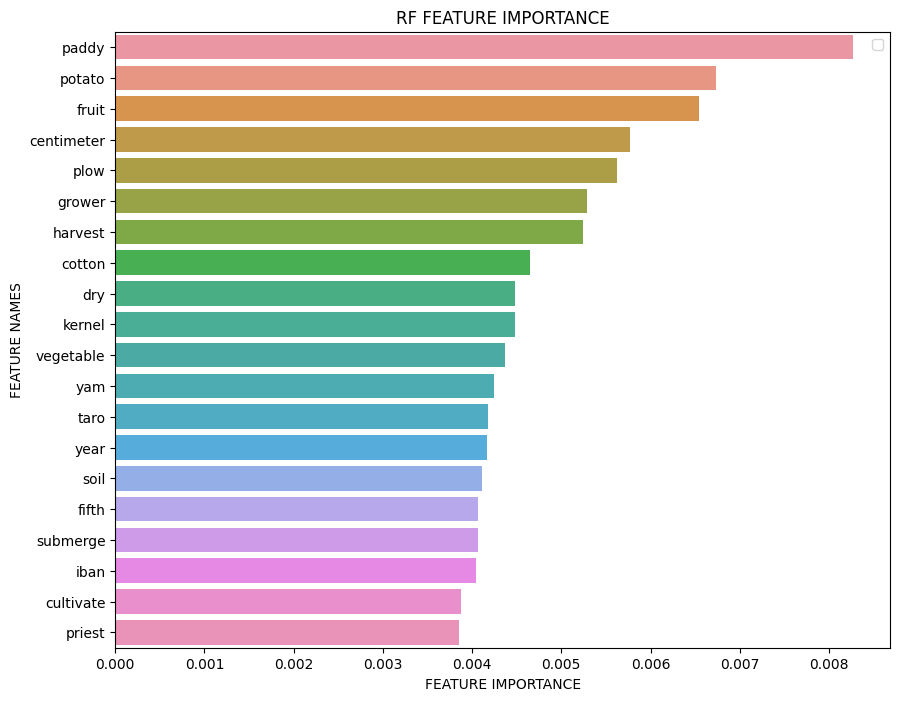

Iteration 3
Exclude: {'kernel', 'cultivate', 'wheat', 'ear', 'submerge', 'garden', 'crop', 'important', 'paddy', 'weed', 'grow', 'field', 'transplanting', 'iban', 'corn', 'threshing', 'bean', 'centimeter', 'potato', 'fruit', 'man', 'tree', 'early', 'maize', 'sow', 'transplant', 'yield', 'grower', 'rice', 'dry', 'harvest', 'low', 'water', 'vegetable', 'plow', 'taro', 'yam', 'year', 'stalk', 'soil', 'high', 'cotton', 'grain', 'day', 'fifth', 'seed', 'millet', 'plant', 'priest'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 57.319s at 0.062MB/s
n_samples: 6546, n_features: 4572
n_samples: 1637, n_features: 4572


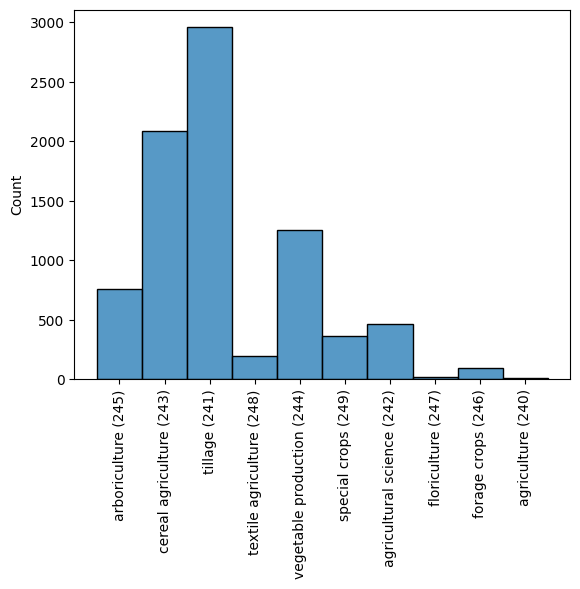

########## None LR 

########## Training LogisticRegression

########## 0.8063530849114233
              precision    recall  f1-score   support

         240      0.810     0.975     0.885      1252
         243      0.762     0.257     0.384       385

    accuracy                          0.806      1637
   macro avg      0.786     0.616     0.635      1637
weighted avg      0.799     0.806     0.767      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



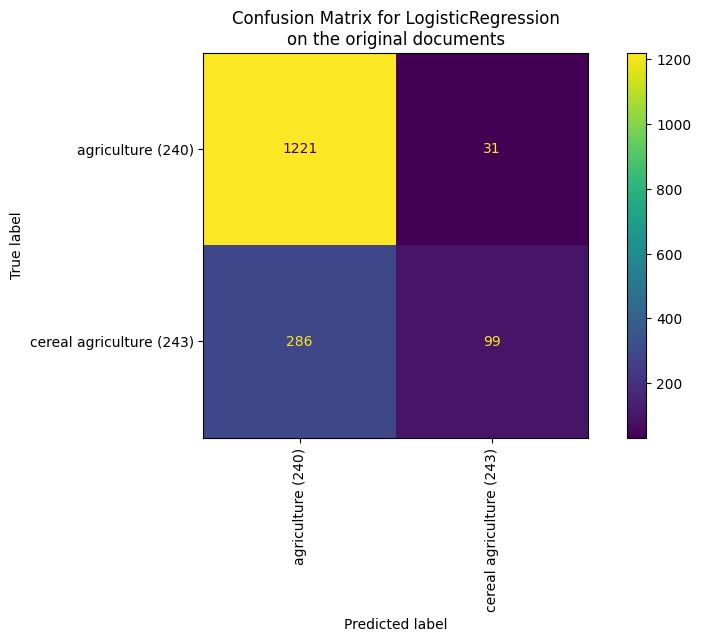

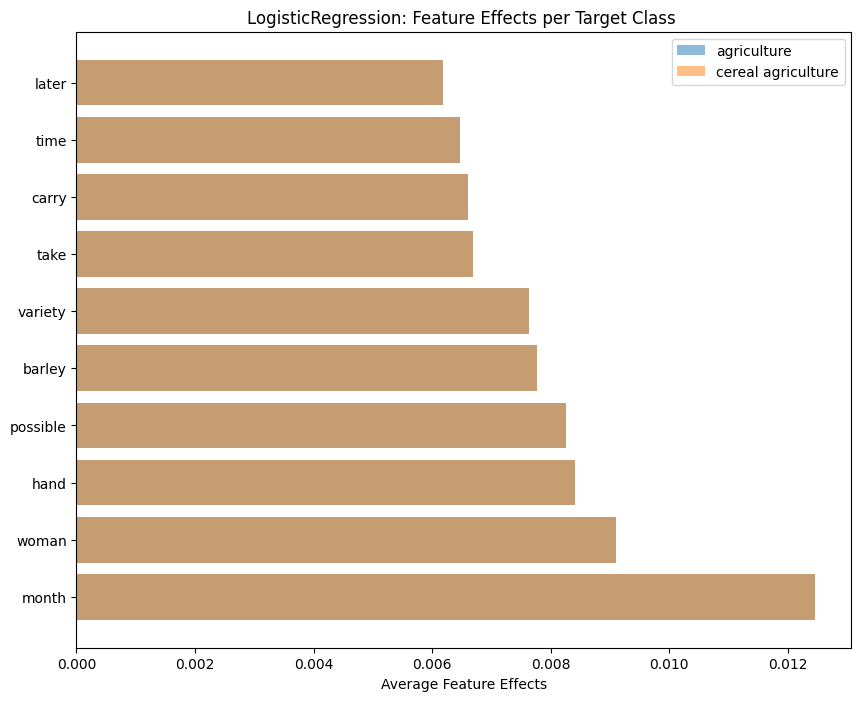

########## None SVM 

########## Training LinearSVC

########## 0.8130726939523518
              precision    recall  f1-score   support

         240      0.847     0.922     0.883      1252
         243      0.644     0.460     0.536       385

    accuracy                          0.813      1637
   macro avg      0.745     0.691     0.710      1637
weighted avg      0.799     0.813     0.801      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



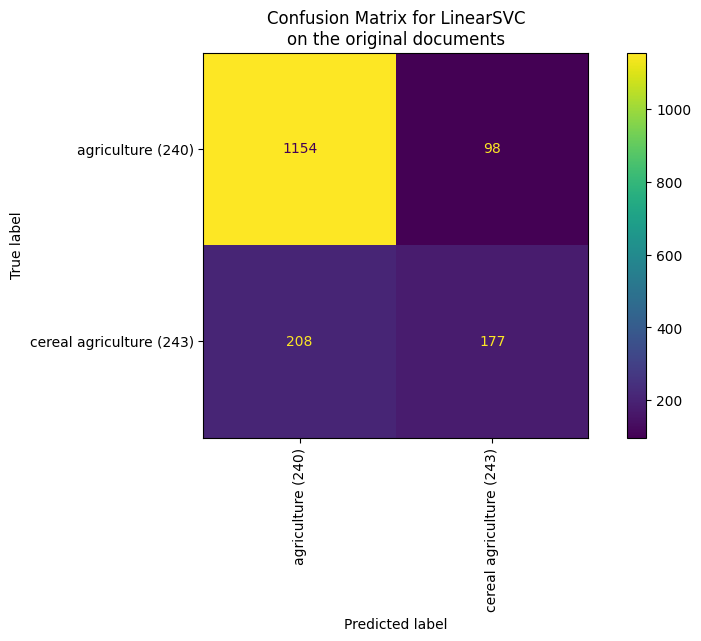

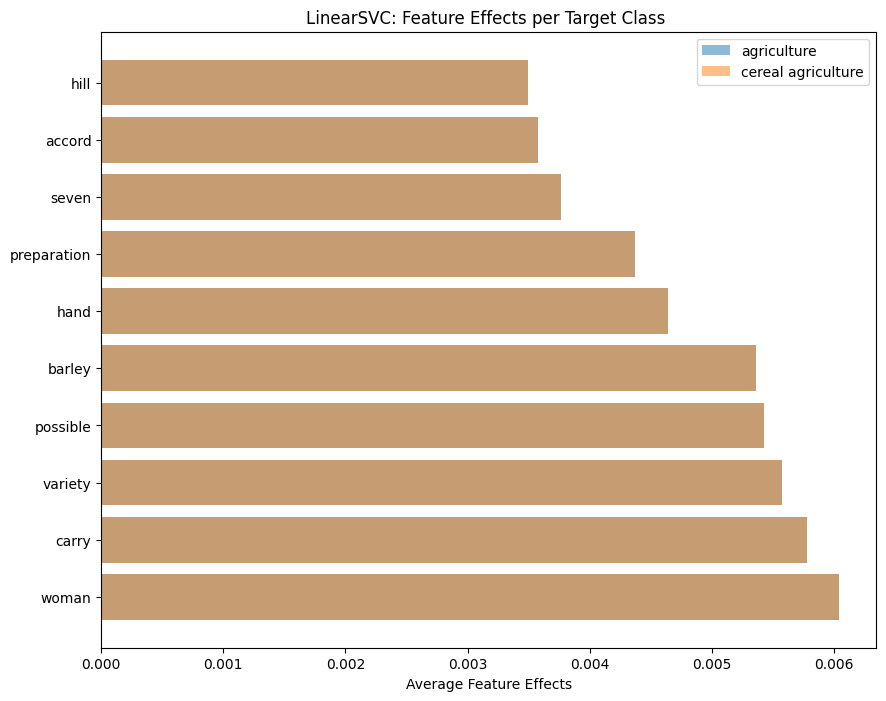

########## None RF 

########## Training RandomForestClassifier

########## 0.7892486255345144
              precision    recall  f1-score   support

         240      0.801     0.963     0.875      1252
         243      0.652     0.223     0.333       385

    accuracy                          0.789      1637
   macro avg      0.726     0.593     0.604      1637
weighted avg      0.766     0.789     0.747      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


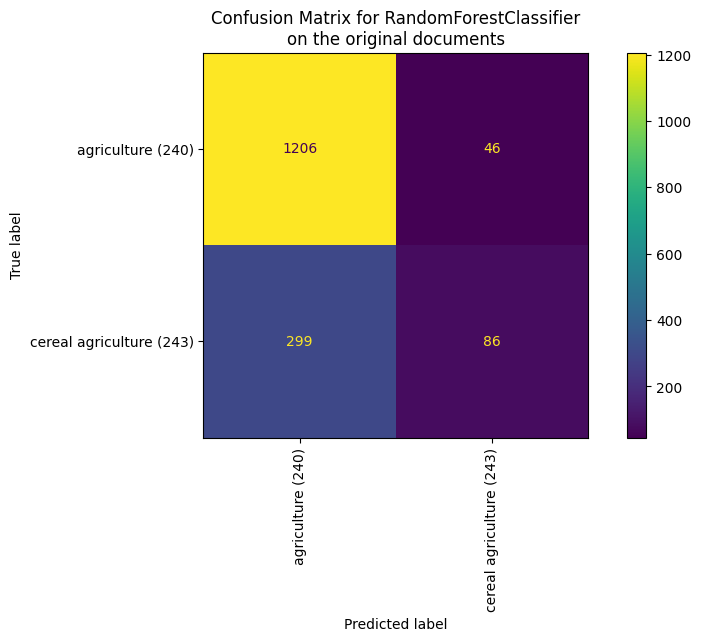

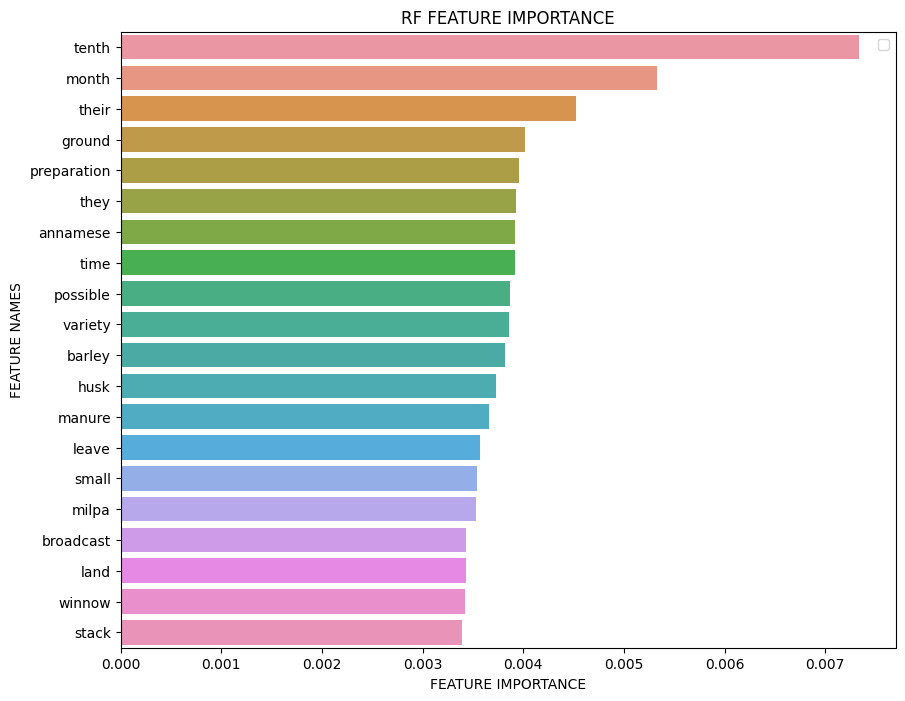

In [13]:
results = defaultdict(dict)

for i in [224, 226, 241, 243]:
    curr_results = iterative_process(common_indicators=False,
                                    models=['LR', 'SVM', 'RF'], 
                                    specific_cat=i, exact=True, 
                                    verbose=True)
    results[i] = curr_results

In [14]:
results

defaultdict(dict,
            {224: defaultdict(dict,
                         {0: {'df':         Unnamed: 0              sreid          section          sectpar   
                           78131        87343    na06-071-002371  na06-071-002369  na06-071-001727  \
                           181089      197576    st13-006-001922  st13-006-001842  st13-006-000155   
                           50323        55888  fk07-002-018631-0  fk07-002-018609              NaN   
                           165667      180955    ry04-001-028285  ry04-001-027130  ry04-001-019674   
                           108902      119355  nr13-001-001630-0  nr13-001-000888  nr13-001-000545   
                           ...            ...                ...              ...              ...   
                           149600      163999    oq06-001-007575  oq06-001-007554  oq06-001-007447   
                           99986       110057    nm07-009-002070  nm07-009-002034  nm07-009-000785   
                   

# Cat vs subcategories (multi-class classification)

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 46.723s at 0.083MB/s
n_samples: 6973, n_features: 4938
n_samples: 1744, n_features: 4938


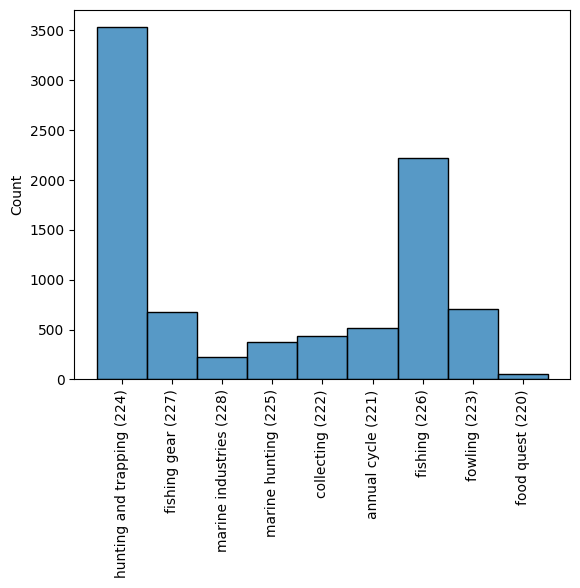

########## None LR 

########## Training LogisticRegression

########## 0.7614678899082569
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        11
         221      0.877     0.487     0.626       117
         222      0.940     0.553     0.696        85
         223      0.897     0.604     0.722       144
         224      0.718     0.970     0.825       676
         225      0.868     0.465     0.606        71
         226      0.774     0.850     0.810       474
         227      0.755     0.328     0.457       122
         228      0.833     0.114     0.200        44

    accuracy                          0.761      1744
   macro avg      0.740     0.486     0.549      1744
weighted avg      0.776     0.761     0.737      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

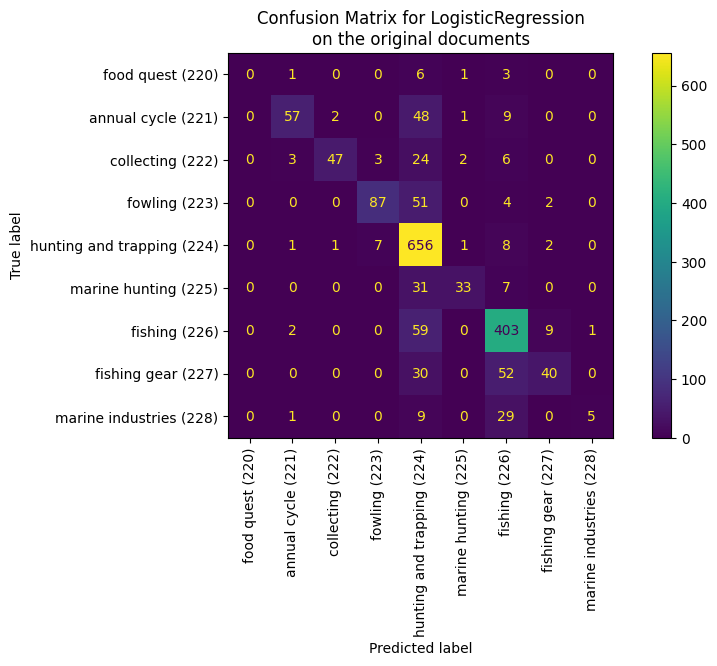

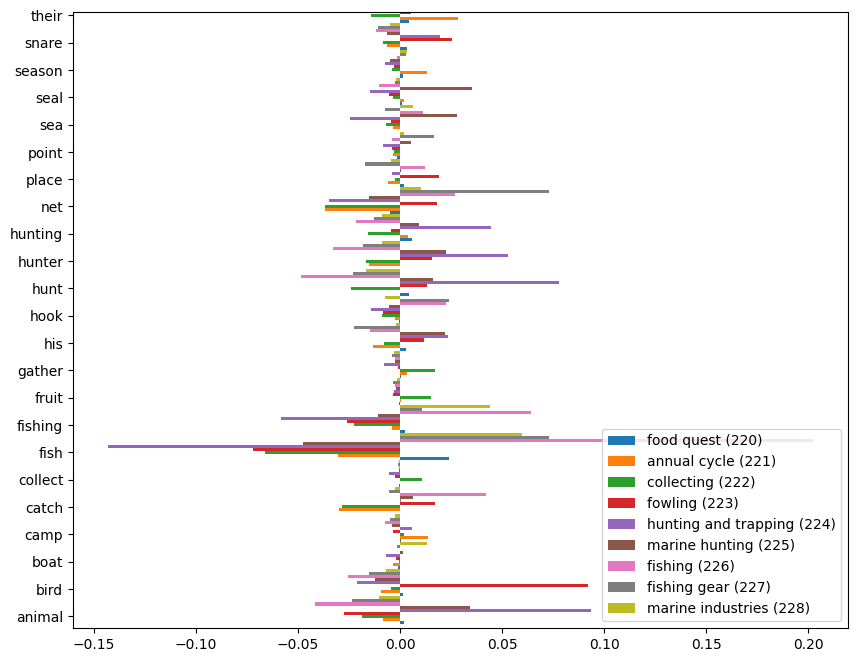

########## None SVM 

########## Training LinearSVC

########## 0.7924311926605505
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        11
         221      0.800     0.581     0.673       117
         222      0.824     0.659     0.732        85
         223      0.876     0.688     0.770       144
         224      0.768     0.950     0.849       676
         225      0.857     0.676     0.756        71
         226      0.815     0.827     0.821       474
         227      0.701     0.443     0.543       122
         228      0.852     0.523     0.648        44

    accuracy                          0.792      1744
   macro avg      0.721     0.594     0.644      1744
weighted avg      0.791     0.792     0.782      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



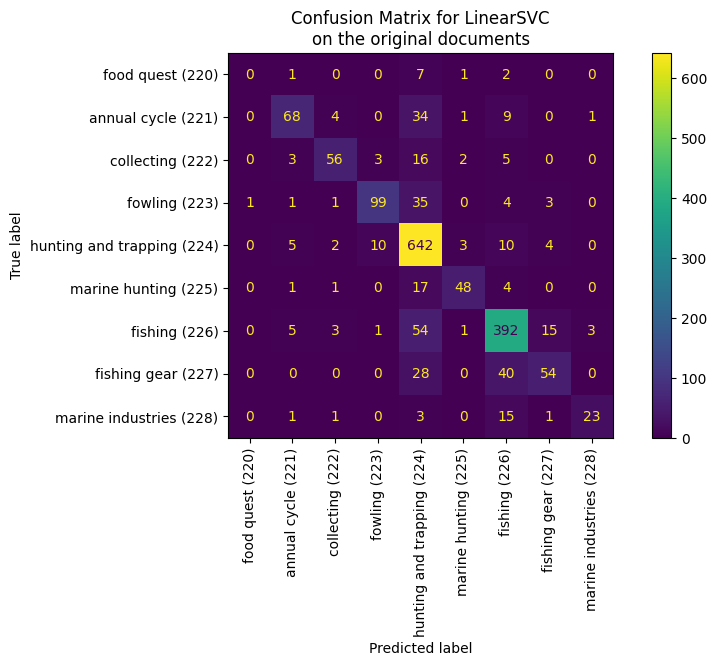

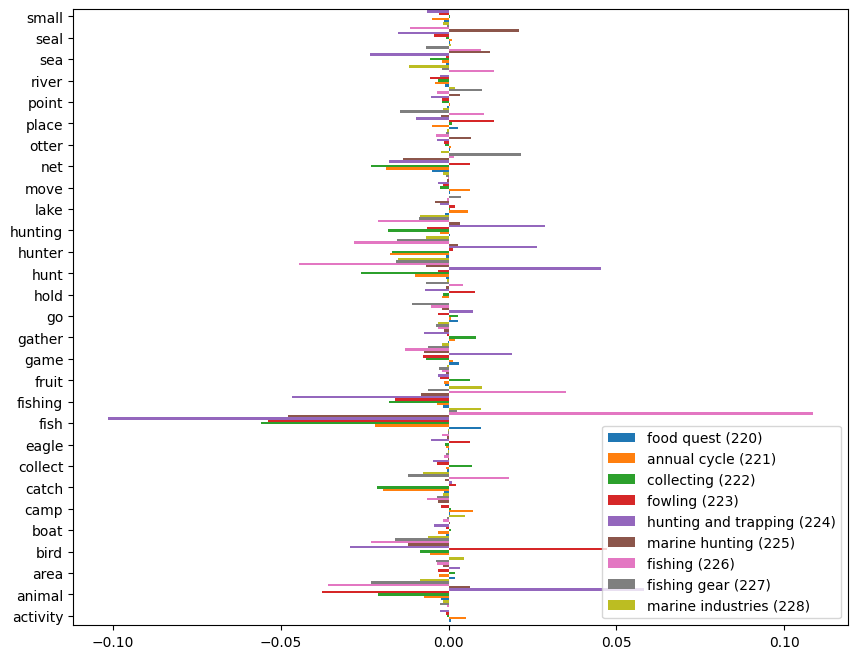

########## None RF 

########## Training RandomForestClassifier

########## 0.7201834862385321
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        11
         221      0.811     0.256     0.390       117
         222      0.896     0.506     0.647        85
         223      0.877     0.493     0.631       144
         224      0.683     0.956     0.797       676
         225      0.882     0.423     0.571        71
         226      0.723     0.848     0.781       474
         227      0.816     0.254     0.388       122
         228      1.000     0.068     0.128        44

    accuracy                          0.720      1744
   macro avg      0.743     0.423     0.481      1744
weighted avg      0.750     0.720     0.684      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


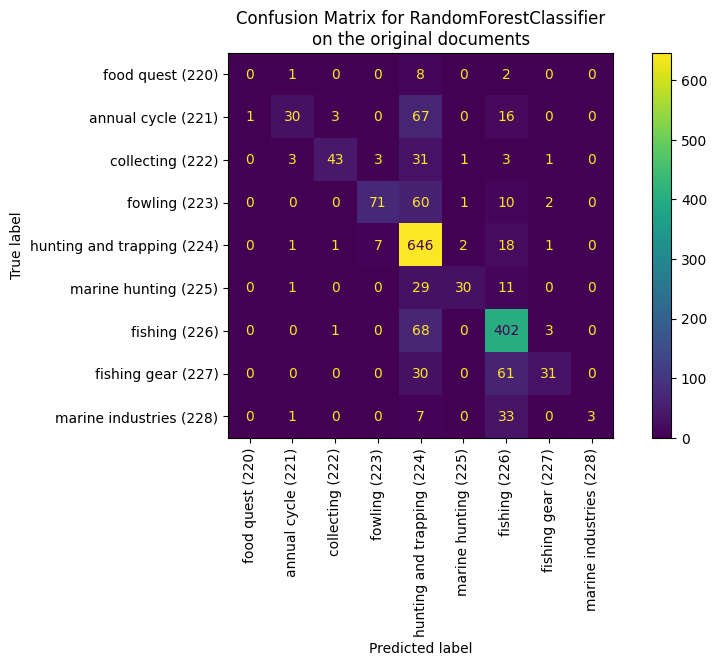

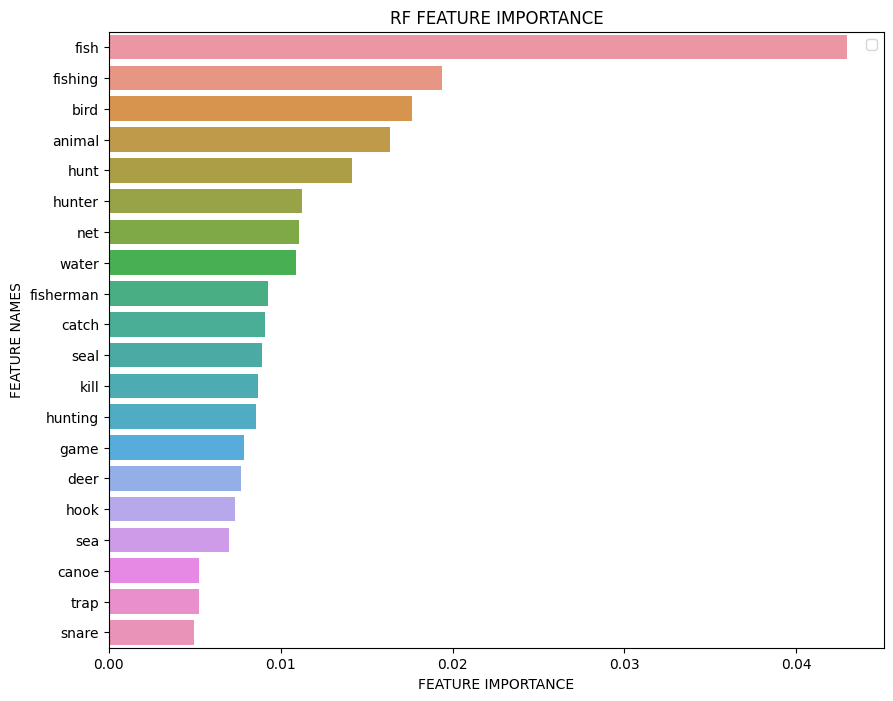

Iteration 2
Exclude: {'seal', 'collect', 'his', 'small', 'time', 'hook', 'sea', 'go', 'turtle', 'deer', 'bird', 'hunting', 'whale', 'canoe', 'fruit', 'trap', 'animal', 'place', 'hunt', 'gather', 'snare', 'fisherman', 'river', 'point', 'their', 'tree', 'boat', 'wild', 'camp', 'lake', 'catch', 'hunter', 'fish', 'water', 'game', 'kill', 'eagle', 'area', 'activity', 'move', 'fishing', 'net', 'hold', 'otter', 'winter', 'season'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 62.902s at 0.061MB/s
n_samples: 6973, n_features: 4859
n_samples: 1744, n_features: 4859


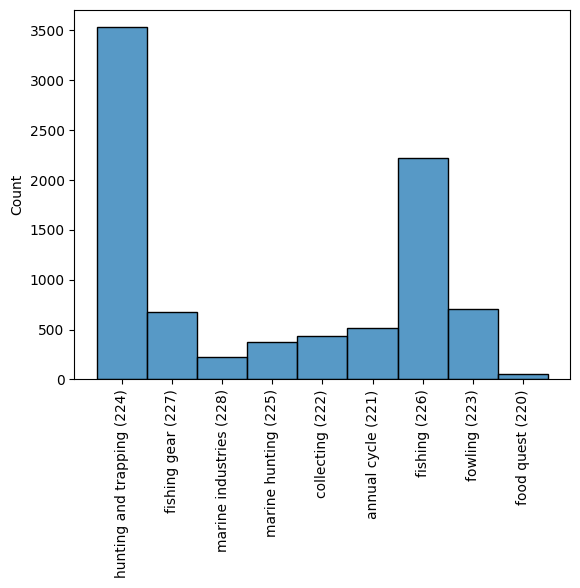

########## None LR 

########## Training LogisticRegression

########## 0.6903669724770642
              precision    recall  f1-score   support

         220      0.000     0.000     0.000         9
         221      0.771     0.352     0.484       105
         222      0.921     0.354     0.511        99
         223      0.839     0.388     0.531       121
         224      0.658     0.954     0.779       711
         225      0.929     0.186     0.310        70
         226      0.709     0.745     0.726       458
         227      0.657     0.354     0.460       130
         228      1.000     0.171     0.292        41

    accuracy                          0.690      1744
   macro avg      0.720     0.389     0.455      1744
weighted avg      0.721     0.690     0.657      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

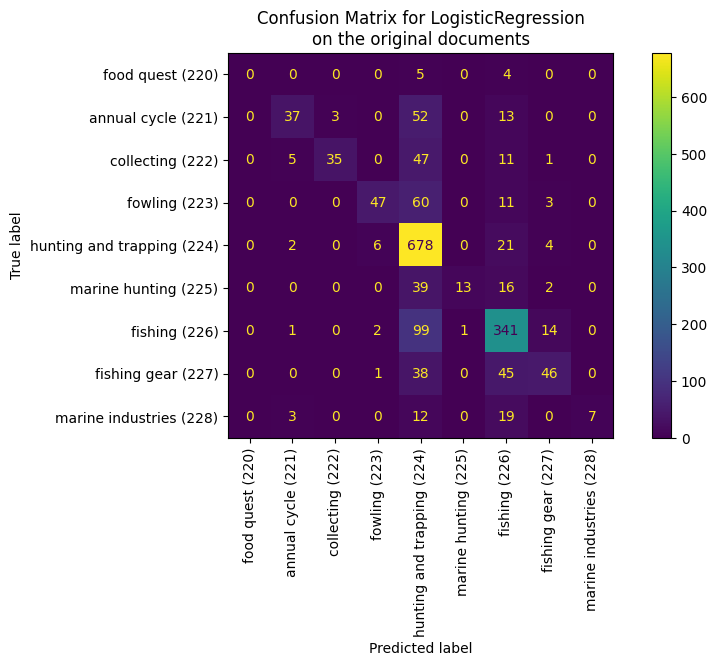

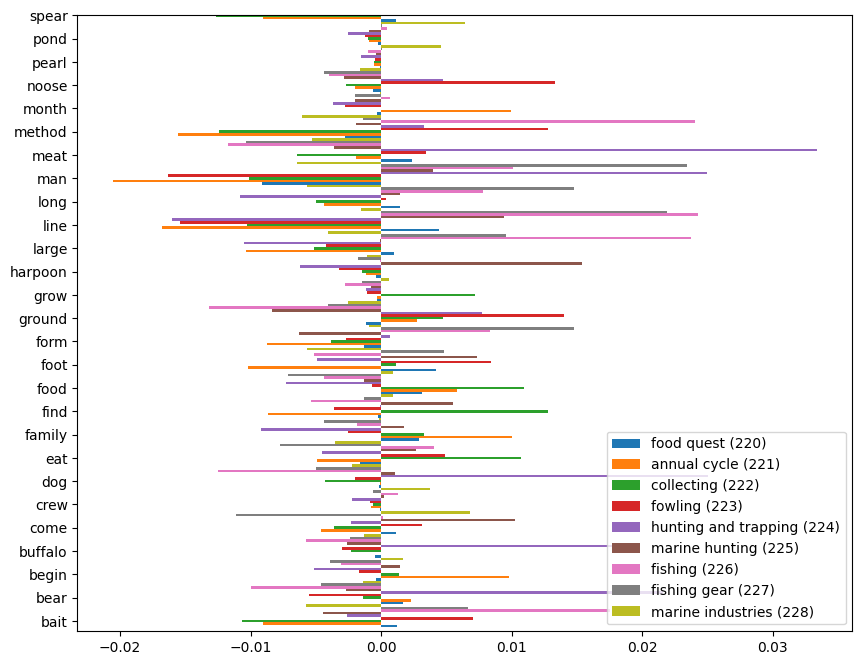

########## None SVM 

########## Training LinearSVC

########## 0.7196100917431193
              precision    recall  f1-score   support

         220      1.000     0.111     0.200         9
         221      0.623     0.457     0.527       105
         222      0.797     0.596     0.682        99
         223      0.711     0.570     0.633       121
         224      0.726     0.897     0.803       711
         225      0.718     0.400     0.514        70
         226      0.735     0.734     0.734       458
         227      0.616     0.408     0.491       130
         228      0.676     0.561     0.613        41

    accuracy                          0.720      1744
   macro avg      0.734     0.526     0.577      1744
weighted avg      0.717     0.720     0.707      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



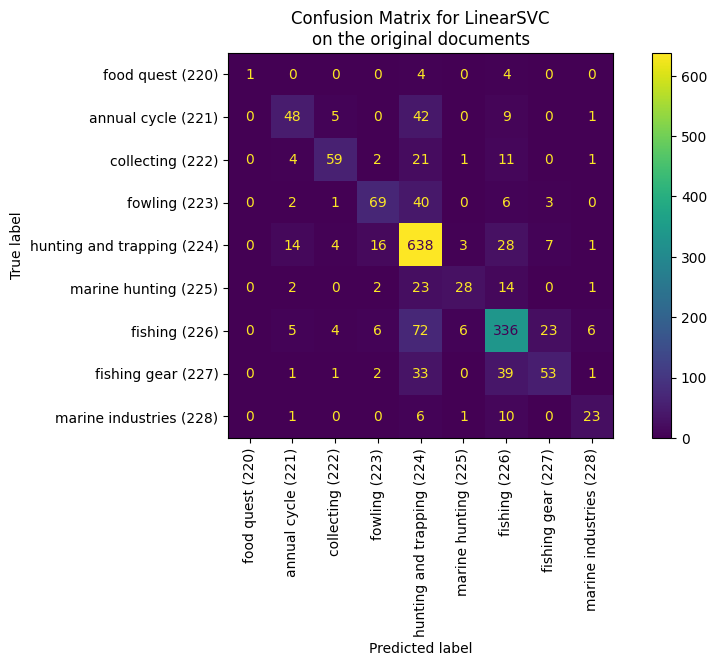

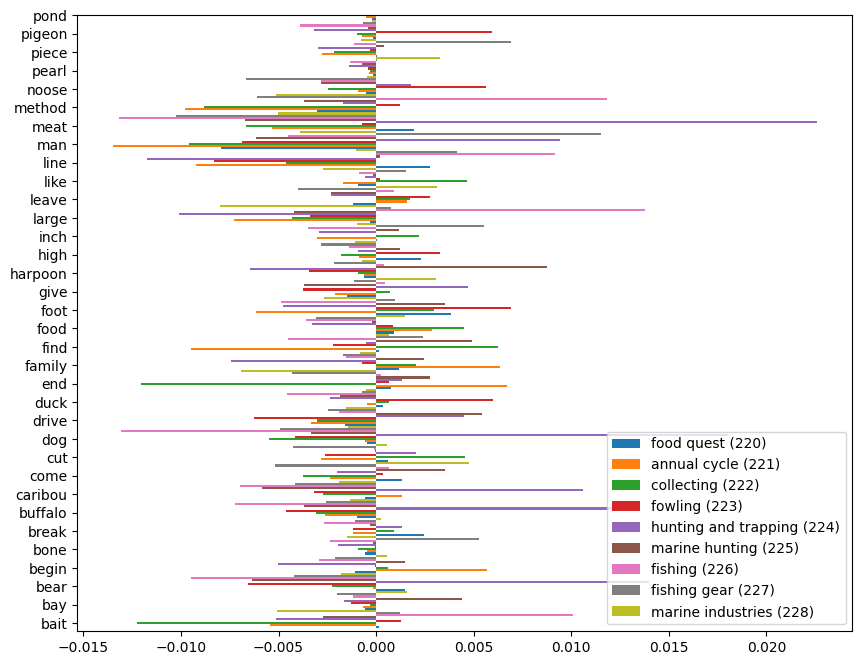

########## None RF 

########## Training RandomForestClassifier

########## 0.6599770642201835
              precision    recall  f1-score   support

         220      0.000     0.000     0.000         9
         221      0.690     0.276     0.395       105
         222      0.741     0.404     0.523        99
         223      0.846     0.273     0.413       121
         224      0.650     0.934     0.766       711
         225      0.714     0.143     0.238        70
         226      0.645     0.731     0.686       458
         227      0.711     0.246     0.366       130
         228      0.889     0.195     0.320        41

    accuracy                          0.660      1744
   macro avg      0.654     0.356     0.412      1744
weighted avg      0.679     0.660     0.619      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


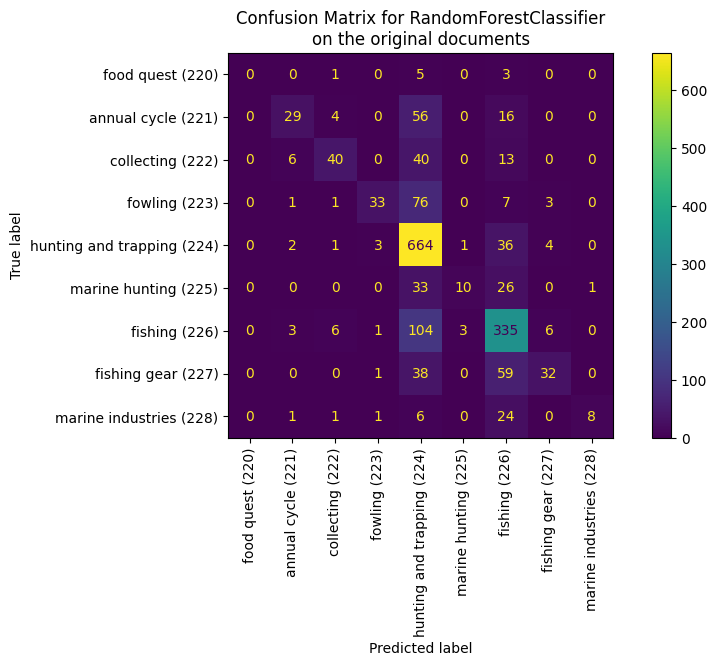

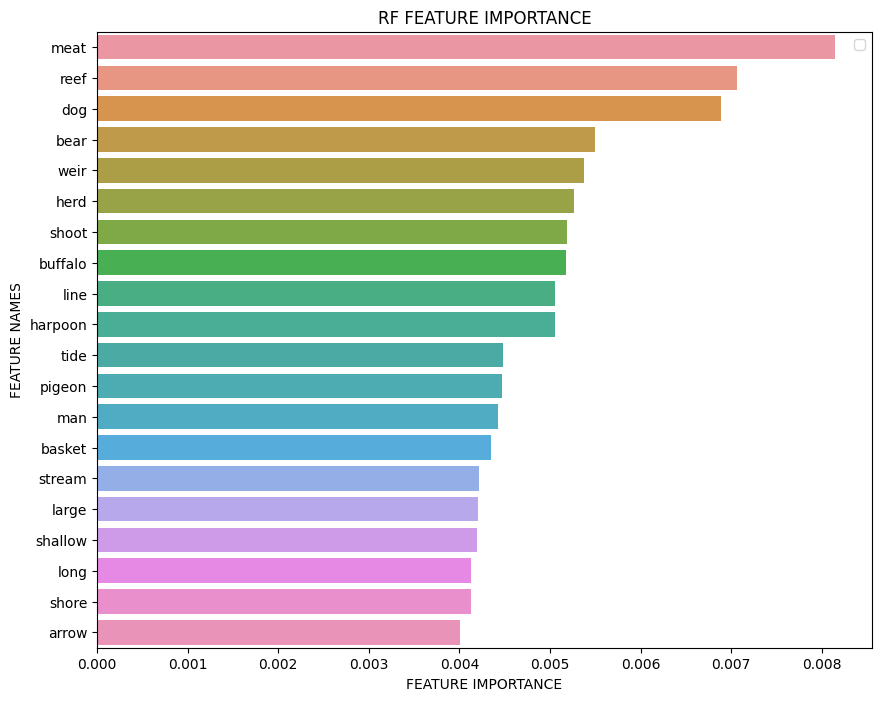

Iteration 3
Exclude: {'seal', 'piece', 'end', 'caribou', 'foot', 'time', 'large', 'noose', 'go', 'turtle', 'deer', 'bird', 'pigeon', 'hunting', 'grow', 'month', 'long', 'whale', 'bear', 'summer', 'man', 'find', 'like', 'snare', 'fisherman', 'point', 'tide', 'boat', 'pond', 'usually', 'break', 'line', 'wild', 'meat', 'spear', 'reef', 'fish', 'water', 'kill', 'eagle', 'drive', 'high', 'they', 'crew', 'net', 'eat', 'herd', 'form', 'winter', 'leave', 'food', 'ground', 'come', 'family', 'collect', 'his', 'type', 'small', 'give', 'weir', 'hook', 'sea', 'shore', 'arrow', 'stream', 'tell', 'begin', 'canoe', 'dog', 'shallow', 'fruit', 'trap', 'animal', 'hunt', 'cut', 'gather', 'river', 'their', 'inch', 'tree', 'shoot', 'buffalo', 'woman', 'bay', 'basket', 'bait', 'camp', 'harpoon', 'bone', 'lake', 'catch', 'hunter', 'pearl', 'duck', 'game', 'year', 'area', 'method', 'activity', 'move', 'work', 'fishing', 'use', 'stick', 'hold', 'otter', 'place', 'season'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 75.902s at 0.051MB/s
n_samples: 6973, n_features: 4776
n_samples: 1744, n_features: 4776


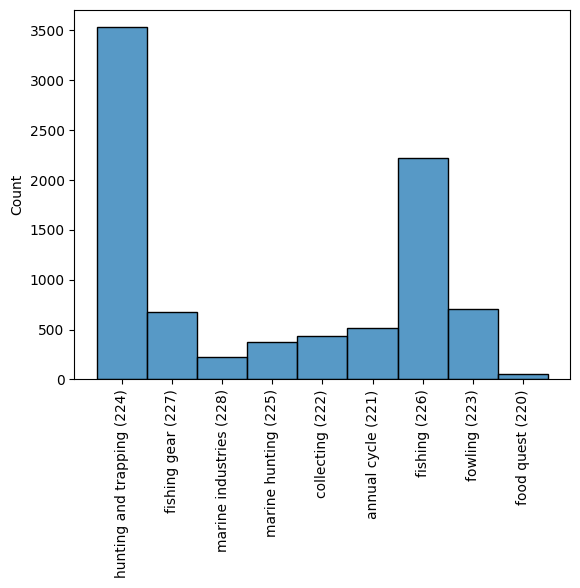

########## None LR 

########## Training LogisticRegression

########## 0.6530963302752294
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        13
         221      0.750     0.202     0.318       104
         222      0.811     0.370     0.508        81
         223      0.788     0.275     0.408       149
         224      0.653     0.946     0.773       745
         225      1.000     0.054     0.103        74
         226      0.605     0.724     0.659       413
         227      0.804     0.294     0.430       126
         228      0.667     0.051     0.095        39

    accuracy                          0.653      1744
   macro avg      0.675     0.324     0.366      1744
weighted avg      0.687     0.653     0.601      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

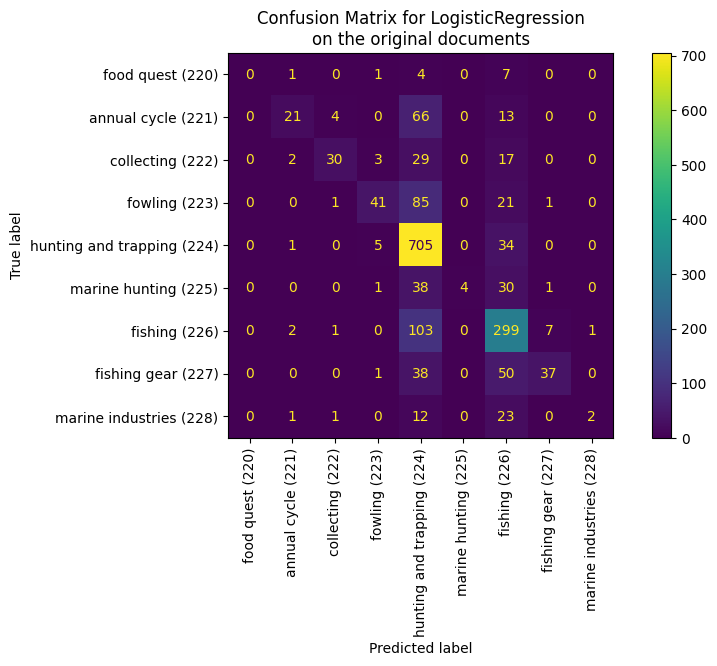

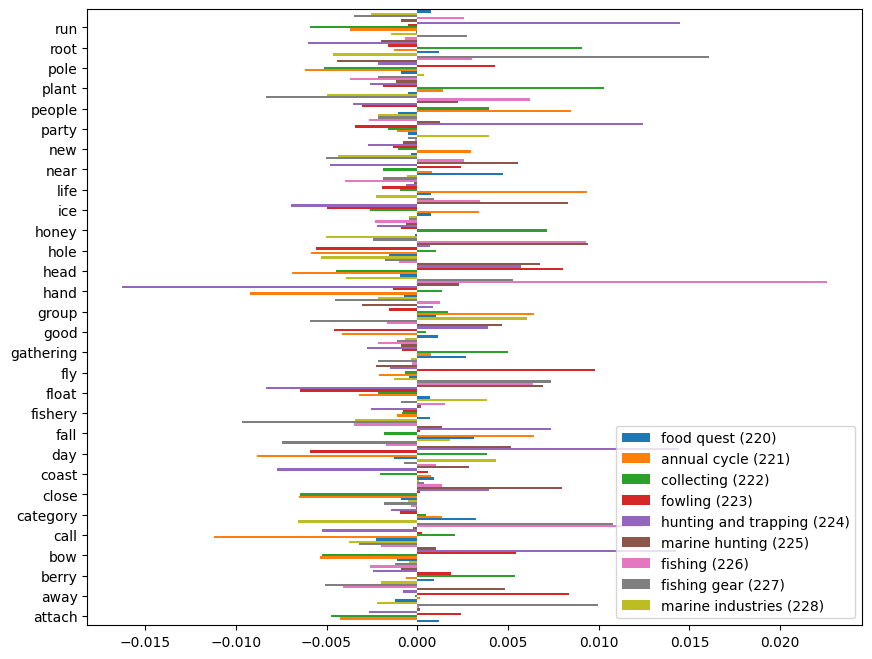

########## None SVM 

########## Training LinearSVC

########## 0.6920871559633027
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        13
         221      0.682     0.433     0.529       104
         222      0.839     0.642     0.727        81
         223      0.756     0.456     0.569       149
         224      0.712     0.895     0.793       745
         225      0.765     0.351     0.481        74
         226      0.629     0.692     0.659       413
         227      0.646     0.405     0.498       126
         228      0.571     0.308     0.400        39

    accuracy                          0.692      1744
   macro avg      0.622     0.465     0.517      1744
weighted avg      0.689     0.692     0.674      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

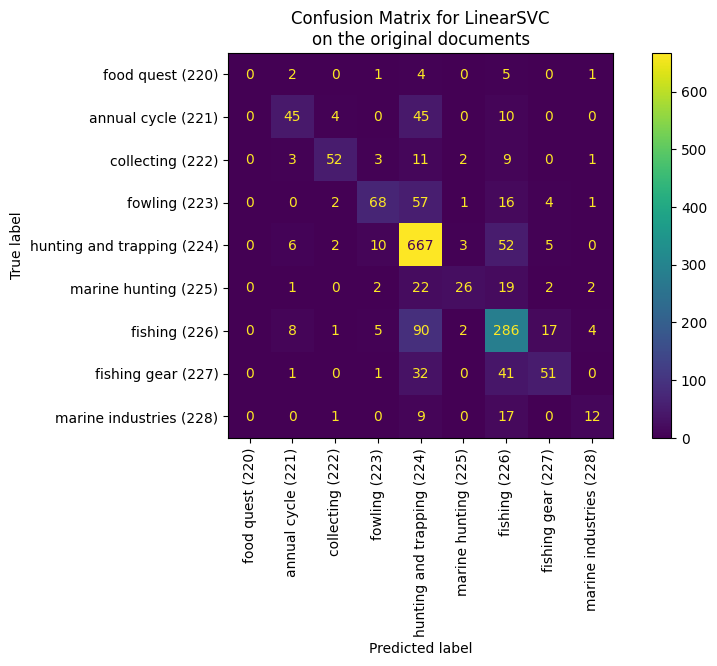

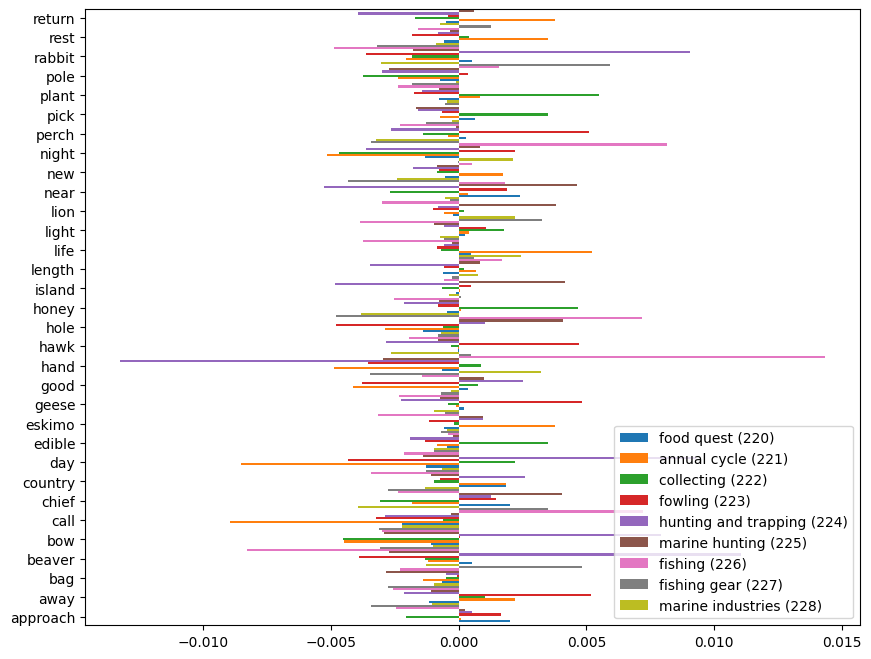

########## None RF 

########## Training RandomForestClassifier

########## 0.6192660550458715
              precision    recall  f1-score   support

         220      0.000     0.000     0.000        13
         221      0.568     0.240     0.338       104
         222      0.711     0.395     0.508        81
         223      0.712     0.282     0.404       149
         224      0.637     0.903     0.747       745
         225      1.000     0.014     0.027        74
         226      0.563     0.671     0.612       413
         227      0.619     0.206     0.310       126
         228      0.800     0.103     0.182        39

    accuracy                          0.619      1744
   macro avg      0.623     0.313     0.347      1744
weighted avg      0.638     0.619     0.570      1744



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


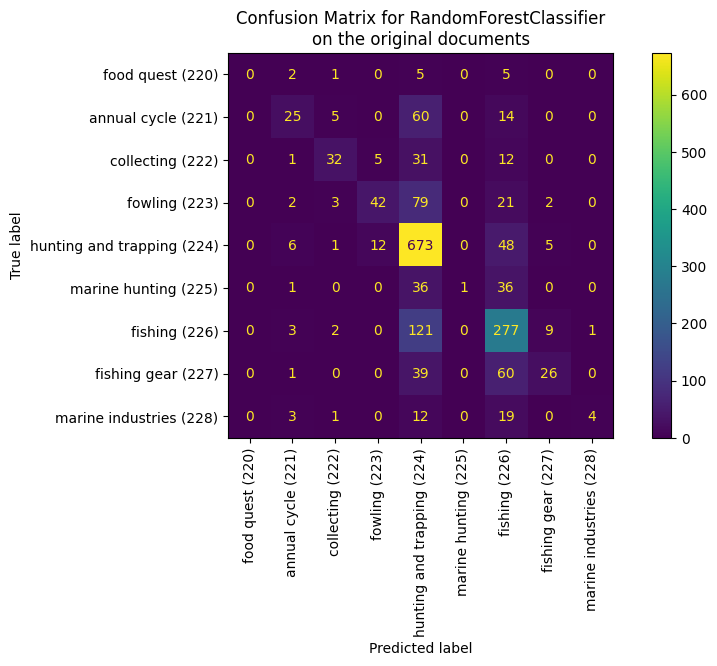

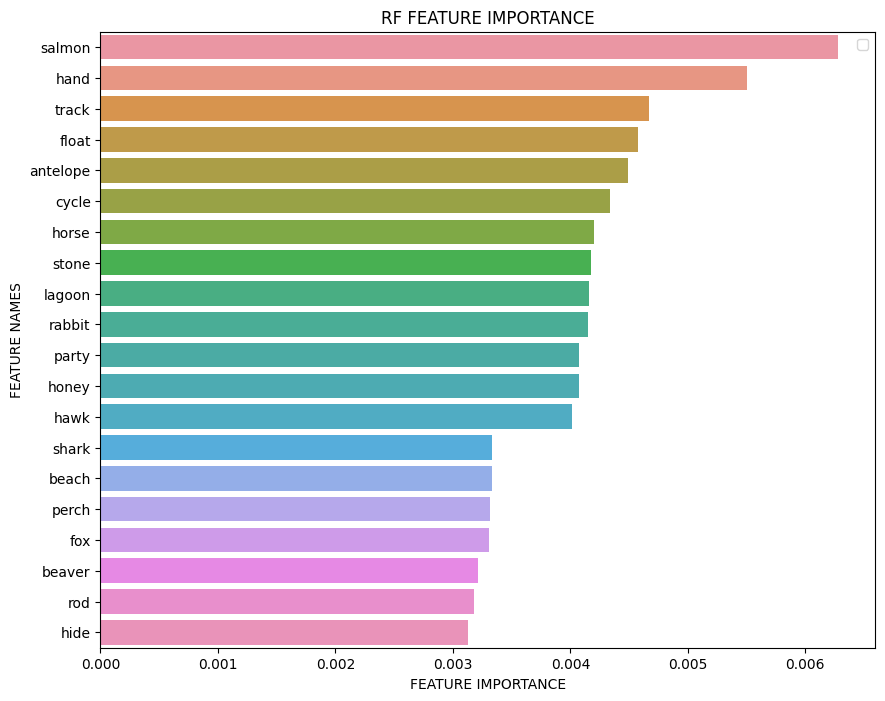

Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 42.342s at 0.084MB/s
n_samples: 6546, n_features: 4658
n_samples: 1637, n_features: 4658


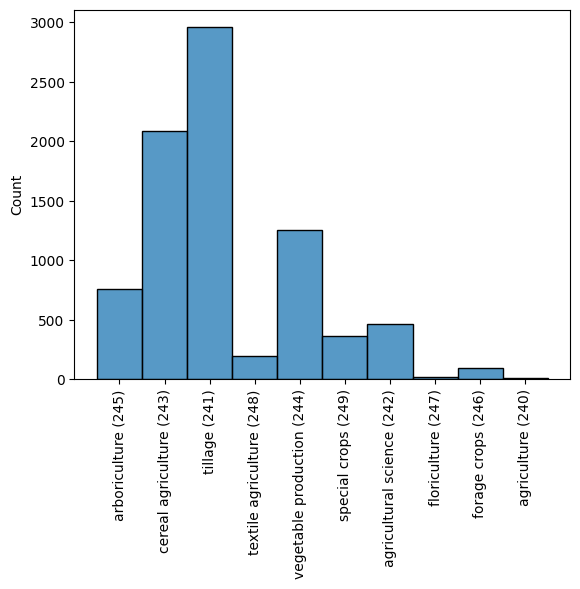

########## None LR 

########## Training LogisticRegression

########## 0.5992669517409897
              precision    recall  f1-score   support

         241      0.492     0.781     0.604       553
         242      0.600     0.074     0.132        81
         243      0.689     0.639     0.663       443
         244      0.684     0.510     0.584       259
         245      0.873     0.644     0.741       160
         246      0.000     0.000     0.000        17
         247      0.000     0.000     0.000         5
         248      1.000     0.225     0.367        40
         249      0.889     0.203     0.330        79

    accuracy                          0.599      1637
   macro avg      0.581     0.342     0.380      1637
weighted avg      0.643     0.599     0.580      1637



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



ValueError: The number of FixedLocator locations (9), usually from a call to set_ticks, does not match the number of labels (10).

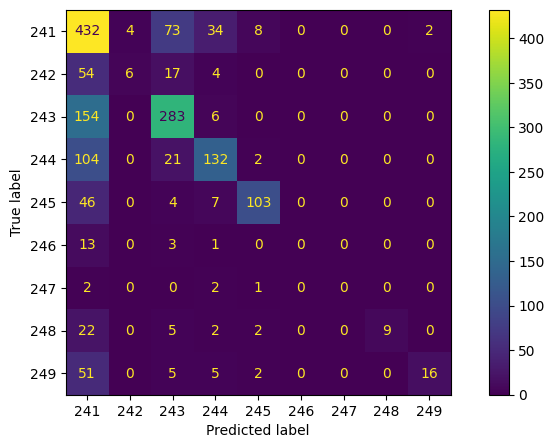

In [15]:
results = defaultdict(dict)
for i in [220, 240]:
    curr_results = iterative_process(common_indicators=False,
                                    models=['LR', 'SVM', 'RF'], 
                                    specific_cat=i, exact=False, 
                                    verbose=True)
    results[i] = curr_results

In [ ]:
results

- categorize features for each culture
- measure the sim between cultures based on these categories?
- this would allow comparing cultures based on the sim of these features across cultures based on some threshold (e.g. tfidf)
- they indicate the levels/types of the usage/facts of these cultures;
    - e.g. one culture is more advanced in using tools
    - e.g. en